# Problem Statement

##Project Description
Image classification using CNNs in TensorFlow

##Description

You are provided with a dataset  of  images of  plant seedlings at various stages of  grown.  Each image has a filename that is its unique  id.  The  dataset  comprises  12  plant  species.  The  goal  of  the  project  is  to  create  a  classifier  capable  of  determining  a plant's species from a photo.

# Library Loading

A few things don't come pre-loaded into Colab, so I have to install them.

In [1]:
pip install tensorflow_io

     |████████████████████████████████| 23.1 MB 86.1 MB/s 


In [2]:
pip install tensorflow-addons

     |████████████████████████████████| 1.1 MB 34.0 MB/s 


In [3]:
#For loading the files
import os
import zipfile
import pathlib
import numpy as np
import pandas as pd

# Visualizations
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import cv2
from google.colab.patches import cv2_imshow
import itertools
from sklearn.metrics import confusion_matrix
from sklearn.decomposition import PCA
from math import ceil

#Model building
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Activation
from tensorflow.keras import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa
import tensorflow_io as tfio
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import MultiLabelBinarizer

#Preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

# For managing memory
import gc

In [4]:
#I'm using colab so I have to connect to my Google Drive.
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Loading the Data

In [5]:
#Loading the data and its labels
data = np.load('/content/drive/MyDrive/UT_Course_project_notebooks/images.npy')
labels = pd.read_csv('/content/drive/MyDrive/UT_Course_project_notebooks/Labels.csv')

In [6]:
# Copying the data so we don't screw up the original files somehow
df = data.copy()
df_labels = labels.copy()

In [7]:
# Now that we've made copies, we can clear the original data from our memory.
del(data)
del(labels)
gc.collect()

122

In [8]:
# Find the shape of the data, minus labels
df.shape

(4750, 128, 128, 3)

It seems we have 4750 128x128 color images in our dataset.

In [9]:
#Checking for missing values in any element in our numpy array
(np.equal(df, None) == True).sum()

0

No missing values from our numpy array. Let's check the labels.

In [10]:
#Let's make sure each one is labeled
df_labels.shape

(4750, 1)

In [11]:
# Similarly checking for missing values
(df_labels.isna() == True).sum()

Label    0
dtype: int64

Every image is labeled, good. No missing values.


# Plant Image EDA

I'd like to actually look at some of these images.

In [12]:
df[0]

array([[[ 35,  52,  78],
        [ 36,  49,  76],
        [ 31,  45,  69],
        ...,
        [ 78,  95, 114],
        [ 76,  93, 110],
        [ 80,  95, 109]],

       [[ 33,  46,  68],
        [ 37,  50,  73],
        [ 48,  65,  83],
        ...,
        [ 81,  96, 113],
        [ 74,  89, 105],
        [ 83,  95, 109]],

       [[ 34,  50,  68],
        [ 35,  52,  72],
        [ 70,  85, 101],
        ...,
        [ 83,  97, 112],
        [ 79,  94, 108],
        [ 79,  94, 107]],

       ...,

       [[ 35,  50,  69],
        [ 42,  57,  73],
        [ 42,  57,  72],
        ...,
        [ 60,  76,  92],
        [ 67,  81,  97],
        [ 64,  77,  95]],

       [[ 36,  52,  67],
        [ 48,  63,  78],
        [ 41,  57,  73],
        ...,
        [ 44,  66,  83],
        [ 58,  76,  91],
        [ 57,  74,  90]],

       [[ 44,  58,  70],
        [ 43,  57,  73],
        [ 40,  55,  72],
        ...,
        [ 41,  70,  92],
        [ 55,  78,  97],
        [ 61,  79,  96]]

That's a big-ol' tensor. All the values are between 0-255 as expected, so we should be able to display it as a picture.

In [13]:
# Let's look at some images of plants.
def plant_img(df=df,index=-1):
    """
    This function displays a random plant unless you give the function the index number you want.
    Then it displays that index specifically.
    """
    if index == -1:
      index = random.randint(0,4751)
    else:
      index = index
    plant_name = df_labels['Label'][index]
    plt.imshow(df[index])
    plt.title(f'Image of a {plant_name}, index number {index}')
    plt.axis(False)

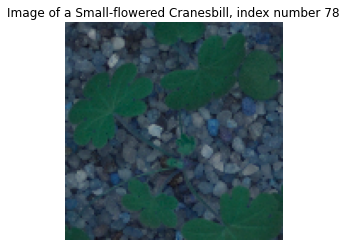

In [14]:
plant_img()

I've looked at a host of random plants. It seems like each image is a picture of a small plant sprout of various species. Let's take a closer look at the types of plants we're looking at.

In [15]:
#This will get us the unique values
unique_plant_count = len(list(df_labels['Label'].unique()))
df_labels['Label'].unique(), print(f'There are {unique_plant_count} different plants in the dataset')

There are 12 different plants in the dataset


(array(['Small-flowered Cranesbill', 'Fat Hen', 'Shepherds Purse',
        'Common wheat', 'Common Chickweed', 'Charlock', 'Cleavers',
        'Scentless Mayweed', 'Sugar beet', 'Maize', 'Black-grass',
        'Loose Silky-bent'], dtype=object), None)

I need to check if each plant type is evenly represented: Do we have an imbalanced dataset?

In [16]:
#We know what plants we're looking at, now we want to see how many pictures of each we have.
df_labels.Label.value_counts()

Loose Silky-bent             654
Common Chickweed             611
Scentless Mayweed            516
Small-flowered Cranesbill    496
Fat Hen                      475
Charlock                     390
Sugar beet                   385
Cleavers                     287
Black-grass                  263
Shepherds Purse              231
Maize                        221
Common wheat                 221
Name: Label, dtype: int64

We do not have an even representation of the different plants, some have far more images than others. This may be something we will want to address in feature engineering / data augmentation.

Let's pull up some images from each of these classes so we can see them side-by-side.

First I'll need to get an index from each group.

In [17]:
# Making a list of the plant names for future use
plant_names = list(df_labels['Label'].unique())
plant_names

['Small-flowered Cranesbill',
 'Fat Hen',
 'Shepherds Purse',
 'Common wheat',
 'Common Chickweed',
 'Charlock',
 'Cleavers',
 'Scentless Mayweed',
 'Sugar beet',
 'Maize',
 'Black-grass',
 'Loose Silky-bent']

In [18]:
len(plant_names)

12

In [19]:
# Getting the index numbers of the first time that label appears for an image.
plant_examples = []
for i in plant_names:
  plant_examples.append(df_labels[df_labels['Label'] == i].index[0])
plant_examples

[0, 496, 971, 1202, 1423, 2034, 2424, 2711, 3227, 3612, 3833, 4096]

### The mean images of the plants

It may be useful to us to get the "average plant", just to see if we can compare them to each other. To do this, I'm going to separate all of the images into their respective categories, calculate the element-mean of the image tensors, and then create grayscale images of each.

In [20]:
def find_mean_img(full_mat, title):
  """
  This function finds the mean img of a set of matrices.
  full_mat is the full set of matrices to be averaged in the form of a numpy array.
  Title is what you want the resulting picture to be named.
  """
    # calculate the average
  mean_img = np.mean(full_mat, axis = 0)
    # reshape it back to a matrix
  mean_img = mean_img.reshape((128,128))
  plt.imshow(mean_img, vmin=0, vmax=255, cmap='Greys_r')
  plt.title(f'Average {title}')
  plt.axis('off')
  plt.show()
  return mean_img

In [21]:
#Extracting the different plant names from the labels data
categories = df_labels['Label'].unique()
# Making empty lists for each of the label names within a dictionary
d2 = {i:[] for i in categories}
#I need to print the names so I can title the mean images correctly.
print(d2)
# Now I iterate over all of the images we've loaded, converting them to grayscale and then entering them as values in the dictionary
for i in df_labels.index:
  gray = cv2.cvtColor(df[i], cv2.COLOR_BGR2GRAY)
  gray = cv2.resize(gray,(128,128))
  d2[df_labels['Label'][i]].append(gray)

{'Small-flowered Cranesbill': [], 'Fat Hen': [], 'Shepherds Purse': [], 'Common wheat': [], 'Common Chickweed': [], 'Charlock': [], 'Cleavers': [], 'Scentless Mayweed': [], 'Sugar beet': [], 'Maize': [], 'Black-grass': [], 'Loose Silky-bent': []}


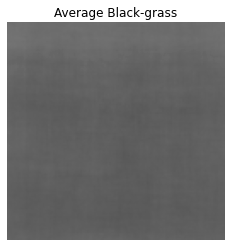

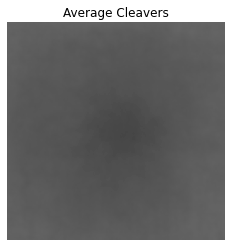

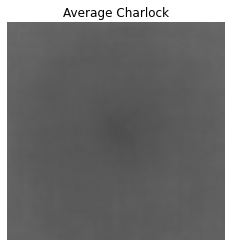

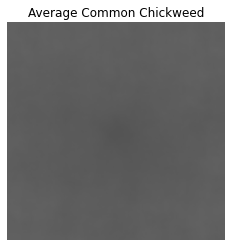

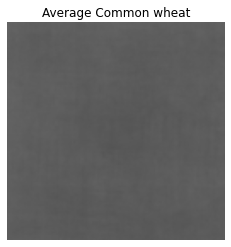

...

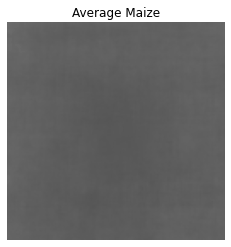

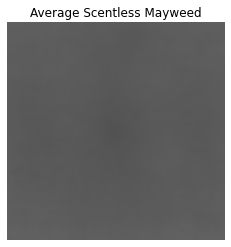

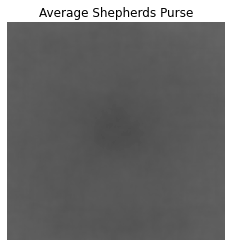

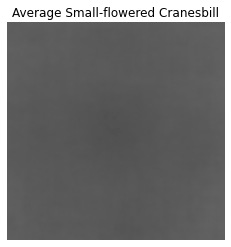

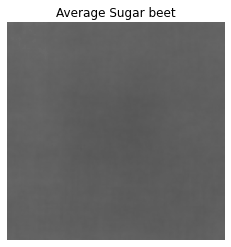

In [22]:
# Now I enter the filled dictionary into the mean img function.
Black_grass_mean = find_mean_img(np.array(d2['Black-grass']), 'Black-grass')
Cleavers_mean = find_mean_img(np.array(d2['Cleavers']), 'Cleavers')
Charlock_mean = find_mean_img(np.array(d2['Charlock']), 'Charlock')
Common_Chickweed_mean = find_mean_img(np.array(d2['Common Chickweed']), 'Common Chickweed')
Common_wheat_mean = find_mean_img(np.array(d2['Common wheat']), 'Common wheat')
Fat_Hen_mean = find_mean_img(np.array(d2['Fat Hen']), 'Fat Hen')
Loose_Silky_bent_mean = find_mean_img(np.array(d2['Loose Silky-bent']), 'Loose Silky-bent')
Maize_mean = find_mean_img(np.array(d2['Maize']), 'Maize')
Scentless_Mayweed_mean = find_mean_img(np.array(d2['Scentless Mayweed']), 'Scentless Mayweed')
Shepherds_Purse_mean = find_mean_img(np.array(d2['Shepherds Purse']), 'Shepherds Purse')
Small_flowered_Cranesbill_mean = find_mean_img(np.array(d2['Small-flowered Cranesbill']), 'Small-flowered Cranesbill')
Sugar_beet_mean = find_mean_img(np.array(d2['Sugar beet']), 'Sugar beet')

Well, that was useless. It was worth a shot though. Nothing but gray blobs.

Some of the gray blobs are slightly darker than others. Maybe that's enough of a difference? It's nothing I can make sense of, though.

If the average image isn't really a picture of a plant, then I'll just have to pull some example plants to be representative.

### Example images of each plant

Image of a Small-flowered Cranesbill, index number 0


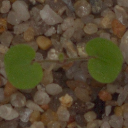

Image of a Fat Hen, index number 496


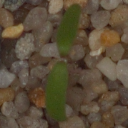

Image of a Shepherds Purse, index number 971


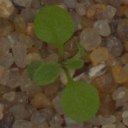

Image of a Common wheat, index number 1202


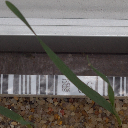

Image of a Common Chickweed, index number 1423


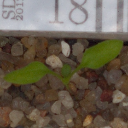

Image of a Charlock, index number 2034


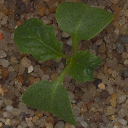

Image of a Cleavers, index number 2424


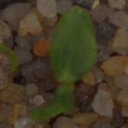

Image of a Scentless Mayweed, index number 2711


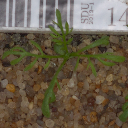

Image of a Sugar beet, index number 3227


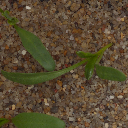

Image of a Maize, index number 3612


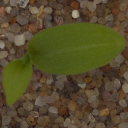

Image of a Black-grass, index number 3833


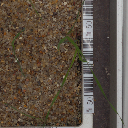

Image of a Loose Silky-bent, index number 4096


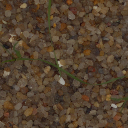

In [23]:
# Showing the image of the first example of each plant in the dataframe.
for i in plant_examples:
  plant_name = df_labels['Label'][i]
  print(f'Image of a {plant_name}, index number {i}')
  cv2_imshow(df[i])

Yep, those are baby plants. Cute.

I note that Shepherds Purse and Small-flowered Cranesbill have similar flat, round leaves, and so there may be some confusion there.

A few of the sprouts also have long, thin leaves. That may cause problems. Looking at you, Loose Silky-Bent, Common Wheat, and Black-grass.

I also note that many of the pictures have what looks like a measuring stick or something on the sides. This could be a problem depending on how it's situated.

## Eigenimages

Eigenimages use principle component analysis to create eigenvectors of our images to see what features may be most important. It's like finding the principle components of images. Let's see how it works.

In [24]:
def eigenimages(full_mat, title, n_comp = 0.7, size = (128, 128)):
  """
  This function finds a single eigenimage from a set of matrices through a PCA
  full_mat: a 2D array. Flatten any images before input.
  title: label of the images
  n_comp: how many components needed until n_comp% variance explained. Float 0-1
  size: size of images
  """
    # fit PCA to describe n_comp * variability in the class
  pca = PCA(n_components = n_comp, whiten = True)
  pca.fit(full_mat)
  print('Number of PC: ', pca.n_components_)
  return pca

In [25]:
def plot_pca(pca, size = (128, 128)):
  """
  This plots all of the eigenimages found for a specific class.
  size: size of images being analyzed
  pca: output from the eigenimages function
  """
  # plot eigenimages in a grid
  n = pca.n_components_
  fig = plt.figure(figsize=(8, 8))
  r = int(n**.5)
  c = ceil(n/ r)
  for i in range(n):
      ax = fig.add_subplot(r, c, i + 1, xticks = [], yticks = [])
      ax.imshow(pca.components_[i].reshape(size), 
                  cmap='Greys_r')
  plt.axis('off')
  plt.show()

Number of PC:  33


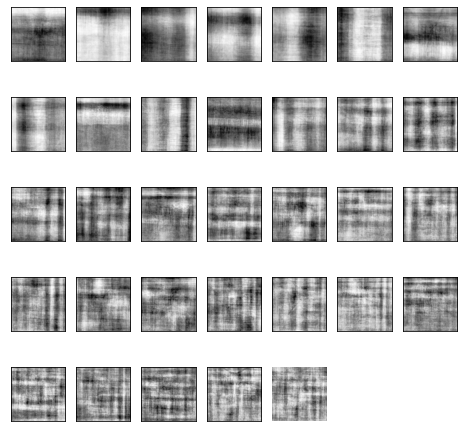

Number of PC:  52


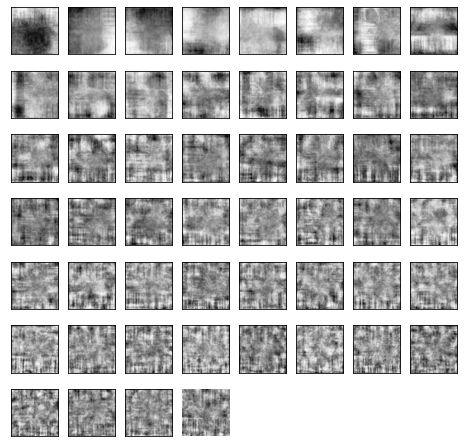

Number of PC:  50


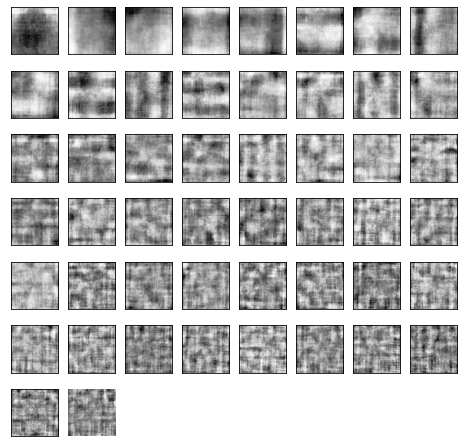

Number of PC:  54


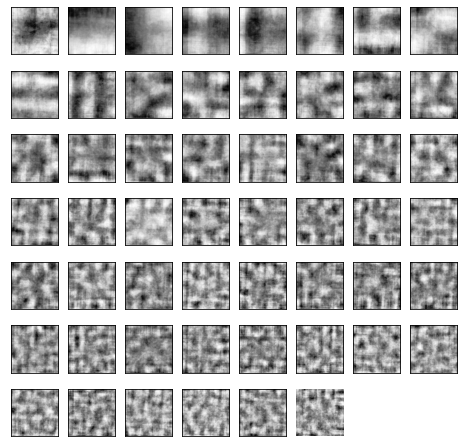

Number of PC:  38


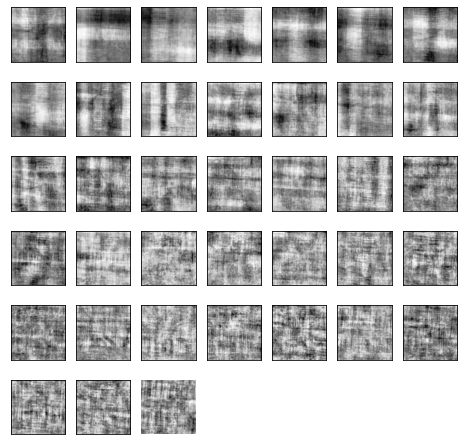

Number of PC:  55


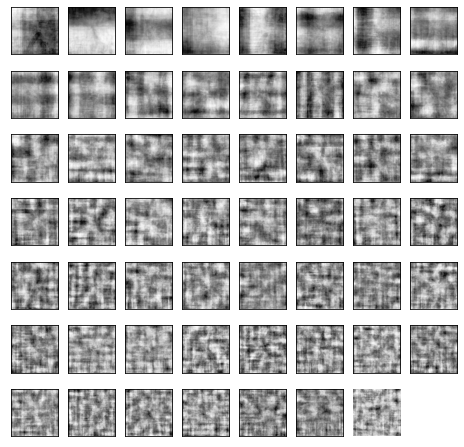

Number of PC:  46


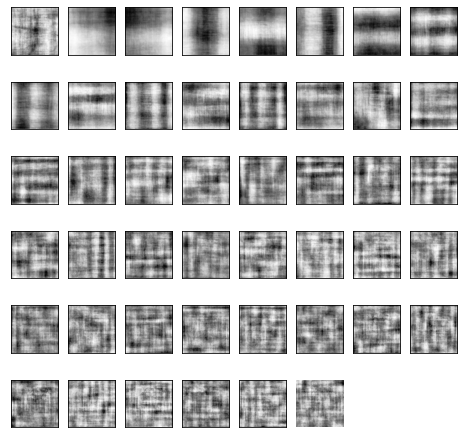

Number of PC:  36


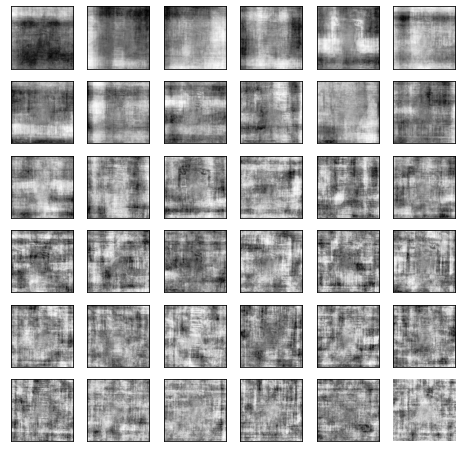

Number of PC:  44


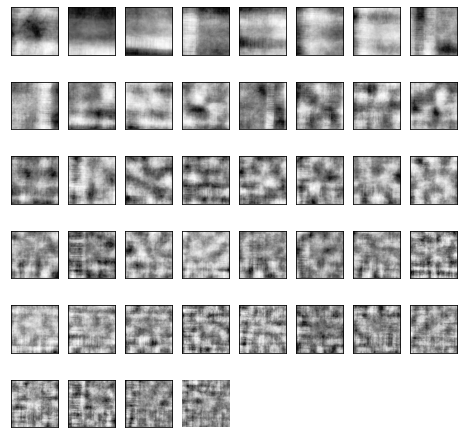

Number of PC:  40


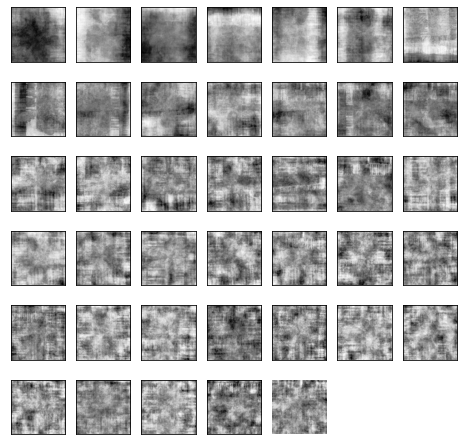

Number of PC:  68


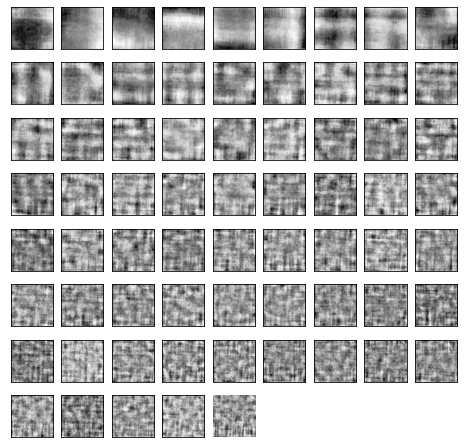

Number of PC:  81


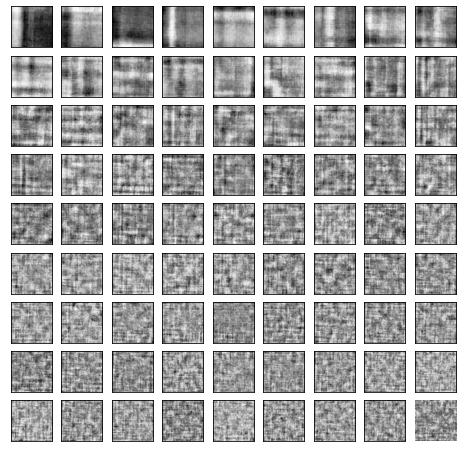

In [26]:
# Let's do all the classes at once for side-by-side comparisons.
# I can use the dictionary I made for mean images, but I have to reshape it. 128x128 = 16384.
plot_pca(eigenimages(np.array(d2['Black-grass']).reshape([-1,16384]), 'Black-grass'))
plot_pca(eigenimages(np.array(d2['Cleavers']).reshape([-1,16384]), 'Cleavers'))
plot_pca(eigenimages(np.array(d2['Charlock']).reshape([-1,16384]), 'Charlock'))
plot_pca(eigenimages(np.array(d2['Common Chickweed']).reshape([-1,16384]), 'Common Chickweed'))
plot_pca(eigenimages(np.array(d2['Common wheat']).reshape([-1,16384]), 'Common wheat'))
plot_pca(eigenimages(np.array(d2['Fat Hen']).reshape([-1,16384]), 'Fat Hen'))
plot_pca(eigenimages(np.array(d2['Loose Silky-bent']).reshape([-1,16384]), 'Loose Silky-bent'))
plot_pca(eigenimages(np.array(d2['Maize']).reshape([-1,16384]), 'Maize'))
plot_pca(eigenimages(np.array(d2['Scentless Mayweed']).reshape([-1,16384]), 'Scentless Mayweed'))
plot_pca(eigenimages(np.array(d2['Shepherds Purse']).reshape([-1,16384]), 'Shepherds Purse'))
plot_pca(eigenimages(np.array(d2['Small-flowered Cranesbill']).reshape([-1,16384]), 'Small-flowered Cranesbill'))
plot_pca(eigenimages(np.array(d2['Sugar beet']).reshape([-1,16384]), 'Sugar beet'))

The first few principle components of each plant class does actually look quite different. However, as the PCs grow in number, they look more and more like static. This makes me wonder if the model will have problems with noise, at least initially.

In [27]:
del(d2)
gc.collect()

121021

### EDA Insights - Summary

We have 12 unique labels.

Images are 128x128x3 with RGB color channels.

The dataset is imbalanced, so we'll want to explore ways to deal with that.

There are no missing values in either the labels or the images.

Based on what I'm seeing above, I think the model will have difficulty with those plants with below 300 images: neural networks are very data hungry.

Several of the plants look very similar, especially the species with long-grass-like leaves, such as those of common wheat, loose silky-bent, and black-grass.

The average images imply that this may be quite a tough problem to crack: It's really not obvious which plant is which from the average images. I'm thinking getting a very high accuracy is going to be difficult.

The eigenimages show that there is a lot of noise: some plants required 80+ PCs before reaching a mere 70% variance explained, and that's with the images already turned grayscale (which reduces noise). I'll have to explore different ways of reducing noise.

# Model Building

## Approach:

1. Train a base model on the base training data
2. Adjust model performance by modifying the data
3. Choose best modified data combinations
4. Hypertune the model based on the modified dataset

## Model Evaluation Criteria

### The Model can make wrong predictions as:
1. Predicting a picture is something it isn't

### Which case is more important?
1. All errors are equally bad. We want the plants to be correctly identified, and being misclassified as one plant is the same as any other.

### Which metric to optimize?

Our dataset is only slightly imbalanced for a few of the classes. As such, accuracy should be a good metric to optimize. Accuracy only loses its usefulness if we get to extremely high levels of accuracy, a feat unlikely with such a small dataset and so many categories.

However, there are many types of accuracy. For this, because we are using 12 classes, we want categorical accuracy. This measures whether or not the index position of argmax() is the same. That allows us to compare one-hot vectors, such as whether [0,1,0,0] is the same as [1,0,0,0]. argmax will make the first one 1 and the second one 0, meaning it would be an inaccurate prediction because the values are different.

Otherwise, F1 score is also good because it equally weights recall and precision, and in this case both are equally important.

In [28]:
METRICS = [
      tf.keras.metrics.TruePositives(name='tp'), # Total true positives
      tf.keras.metrics.FalsePositives(name='fp'),# Total false positives
      tf.keras.metrics.TrueNegatives(name='tn'), # Total true negatives
      tf.keras.metrics.FalseNegatives(name='fn'), # Total false negatives
      tf.keras.metrics.CategoricalAccuracy(name='accuracy'), #Categorical accuracy because we have multiple classes
      tf.keras.metrics.Precision(name='precision'),
      tf.keras.metrics.Recall(name='recall'),
      tfa.metrics.F1Score(name='f1_score', num_classes=12)
]

# Baseline Model

First thing's first, let's create a baseline model. I'm going to use a fairly typical CNN model with rescaling.


## Preprocessing the Data for Baseline

In [29]:
X = df/255 #We want to rescale to put all values between 0 and 1

y = OneHotEncoder().fit_transform(df_labels).toarray() #Converting string labels to one-hot vector array

In [30]:
#Splitting into train/test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)
X_train.shape, X_test.shape

((3800, 128, 128, 3), (950, 128, 128, 3))

I want to see what our lone rescaling transformation did to the images, just out of curiousity. I'll use both matplotlib and cv2.

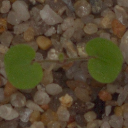

In [31]:
#Displaying the first image pre-rescale
cv2_imshow(df[0])

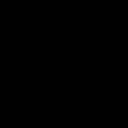

In [32]:
# Displaying the same image post-rescaling
cv2_imshow(X[0])

Now it is black. This is because in pixel language the closer to 0 the more black the image, and the closer to 255 the more white the image.

Because we rounded everything to between 0 and 1, those pixels are not going to be very bright. To the human eye, everything is black.

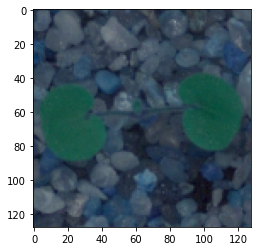

In [33]:
# Now displaying with matplotlib without rescaling
plt.imshow(df[0])

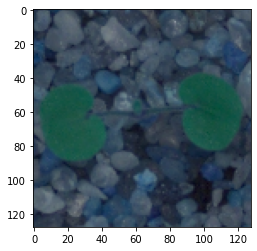

In [34]:
# Now displaying with matplotlib with rescaling
plt.imshow(X[0])

Matplotlib must have a function within it that changes the values back to being visible, as it displayed identically both times.

Interestingly, though, matplotlib made the pebbles blue. I think this is because opencv uses BGR instead of RGB.

I'm not sure which is the "true" color, but it doesn't really matter as the tensor's values are the same.

In the future I'll be using matplotlib so we don't have to scale the images before showing every time.

In [35]:
# We may need to be able to decode these encoded values. I manually made a dictionary for this.
# The integer values are the .argmax of the encoded label vectors of y.
plant_names_dict = {10:'Small-flowered Cranesbill',
               5:'Fat Hen',
               9:'Shepherds Purse',
               4:'Common wheat',
               3:'Common Chickweed',
               1:'Charlock',
               2:'Cleavers',
               8:'Scentless Mayweed',
               11:'Sugar beet',
               7:'Maize',
               0:'Black-grass',
               6:'Loose Silky-bent'}

In [36]:
# We may also want a new list of plant names in the same order as the dictionary

plant_names2 = ['Black-grass',
                'Charlock',
                'Cleavers',
                'Common Chickweed',
                'Common wheat',
                'Fat Hen',
                'Loose Silky-bent',
                'Maize',
                'Scentless Mayweed',
                'Shepherds Purse',
                'Small-flowered Cranesbill',
                'Sugar beet']

## Building the Baseline

What model should be our baseline?

A popular model type that is quite small but still effective is known as the TinyVGG architecture. It's used at the website [CNN explainer](https://poloclub.github.io/cnn-explainer/) for a similar classification problem. I think it will make for a good baseline because it is small, and shown to work decently well on a similar problem space.

It is two Conv2D layers followed by a MaxPool2D layer, which then repeats one time before being flattened and fed into a softmax layer.

In [37]:
# Set random seed
tf.random.set_seed(42)

# Create our first baseline model
model_1 = Sequential([
                      Conv2D(10,3, activation='relu', input_shape=(128, 128, 3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as out number of categories (12)
                      ])

In [38]:
# Compile the model
model_1.compile(loss='categorical_crossentropy', #For multi-class classification
                optimizer=tf.keras.optimizers.Adam(), #Let's start with Adam, it's usually pretty good.
                metrics=METRICS)

In [39]:
# Fit the model
history_1= model_1.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 17s 34ms/step - loss: 2.3994 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 29260.0000 - fn: 2660.0000 - accuracy: 0.1617 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0699 - val_loss: 2.2508 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.2132 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0752
Epoch 2/10
84/84 [==============================] - 2s 19ms/step - loss: 1.8920 - tp: 180.0000 - fp: 102.0000 - tn: 29158.0000 - fn: 2480.0000 - accuracy: 0.3523 - precision: 0.6383 - recall: 0.0677 - f1_score: 0.2720 - val_loss: 1.5892 - val_tp: 258.0000 - val_fp: 166.0000 - val_tn: 12374.0000 - val_fn: 882.0000 - val_accuracy: 0.4579 - val_precision: 0.6085 - val_recall: 0.2263 - val_f1_score: 0.3093
Epoch 3/10
84/84 [==============================] - 2s 19ms/step - loss: 1.3671 - tp: 826.0000 - fp: 348.0000 - tn: 28912.0000 - fn: 1834.0000 - accuracy: 0.5383 

In [40]:
#Now let's see how it works on the test set.
model_1.evaluate(X_test, y_test)

30/30 [==============================] - 0s 10ms/step - loss: 1.7265 - tp: 548.0000 - fp: 317.0000 - tn: 10133.0000 - fn: 402.0000 - accuracy: 0.6021 - precision: 0.6335 - recall: 0.5768 - f1_score: 0.5493


[1.7265050411224365,
 548.0,
 317.0,
 10133.0,
 402.0,
 0.6021052598953247,
 0.6335260272026062,
 0.5768421292304993,
 array([0.22222222, 0.75      , 0.5714286 , 0.78008294, 0.27777776,
        0.5915493 , 0.63013697, 0.5714286 , 0.5407725 , 0.39999998,
        0.81      , 0.44615388], dtype=float32)]

Just a note: The array at the end is the f1 score for each of the different classes. We want the average f1 score, so hen we add it to a comparison table below we'll get the mean of these values.

In [41]:
# Let's add the results to a table so we can compare it to other models later.
results = pd.DataFrame(columns=["Model Description", 'Accuracy', 'Recall','Precision','F1 Score']) # initial results dataframe
results = results.T 

In [42]:
# Now to add model_1 to our comparisons
results['Model_1'] = ['baseline',
                      history_1.history['val_accuracy'][-1],
                      history_1.history['val_recall'][-1],
                      history_1.history['val_precision'][-1],
                      history_1.history['val_f1_score'][-1].mean()]
results

,Model_1
Model Description,baseline
Accuracy,0.614035
Recall,0.598246
Precision,0.644004
F1 Score,0.558238


A 62% accuracy out of the box is pretty great, all things considered. I think we can definitely improve on that, though. Before we move on, let's visualize the performance

## Visualizing the Baseline

In [43]:
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15): 
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
  
  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """  
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])
  
  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes), 
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

  
  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
             horizontalalignment="center",
             color="white" if cm[i, j] > threshold else "black",
             size=text_size)

In [44]:
# Plot the validation and training data separately
def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """ 
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

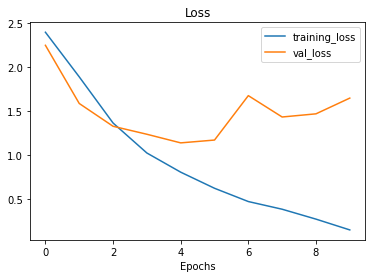

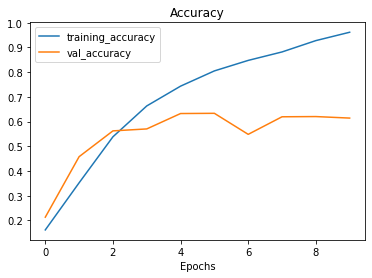

In [45]:
plot_loss_curves(history_1)

As predicted by the EDA, the model is greatly overfitting. It's learning too much noise. If we can reduce the noise, I think we can make a much better model.

Let's examine where the biggest problem areas were.

In [46]:
# Make predictions with the model
y_probs = model_1.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

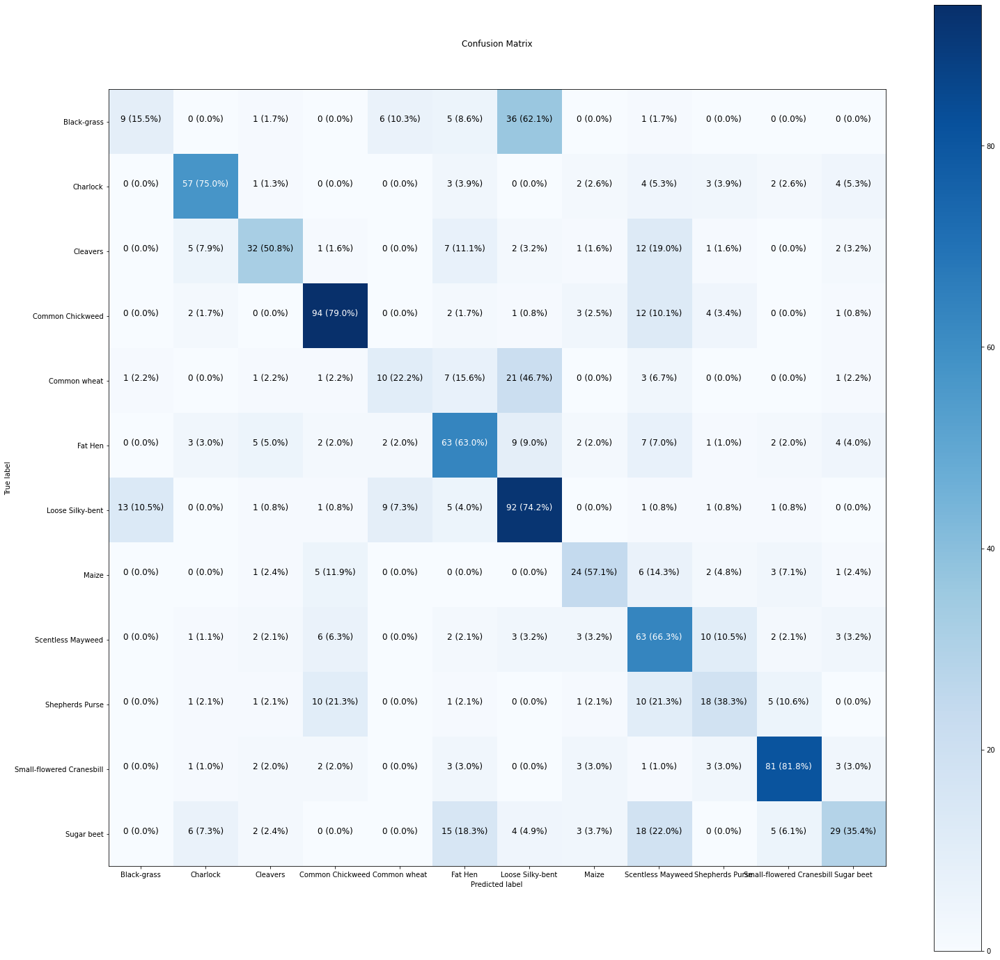

In [47]:
make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

It is as the EDA predicted, those grass-like leaves are really struggling. It's really having a hard time with black grass and loose silky-bent, and common wheat is also all over the place.

Let's look at some of the most common errors to see if we can gain any insights.

In [48]:

# Create a function for plotting a random image along with its prediction
def plot_random_image(model, images, true_labels, classes, index=None):
  """Unless an index is specified, picks a random image, plots it and 
  labels it with a predicted and truth label.

  Args:
    model: a trained model (trained on data similar to what's in images).
    images: a set of random images (in tensor form).
    true_labels: array of ground truth labels for images.
    classes: dictonary of class names for images.
    index: integer of index number of specific image you wish to see.
  
  Returns:
    A plot of a random image from `images` with a predicted class label from `model`
    as well as the truth class label from `true_labels`.
  """ 
  # Setup random integer
  if index != None:
    i = index
  else:
    i = random.randint(0, len(images))
  # i=index
  print(f'Index Number {i}')
  # Create predictions and targets
  target_image = images[i]
  pred_probs = model.predict(target_image.reshape(1, 128, 128,3)) # have to reshape to get into right size for model
  pred_label = classes.get(pred_probs.argmax())
  true_label = classes.get(true_labels[i])

  # Plot the target image
  plt.imshow(target_image, cmap=plt.cm.binary)

  # Change the color of the titles depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Add xlabel information (prediction/true label)
  plt.xlabel("Pred: {} {:2.0f}% (True: {})".format(pred_label,
                                                   100*tf.reduce_max(pred_probs),
                                                   true_label),
             color=color) # set the color to green or red

In order to check specific groups of predictions, I need to make a dataframe that lists the predictions and the true values side-by-side. The index numbers should map 1:1 with X_test.

In [49]:
# Making a comparison df to find errors
df_comparisons = pd.DataFrame(y_preds)
df_comparisons['y_preds'] = df_comparisons[0]
df_comparisons.drop(0,axis=1,inplace=True)
df_comparisons['y_true'] = y_true
df_comparisons

,y_preds,y_true
0,4,0
1,1,1
2,6,4
3,0,6
4,5,5
...,...,...
945,10,1
946,3,3
947,3,9
948,3,3


In [50]:
# Let's pull up the 32 errors between black grass and loose silky-bent
df_comparisons[(df_comparisons['y_true']==0) & (df_comparisons['y_preds']==6)]

,y_preds,y_true
19,6,0
23,6,0
27,6,0
47,6,0
146,6,0
195,6,0
208,6,0
238,6,0
353,6,0
358,6,0


Index Number 805


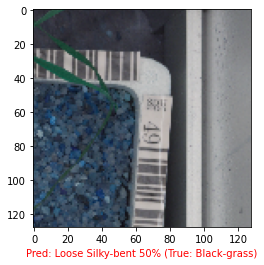

In [51]:
# Now we use our image plotter to check out these images specifically
plot_random_image(model=model_1, 
                  images=X_test, 
                  true_labels=y_true, 
                  classes=plant_names_dict,
                  index=805) #By inputting the index number, the image is no longer random.

Index Number 634


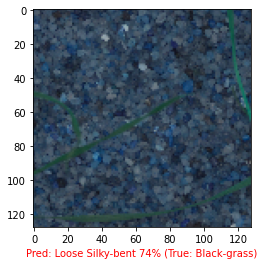

In [52]:
plot_random_image(model=model_1, 
                  images=X_test, 
                  true_labels=y_true, 
                  classes=plant_names_dict,
                  index=634)

Index Number 404


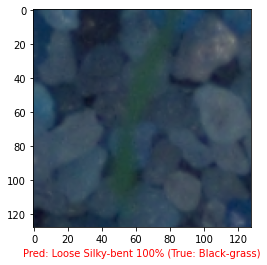

In [53]:
plot_random_image(model=model_1, 
                  images=X_test, 
                  true_labels=y_true, 
                  classes=plant_names_dict,
                  index=404)

Now I want to compare the differences between images of black-grass and images of loose-silky-bent it guessed correctly. I'm wondering if the background color is throwing it off.

In [54]:
#New set of correct images to draw from
df_comparisons[(df_comparisons['y_true']==6) & (df_comparisons['y_preds']==6)]

,y_preds,y_true
9,6,6
25,6,6
64,6,6
73,6,6
74,6,6
...,...,...
898,6,6
929,6,6
936,6,6
940,6,6


Index Number 9


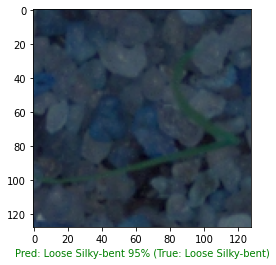

In [55]:
plot_random_image(model=model_1, 
                  images=X_test, 
                  true_labels=y_true, 
                  classes=plant_names_dict,
                  index=9)

Index Number 898


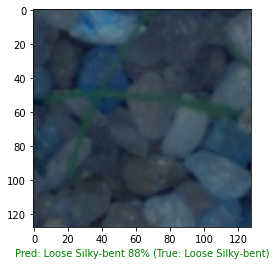

In [56]:
plot_random_image(model=model_1, 
                  images=X_test, 
                  true_labels=y_true, 
                  classes=plant_names_dict,
                  index=898)

Index Number 73


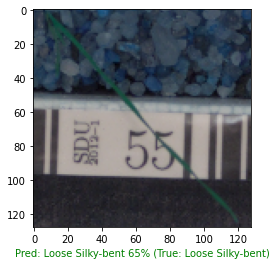

In [57]:
plot_random_image(model=model_1, 
                  images=X_test, 
                  true_labels=y_true, 
                  classes=plant_names_dict,
                  index=73)

The background color is consistently those blue pebbles, though I do note that the long, thin leaves are also fairly similar in appearance. Let's look at black grass.

In [58]:
#New set of correct black grass images to draw from
df_comparisons[(df_comparisons['y_true']==0) & (df_comparisons['y_preds']==0)]

,y_preds,y_true
236,0,0
426,0,0
488,0,0
525,0,0
627,0,0
707,0,0
725,0,0
819,0,0
928,0,0


Index Number 19


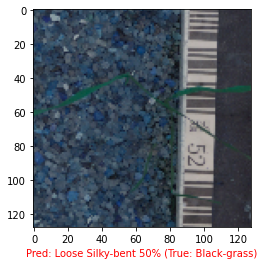

In [59]:
plot_random_image(model=model_1, 
                  images=X_test, 
                  true_labels=y_true, 
                  classes=plant_names_dict,
                  index=19)

Index Number 427


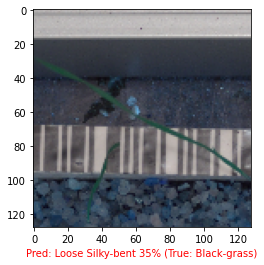

In [60]:
plot_random_image(model=model_1, 
                  images=X_test, 
                  true_labels=y_true, 
                  classes=plant_names_dict,
                  index=427)

Index Number 928


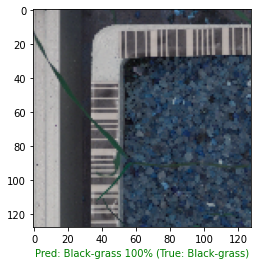

In [61]:
plot_random_image(model=model_1, 
                  images=X_test, 
                  true_labels=y_true, 
                  classes=plant_names_dict,
                  index=928)

As far as I can tell, these errors are because the backgrounds are all the same (blue pebbles) and the leaves are also long and thin.

There may be some issue with some pictures having the rulers and some not, but I found rulers in all four sets of images (correct/incorrect for each plant).

Let's improve the model.

To do this, we're first going to try changing the data through various data augmentations, then we'll finetune the model a little bit.


In [62]:
gc.collect()

34505

# Offline Data Augmentation

My theory is that if any given augmentation is beneficial alone, then they are more likely to be beneficial together. Thus, my experiments will always be baseline + a single change, at least at first. Once we identify the useful changes, I'll combine them all.



## Adding Gaussian Blurring

Our base model was pretty good, but we can do better. The extreme overfitting was likely due to noise, so I need to take some steps to reduce the noise in the data to prevent the model from learning it.

Gaussian blurring can do a lot of that by averaging the pixel values.


In [63]:
#Using Tensorflow's gaussian blur addon to blur our images
df_blurred = tfa.image.gaussian_filter2d(image=df)
# It's now a tensorflow tensor. We have to turn it into a numpy array for train test split
df_blurred = df_blurred.numpy()

In [64]:
# Double checking the type.
type(df_blurred)

numpy.ndarray

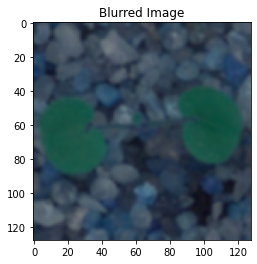

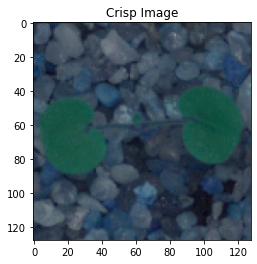

In [65]:
#Comparing a blurred vs. not blurred image.
plt.title("Blurred Image")
plt.imshow(df_blurred[0])
plt.show()
plt.title("Crisp Image")
plt.imshow(df[0])

In [66]:
# We want to rescale to put all values between 0 and 1. Keeping same name for X to reduce RAM usage
X = df_blurred/255 

# y is the same as above but may as well repeat it.
y = OneHotEncoder().fit_transform(df_labels).toarray() #Converting string labels to one-hot vector array

In [67]:
#Splitting into train/test sets. Keeping same name to prevent RAM explosion.
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)
X_train.shape, X_test.shape

((3800, 128, 128, 3), (950, 128, 128, 3))

As we can see, there is substantial blur added to the image. This should have the result of reducing noise. Let's go ahead and make the exact same type of model as model_1 except with the blurred images and see how it compares.

### Gaussian Blur Model

In [68]:
# Set random seed
tf.random.set_seed(42)

#Cloning the first model, we're not changing its structure at all
model_2 = tf.keras.models.clone_model(model_1)

#compiling in the same manner as well
model_2.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the new blurred images
history_2= model_2.fit(x=X_train, # The training data are now the blurred images.
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 31ms/step - loss: 2.4079 - tp: 548.0000 - fp: 317.0000 - tn: 39393.0000 - fn: 3062.0000 - accuracy: 0.2745 - precision: 0.6335 - recall: 0.1518 - f1_score: 0.2379 - val_loss: 2.2775 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.2088 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0627
Epoch 2/10
84/84 [==============================] - 2s 19ms/step - loss: 1.8528 - tp: 217.0000 - fp: 114.0000 - tn: 29146.0000 - fn: 2443.0000 - accuracy: 0.3635 - precision: 0.6556 - recall: 0.0816 - f1_score: 0.2722 - val_loss: 1.5640 - val_tp: 213.0000 - val_fp: 106.0000 - val_tn: 12434.0000 - val_fn: 927.0000 - val_accuracy: 0.4544 - val_precision: 0.6677 - val_recall: 0.1868 - val_f1_score: 0.3155
Epoch 3/10
84/84 [==============================] - 2s 19ms/step - loss: 1.4441 - tp: 695.0000 - fp: 294.0000 - tn: 28966.0000 - fn: 1965.0000 - accuracy: 0.5053 - precision: 

In [69]:
#Now let's see how it works on the test set.
model_2.evaluate(X_test, y_test)

30/30 [==============================] - 0s 8ms/step - loss: 1.4635 - tp: 527.0000 - fp: 292.0000 - tn: 10158.0000 - fn: 423.0000 - accuracy: 0.5958 - precision: 0.6435 - recall: 0.5547 - f1_score: 0.5582


[1.463483452796936,
 527.0,
 292.0,
 10158.0,
 423.0,
 0.5957894921302795,
 0.6434676647186279,
 0.554736852645874,
 array([0.28571427, 0.74025977, 0.62015504, 0.776     , 0.22222222,
        0.61271673, 0.513834  , 0.57575756, 0.5814978 , 0.425     ,
        0.7887324 , 0.55629134], dtype=float32)]

In [70]:
# Let's add the results to a table so we can compare it to other models later.
results['Model_2'] = ['baseline + blur',
                      history_2.history['val_accuracy'][-1],
                      history_2.history['val_recall'][-1],
                      history_2.history['val_precision'][-1],
                      history_2.history['val_f1_score'][-1].mean()]
results

,Model_1,Model_2
Model Description,baseline,baseline + blur
Accuracy,0.614035,0.622807
Recall,0.598246,0.574561
Precision,0.644004,0.6643
F1 Score,0.558238,0.570552


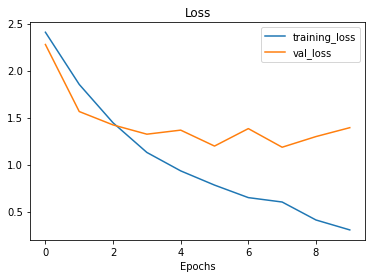

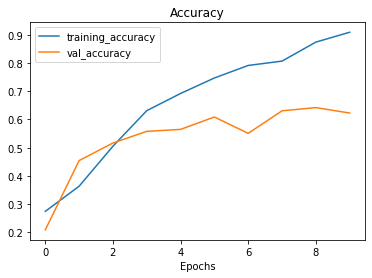

In [71]:
plot_loss_curves(history_2)

The blur didn't seem to do anything. The performance is almost identical and it is still overfitting exactly like before.

 Let's look at a confusion matrix too.

In [72]:
# Make predictions with the model
y_probs = model_2.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

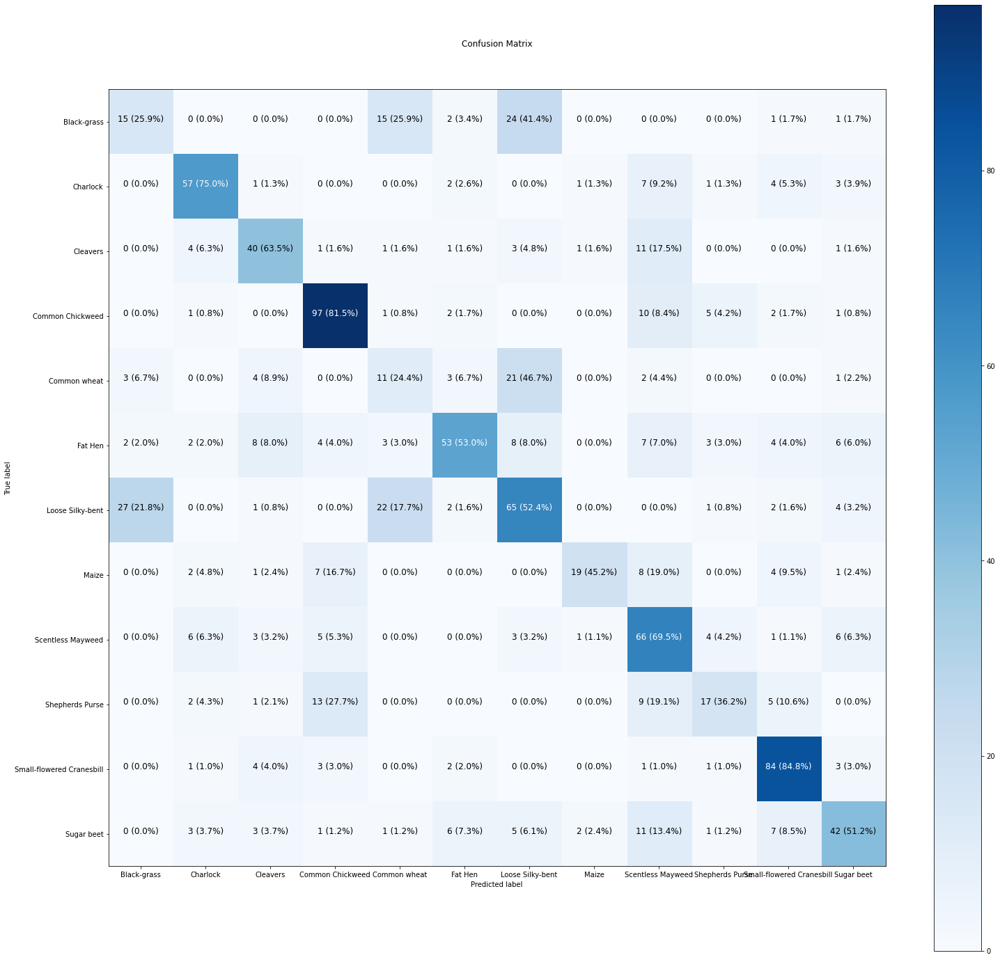

In [73]:
make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

The model is about the same as before, the blurring seemed to have no effect.

Let's try some other things.

## Color Spaces

### Grayscaling the images

Do the colors of these images really matter? All the plants are green and all the dirt is brown/blue (depending).

I'd like to try grayscaling the images first to see if we can reduce noise.

Thankfully, TensorFlow has a handy function for this.

In [74]:
# Using that handy function to grayscale our images
df_gray = tf.image.rgb_to_grayscale(df)
# It's now a tensorflow tensor. We have to turn it into a numpy array
df_gray= df_gray.numpy()

In [75]:
type(df_gray)

numpy.ndarray

In [76]:
# Checking the shape to ensure it worked
df_gray.shape

(4750, 128, 128, 1)

The 1 at the end of the shape there means that the 3 RGB channels have now become a single dimension.

Let's visualize it!

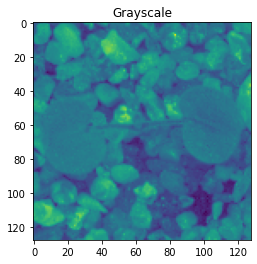

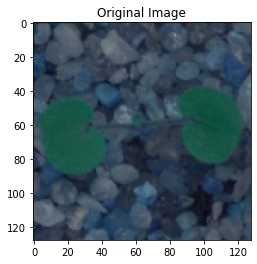

In [77]:
#Displaying the augmented image
plt.title('Grayscale')
plt.imshow(df_gray[0].reshape(128,128))
plt.show()
plt.title('Original Image')
plt.imshow(df[0])

Well Matplotlib decided to continue its trend of weird colors by making it green instead of gray. OK! It doesn't matter, the models will see it the same either way: As long as it has 1 color channel we're good.

For the record, we could make it display as gray by setting the cmap to 'Greys_r', but I didn't want to do this because I wanted to ensure it was "gray" by default. I could make the original image gray by doing that too, but it'd still have 3 color channels.

Now let's clone model 1 and see if this helps, independent of blur.

#### Grayscale Model

In [78]:
X = df_gray/255 #We want to rescale to put all values between 0 and 1

# y is the same as above but may as well repeat it.
y = OneHotEncoder().fit_transform(df_labels).toarray() #Converting string labels to one-hot vector array

In [79]:
#Splitting into train/test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)
X_train.shape, X_test.shape

((3800, 128, 128, 1), (950, 128, 128, 1))

In [80]:
# Set random seed
tf.random.set_seed(42)

# We can't clone the first model because the input shape is different. Besides this, it's the same.
model_3 = Sequential([
                      Conv2D(10,3, activation='relu', input_shape=(128, 128, 1)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as out number of categories (12)
                      ])

In [81]:
#compiling in the same manner as well
model_3.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the new blurred images
history_3= model_3.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 26ms/step - loss: 2.4086 - tp: 527.0000 - fp: 292.0000 - tn: 39418.0000 - fn: 3083.0000 - accuracy: 0.2704 - precision: 0.6435 - recall: 0.1460 - f1_score: 0.2380 - val_loss: 2.3020 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1702 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0438
Epoch 2/10
84/84 [==============================] - 1s 17ms/step - loss: 2.3242 - tp: 0.0000e+00 - fp: 2.0000 - tn: 29258.0000 - fn: 2660.0000 - accuracy: 0.1680 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0929 - val_loss: 2.3273 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1456 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0784
Epoch 3/10
84/84 [==============================] - 1s 17ms/step - loss: 2.2497 - tp: 16.0000 - fp: 14.0000 - tn: 29246.0000 - fn: 2644.0000 - accuracy: 0

In [82]:
# Let's add the results to a table so we can compare it to other models later.
results['Model_3'] = ['baseline + grayscale',
                      history_3.history['val_accuracy'][-1],
                      history_3.history['val_recall'][-1],
                      history_3.history['val_precision'][-1],
                      history_3.history['val_f1_score'][-1].mean()]
results

,Model_1,Model_2,Model_3
Model Description,baseline,baseline + blur,baseline + grayscale
Accuracy,0.614035,0.622807,0.230702
Recall,0.598246,0.574561,0.205263
Precision,0.644004,0.6643,0.250267
F1 Score,0.558238,0.570552,0.214912


In [83]:
# Checking performance on the test set
model_3.evaluate(X_test, y_test)

30/30 [==============================] - 0s 7ms/step - loss: 5.2245 - tp: 203.0000 - fp: 598.0000 - tn: 9852.0000 - fn: 747.0000 - accuracy: 0.2432 - precision: 0.2534 - recall: 0.2137 - f1_score: 0.2196


[5.224494934082031,
 203.0,
 598.0,
 9852.0,
 747.0,
 0.24315789341926575,
 0.2534331977367401,
 0.21368421614170074,
 array([0.09345795, 0.3121387 , 0.17391303, 0.19905216, 0.08602151,
        0.19387755, 0.32112676, 0.35135135, 0.3018868 , 0.0625    ,
        0.3034483 , 0.23595506], dtype=float32)]

That's so much worse! Wow! This didn't go well at all.

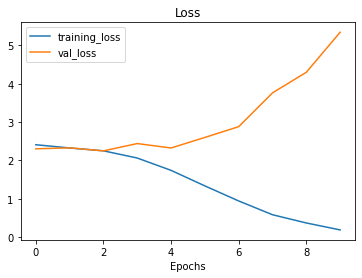

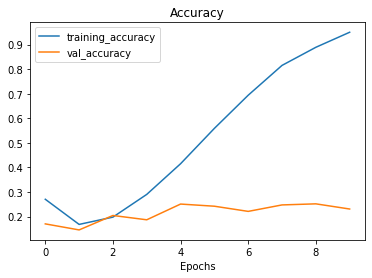

In [84]:
plot_loss_curves(history_3)

It's overfitting even more, look at that! Contrary to expectations, removing color channels made it much harder for the model to deal with noise, not easier.

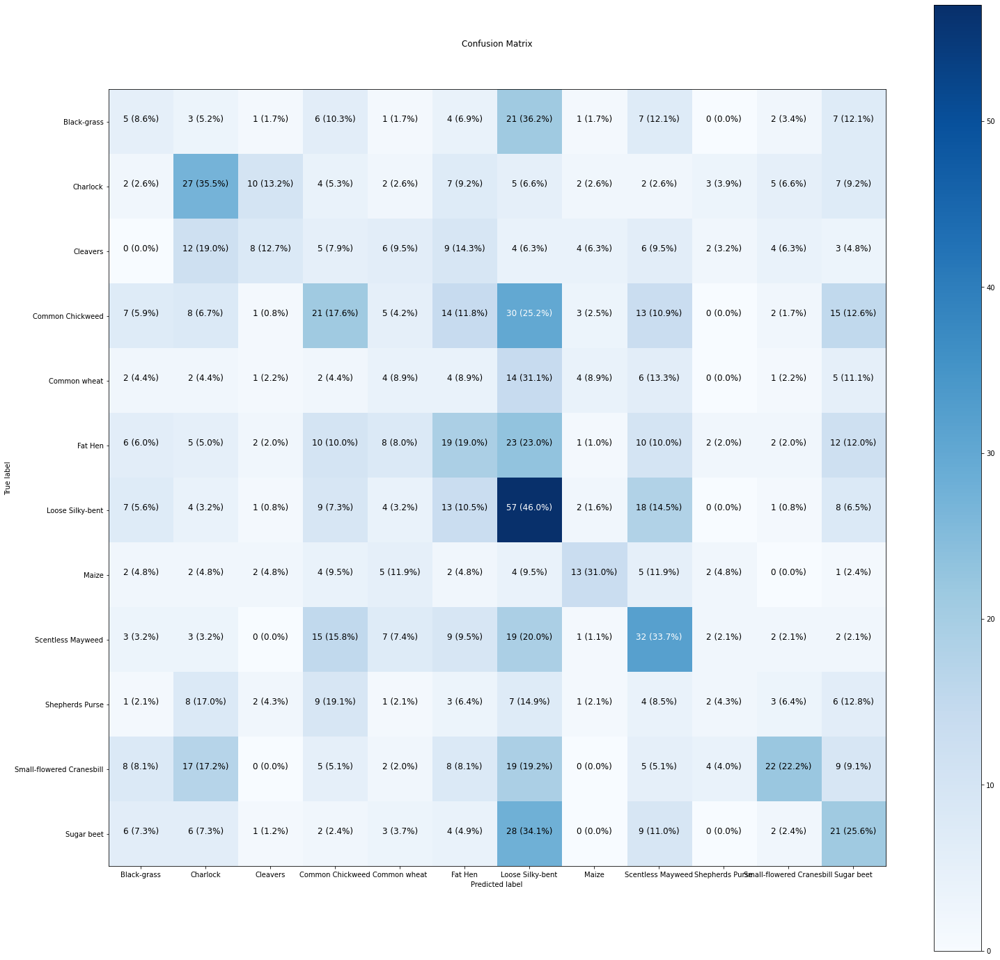

In [85]:
# Make predictions with the model
y_probs = model_3.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

Grayscaling the images was not at all helpful. The old problem areas are gone, but only because the classification is now all over the place. We'll pass on this one.

However, given that the plants are green, perhaps we should just take the channel best able to highlight what areas are green.

(Ironically, this is the red channel, because the leaves have no red in them but the pebbles have plenty of green.)

### Just Red

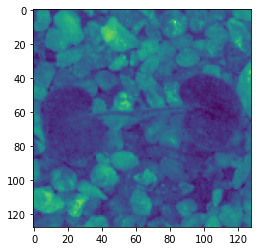

In [86]:
# Let's see which color layer best isolates the plants.
plt.imshow(df[0,...,0])

I tried all three channels and honestly it seems like the first channel works best. I think this channel is Red. It makes sense that the "red" area would be black where green is highest. There is some blue in greenish plants, but not much red, if any. This may make it pop out. Let's give this a try.

In [87]:
# Using that handy function to grayscale our images
df_red = df[:,:,:,0]

In [88]:
df_red.shape

(4750, 128, 128)

The shape is correct.

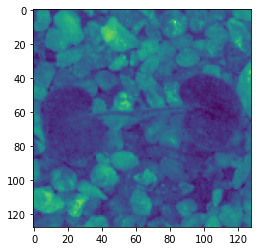

In [89]:
#Checking to ensure the remaining images are the same as a single channel of the originals.
plt.imshow(df_red[0])

Ok, it's the same. We're good to go.

#### Just Red Model

In [90]:
X = df_red/255 #We want to rescale to put all values between 0 and 1

# y is the same as above but may as well repeat it.
y = OneHotEncoder().fit_transform(df_labels).toarray() #Converting string labels to one-hot vector array

In [91]:
#Splitting into train/test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)
X_train.shape, X_test.shape

((3800, 128, 128), (950, 128, 128))

In [92]:
# Set random seed
tf.random.set_seed(42)

# We can't clone the first model because the input shape is different. Besides this, it's the same.
model_4 = Sequential([
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,1)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as out number of categories (12)
                      ])

#compiling in the same manner as well
model_4.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the images
history_4= model_4.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 26ms/step - loss: 2.4036 - tp: 203.0000 - fp: 598.0000 - tn: 39112.0000 - fn: 3407.0000 - accuracy: 0.1781 - precision: 0.2534 - recall: 0.0562 - f1_score: 0.1212 - val_loss: 2.2738 - val_tp: 1.0000 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1139.0000 - val_accuracy: 0.1675 - val_precision: 1.0000 - val_recall: 8.7719e-04 - val_f1_score: 0.0658
Epoch 2/10
84/84 [==============================] - 1s 16ms/step - loss: 2.1145 - tp: 16.0000 - fp: 32.0000 - tn: 29228.0000 - fn: 2644.0000 - accuracy: 0.2699 - precision: 0.3333 - recall: 0.0060 - f1_score: 0.1937 - val_loss: 1.9081 - val_tp: 60.0000 - val_fp: 38.0000 - val_tn: 12502.0000 - val_fn: 1080.0000 - val_accuracy: 0.3412 - val_precision: 0.6122 - val_recall: 0.0526 - val_f1_score: 0.2118
Epoch 3/10
84/84 [==============================] - 1s 17ms/step - loss: 1.6601 - tp: 368.0000 - fp: 188.0000 - tn: 29072.0000 - fn: 2292.0000 - accuracy: 0.4331 - precision: 0.6619 - re

In [93]:
# Let's add the results to a table so we can compare it to other models later.
results['Model_4'] = ['Just Red baseline',
                      history_4.history['val_accuracy'][-1],
                      history_4.history['val_recall'][-1],
                      history_4.history['val_precision'][-1],
                      history_4.history['val_f1_score'][-1].mean()]
results

,Model_1,Model_2,Model_3,Model_4
Model Description,baseline,baseline + blur,baseline + grayscale,Just Red baseline
Accuracy,0.614035,0.622807,0.230702,0.402632
Recall,0.598246,0.574561,0.205263,0.378947
Precision,0.644004,0.6643,0.250267,0.423529
F1 Score,0.558238,0.570552,0.214912,0.372141


In [94]:
# Checking performance on the test set
model_4.evaluate(X_test, y_test)

30/30 [==============================] - 0s 9ms/step - loss: 3.0033 - tp: 364.0000 - fp: 479.0000 - tn: 9971.0000 - fn: 586.0000 - accuracy: 0.4158 - precision: 0.4318 - recall: 0.3832 - f1_score: 0.3968


[3.0033187866210938,
 364.0,
 479.0,
 9971.0,
 586.0,
 0.41578948497772217,
 0.431791216135025,
 0.3831579089164734,
 array([0.23404256, 0.55118114, 0.45454544, 0.5572139 , 0.2       ,
        0.3618421 , 0.3649123 , 0.42857143, 0.53023255, 0.22448978,
        0.5031447 , 0.35114506], dtype=float32)]

It seems like just the other colors have enough important information that it is worth keeping them in despite the noise. Still, let's visualize!

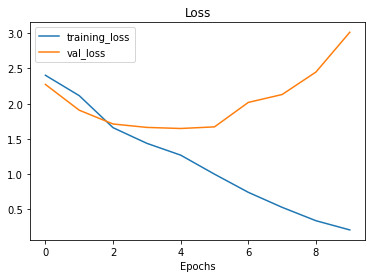

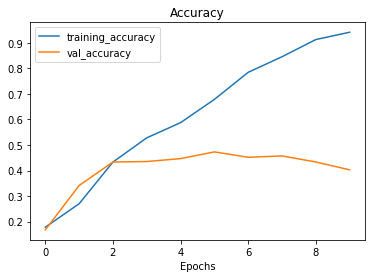

In [95]:
plot_loss_curves(history_4)

It's still overfitting like mad, and its performance did not improve on baseline.

Now we know the other colors are important. What if we kept them in, but changed it up a bit? We can actually convert the colors to other color types.

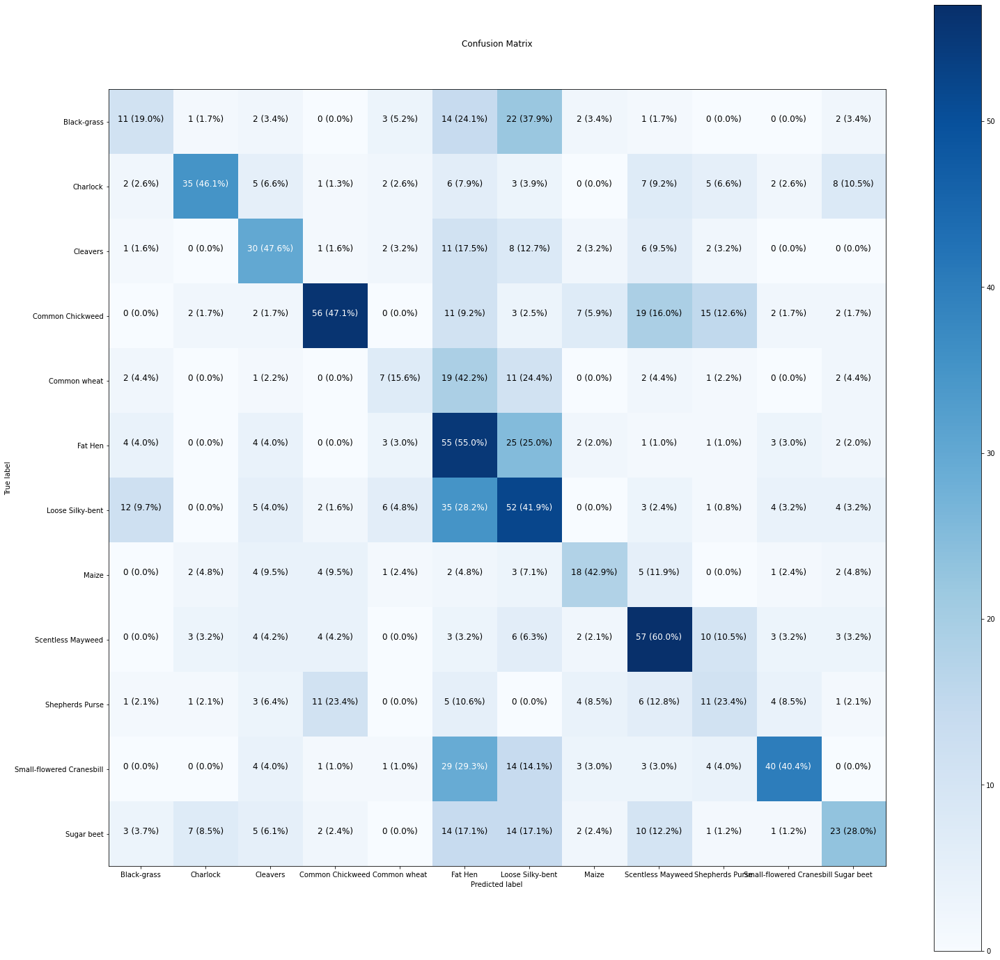

In [96]:
# Make predictions with the model
y_probs = model_4.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

The classic problem areas are still there, with the errors a bit spread over the other categories now.

### CIE XYZ color conversion

CIE XYZ is a colorspace better able to represent all of the colors the human eye can see. We can convert RGB to this colorspace to see if it helps make the plants more distinct.

In [97]:
# We have to turn our data into a tensorflow float for the function to work.
df_xyz = tf.cast(df,tf.float32)
# Now we can do the conversion from rgb to CIE XYZ
df_xyz = tfio.experimental.color.rgb_to_xyz(df_xyz)

#Convert back to unit8 so we can visualize
xyz = tf.cast(df_xyz, tf.uint8)
#turn it back into a numpy array so we can train/test split it
df_xyz = df_xyz.numpy() 

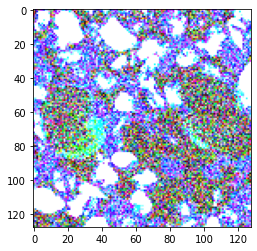

In [98]:
plt.imshow(xyz[0])

Well, that's certainly interesting isn't it? Let's give it a try!

#### CIE XYZ Model

In [99]:
X = df_xyz/255 #We want to rescale to put all values between 0 and 1

# y is the same as above but may as well repeat it.
y = OneHotEncoder().fit_transform(df_labels).toarray() #Converting string labels to one-hot vector array

#Splitting into train/test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)
X_train.shape, X_test.shape

((3800, 128, 128, 3), (950, 128, 128, 3))

In [100]:
# Set random seed
tf.random.set_seed(42)

# We can't clone the first model because the input shape is different. Besides this, it's the same.
model_5 = Sequential([
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as out number of categories (12)
                      ])

#compiling in the same manner as well
model_5.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the images
history_5= model_5.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 30ms/step - loss: 7.8609 - tp: 438.0000 - fp: 1150.0000 - tn: 38560.0000 - fn: 3172.0000 - accuracy: 0.1859 - precision: 0.2758 - recall: 0.1213 - f1_score: 0.1688 - val_loss: 2.5345 - val_tp: 3.0000 - val_fp: 17.0000 - val_tn: 12523.0000 - val_fn: 1137.0000 - val_accuracy: 0.1342 - val_precision: 0.1500 - val_recall: 0.0026 - val_f1_score: 0.0869
Epoch 2/10
84/84 [==============================] - 2s 19ms/step - loss: 2.4193 - tp: 22.0000 - fp: 14.0000 - tn: 29246.0000 - fn: 2638.0000 - accuracy: 0.1571 - precision: 0.6111 - recall: 0.0083 - f1_score: 0.1140 - val_loss: 2.5359 - val_tp: 9.0000 - val_fp: 29.0000 - val_tn: 12511.0000 - val_fn: 1131.0000 - val_accuracy: 0.1518 - val_precision: 0.2368 - val_recall: 0.0079 - val_f1_score: 0.0885
Epoch 3/10
84/84 [==============================] - 2s 19ms/step - loss: 2.2933 - tp: 107.0000 - fp: 26.0000 - tn: 29234.0000 - fn: 2553.0000 - accuracy: 0.2034 - precision: 0.8045 - recall: 0.

In [101]:
# Let's add the results to a table so we can compare it to other models later.
results['Model_5'] = ['CIE XYZ colorspace',
                      history_5.history['val_accuracy'][-1],
                      history_5.history['val_recall'][-1],
                      history_5.history['val_precision'][-1],
                      history_5.history['val_f1_score'][-1].mean()]
results

,Model_1,Model_2,Model_3,Model_4,Model_5
Model Description,baseline,baseline + blur,baseline + grayscale,Just Red baseline,CIE XYZ colorspace
Accuracy,0.614035,0.622807,0.230702,0.402632,0.164035
Recall,0.598246,0.574561,0.205263,0.378947,0.0807018
Precision,0.644004,0.6643,0.250267,0.423529,0.155668
F1 Score,0.558238,0.570552,0.214912,0.372141,0.14748


In [102]:
# Checking performance on the test set
model_5.evaluate(X_test, y_test)

30/30 [==============================] - 0s 8ms/step - loss: 6.1135 - tp: 69.0000 - fp: 428.0000 - tn: 10022.0000 - fn: 881.0000 - accuracy: 0.1453 - precision: 0.1388 - recall: 0.0726 - f1_score: 0.1195


[6.113485813140869,
 69.0,
 428.0,
 10022.0,
 881.0,
 0.1452631652355194,
 0.13883300125598907,
 0.0726315826177597,
 array([0.16216217, 0.13157895, 0.04081633, 0.19591838, 0.05970149,
        0.15384616, 0.20202018, 0.02985075, 0.18367347, 0.02197802,
        0.16101694, 0.09090909], dtype=float32)]

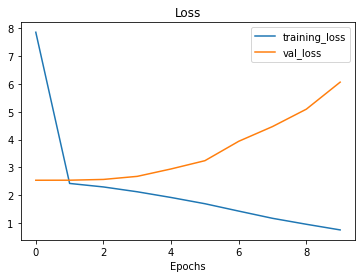

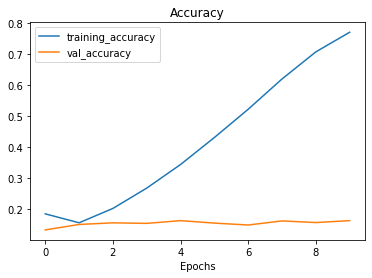

In [103]:
plot_loss_curves(history_5)

Well, that didn't work. It was worth a try though. Let's try a few other color spaces.

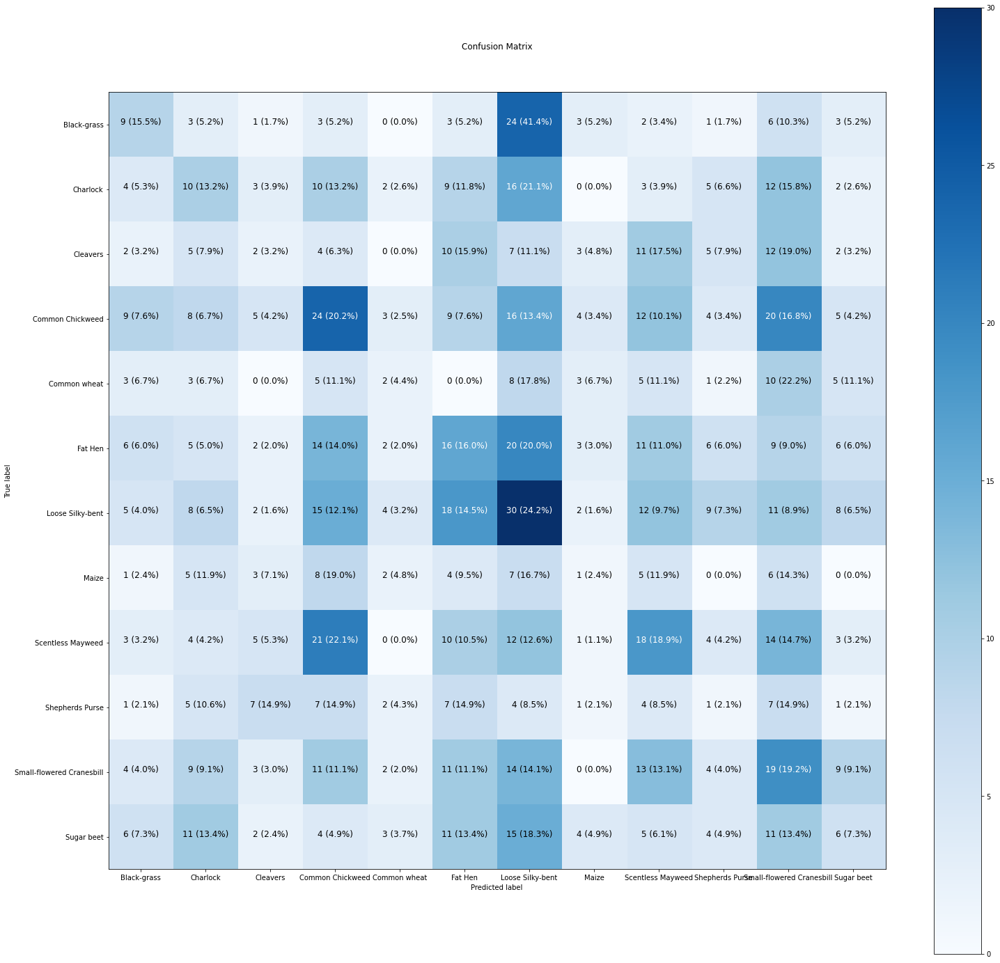

In [104]:
# Make predictions with the model
y_probs = model_5.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

Again the spread is all over the place. This caused the model to just have no idea what to do with several of the plants, such as the mayseed and small-flowered cranesbill.

### YCbCR color conversion

YCbCR is a format used to compress bandwidth in video transmission. It's been used very effectively for detecting skin, but how does it do when detecting leaves? Let's find out.

In [105]:
# Converting RGB to ycbcr
df_ycbcr = tfio.experimental.color.rgb_to_ycbcr(df)
# Change back to numpy array for train/test split
df_ycbcr = df_ycbcr.numpy()

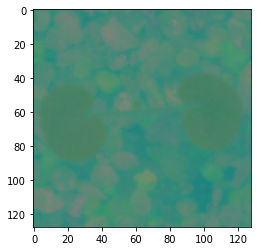

In [106]:
plt.imshow(df_ycbcr[0])

That's a mess and unlikely to be helpful. However, an interesting part of this color space is we can separate it into three different pictures, similar to RGB.

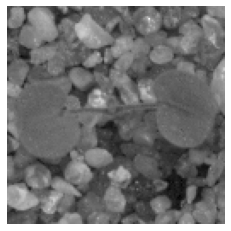

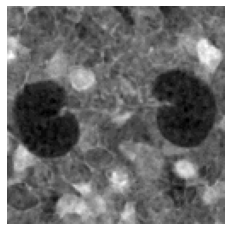

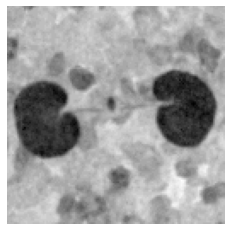

In [107]:
y, cb, cr = df_ycbcr[0,:,:,0], df_ycbcr[0,:,:,1], df_ycbcr[0,:,:,2]

plt.figure()
plt.imshow(y, cmap='gray')
plt.axis('off')
plt.show()

# Cb component
plt.figure()
plt.imshow(cb, cmap='gray')
plt.axis('off')
plt.show()

# Cr component
plt.figure()
plt.imshow(cr, cmap='gray')
plt.axis('off')
plt.show()

Look at how the last one really makes the leaves pop! I want to try it on a few other images to see if this is consistent.

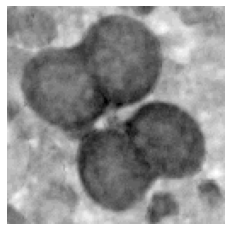

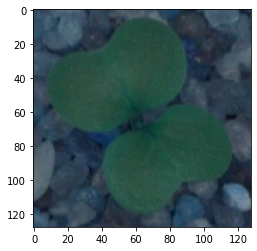

In [108]:
plt.imshow(df_ycbcr[2387,:,:,2], cmap='gray') # Change the first number to get different pictures.
plt.axis('off')
plt.show()
plt.imshow(df[2387])

Look at how that green leaf completely pops out. This has a lot of promise. Let's make a model with just this color layer in addition to having all three.

In [109]:
#Taking just the cr (red-difference chroma) layer
df_cr = df_ycbcr[:,:,:,2]

I also want to try just the last two layers, taking away the first.

In [110]:
#Getting rid of the first color channel
df_cbcr = df_ycbcr[:,:,:,1:]

In [111]:
# Is it already a numpy array?
type(df_cbcr)

numpy.ndarray

Yep, I guess I don't have to convert it.

#### Full ycbcr model

In [112]:
X = df_ycbcr/255 #We want to rescale to put all values between 0 and 1

# y is the same as above but may as well repeat it.
y = OneHotEncoder().fit_transform(df_labels).toarray() #Converting string labels to one-hot vector array

#Splitting into train/test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)
X_train.shape, X_test.shape

((3800, 128, 128, 3), (950, 128, 128, 3))

In [113]:
# Set random seed
tf.random.set_seed(42)

# We can't clone the first model because the input shape is different. Besides this, it's the same.
model_6 = Sequential([
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as out number of categories (12)
                      ])

#compiling in the same manner as well
model_6.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the images
history_6= model_6.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 31ms/step - loss: 2.4232 - tp: 69.0000 - fp: 428.0000 - tn: 39282.0000 - fn: 3541.0000 - accuracy: 0.1335 - precision: 0.1388 - recall: 0.0191 - f1_score: 0.0765 - val_loss: 2.3784 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1482 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0407
Epoch 2/10
84/84 [==============================] - 2s 19ms/step - loss: 2.3552 - tp: 3.0000 - fp: 8.0000 - tn: 29252.0000 - fn: 2657.0000 - accuracy: 0.1677 - precision: 0.2727 - recall: 0.0011 - f1_score: 0.0886 - val_loss: 2.3442 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1781 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0964
Epoch 3/10
84/84 [==============================] - 2s 19ms/step - loss: 2.2539 - tp: 14.0000 - fp: 20.0000 - tn: 29240.0000 - fn: 2646.0000 - accuracy: 0.2158 - preci

In [114]:
# Checking performance on the test set
model_6.evaluate(X_test, y_test)

30/30 [==============================] - 0s 10ms/step - loss: 4.8604 - tp: 228.0000 - fp: 562.0000 - tn: 9888.0000 - fn: 722.0000 - accuracy: 0.2642 - precision: 0.2886 - recall: 0.2400 - f1_score: 0.2399


[4.8604278564453125,
 228.0,
 562.0,
 9888.0,
 722.0,
 0.2642105221748352,
 0.2886075973510742,
 0.23999999463558197,
 array([0.16091953, 0.30952382, 0.22      , 0.30959752, 0.06666667,
        0.22966506, 0.21513945, 0.2608696 , 0.3181818 , 0.08695652,
        0.37037036, 0.33136094], dtype=float32)]

In [115]:
# Let's add the results to a table so we can compare it to other models later.
results['Model_6'] = ['Full ycbcr colorspace',
                      history_6.history['val_accuracy'][-1],
                      history_6.history['val_recall'][-1],
                      history_6.history['val_precision'][-1],
                      history_6.history['val_f1_score'][-1].mean()]
results

,Model_1,Model_2,Model_3,Model_4,Model_5,Model_6
Model Description,baseline,baseline + blur,baseline + grayscale,Just Red baseline,CIE XYZ colorspace,Full ycbcr colorspace
Accuracy,0.614035,0.622807,0.230702,0.402632,0.164035,0.25614
Recall,0.598246,0.574561,0.205263,0.378947,0.0807018,0.230702
Precision,0.644004,0.6643,0.250267,0.423529,0.155668,0.273958
F1 Score,0.558238,0.570552,0.214912,0.372141,0.14748,0.227347


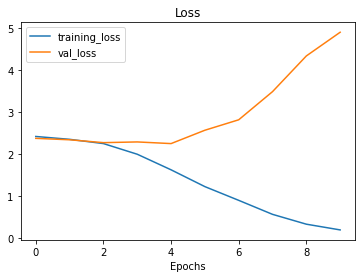

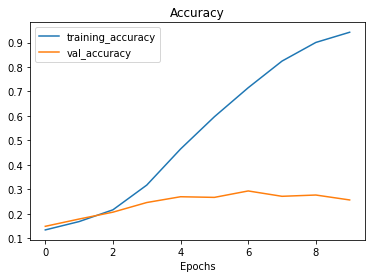

In [116]:
plot_loss_curves(history_6)

That's pretty bad! But, I expected that.

I have higher hopes for just the cr colorspace.

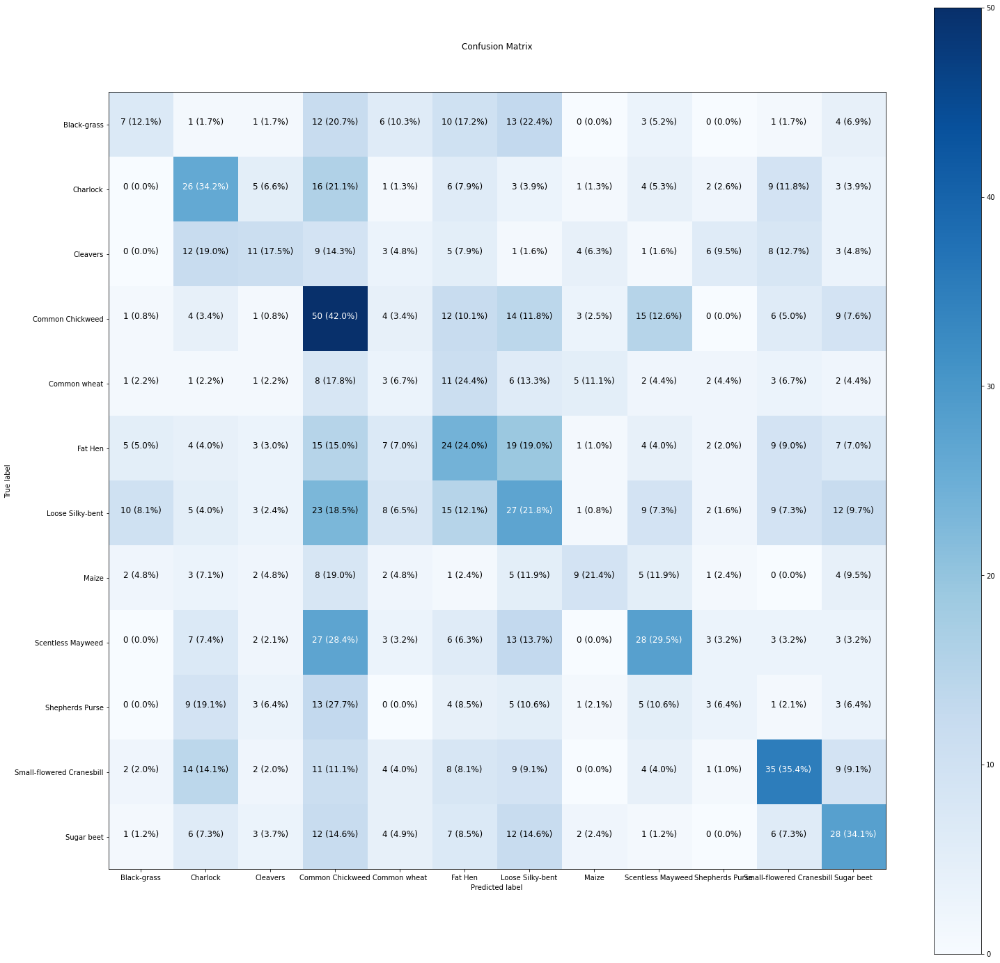

In [117]:
# Make predictions with the model
y_probs = model_6.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

This model really struggled with common wheat, cleavers, and a few other plants.

#### Just CR Colorspace Model

We already made the data, now to just run it.

In [118]:
X = df_cr/255 #We want to rescale to put all values between 0 and 1

# y is the same as above but may as well repeat it.
y = OneHotEncoder().fit_transform(df_labels).toarray() #Converting string labels to one-hot vector array

#Splitting into train/test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)
X_train.shape, X_test.shape

((3800, 128, 128), (950, 128, 128))

In [119]:
# Set random seed
tf.random.set_seed(42)

# We can't clone the first model because the input shape is different. Besides this, it's the same.
model_7 = Sequential([
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,1)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_7.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the images
history_7= model_7.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 27ms/step - loss: 2.4365 - tp: 228.0000 - fp: 562.0000 - tn: 39148.0000 - fn: 3382.0000 - accuracy: 0.1645 - precision: 0.2886 - recall: 0.0632 - f1_score: 0.1195 - val_loss: 2.4060 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1395 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0204
Epoch 2/10
84/84 [==============================] - 1s 17ms/step - loss: 2.4276 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 29260.0000 - fn: 2660.0000 - accuracy: 0.1387 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0363 - val_loss: 2.4069 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1395 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0204
Epoch 3/10
84/84 [==============================] - 1s 16ms/step - loss: 2.4278 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 29260.0000 - fn: 2660.0000 - a

In [120]:
# Checking performance on the test set
model_7.evaluate(X_test, y_test)

30/30 [==============================] - 0s 9ms/step - loss: 2.4283 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 10450.0000 - fn: 950.0000 - accuracy: 0.1305 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0192


[2.42832612991333,
 0.0,
 0.0,
 10450.0,
 950.0,
 0.1305263191461563,
 0.0,
 0.0,
 array([0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.23091249, 0.        , 0.        , 0.        ,
        0.        , 0.        ], dtype=float32)]

In [121]:
# Let's add the results to a table so we can compare it to other models later.
results['Model_7'] = ['Just cr colorspace',
                      history_7.history['val_accuracy'][-1],
                      history_7.history['val_recall'][-1],
                      history_7.history['val_precision'][-1],
                      history_7.history['val_f1_score'][-1].mean()]
results.T #It's gotten too long, so I have to flip it

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003


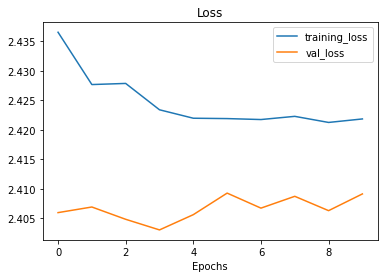

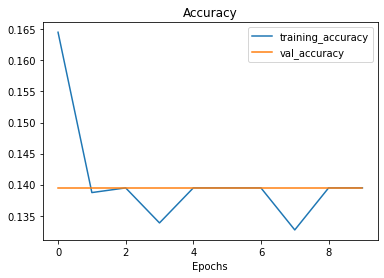

In [122]:
plot_loss_curves(history_7)

I must say, I am very surprised at this result. So much so that I feel like adding more filters or something would be helpful. Ah well, no time for that.

Now let's try just the two layers.

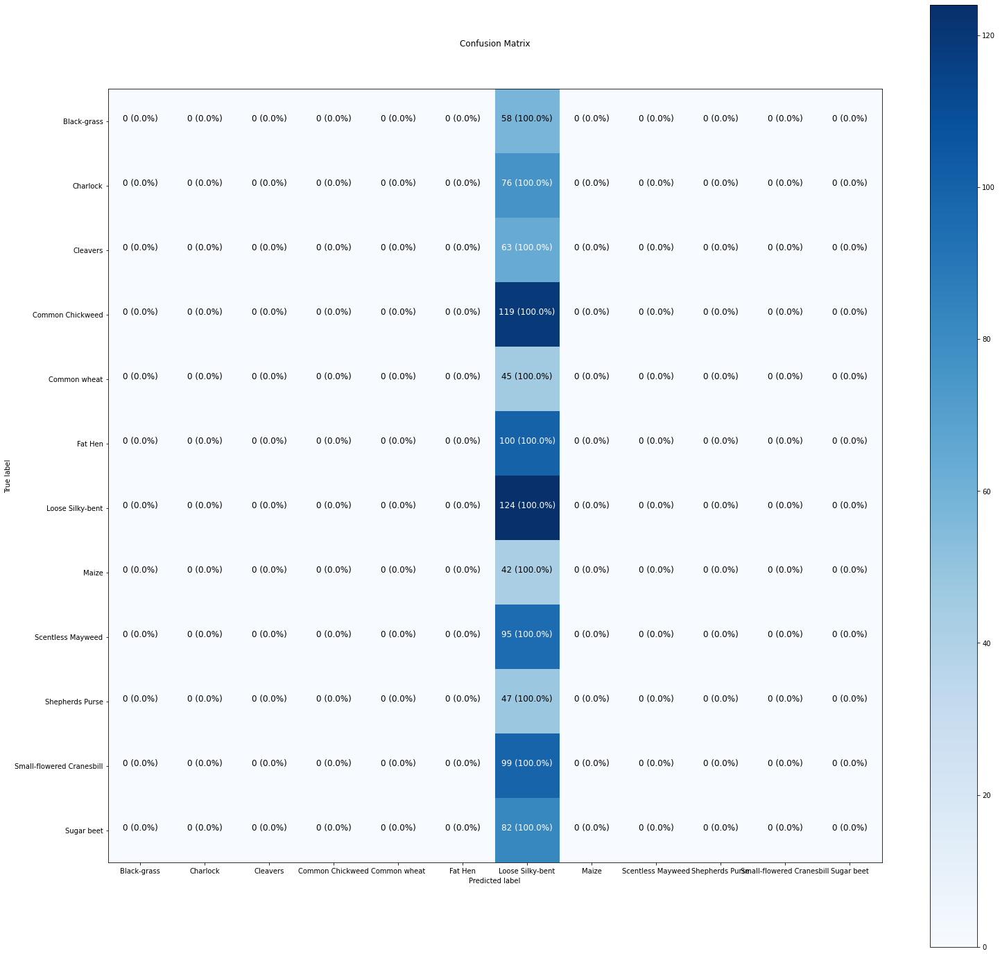

In [123]:
# Make predictions with the model
y_probs = model_7.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

That just made me laugh. Everything is a loose silky-bent!

At least it's really good at predicting loose silky-bent?

#### CB CR Colorspace Model

This is using the first two color channels of the YCbCR color space.

In [124]:
X = df_cbcr/255 #We want to rescale to put all values between 0 and 1

# y is the same as above but may as well repeat it.
y = OneHotEncoder().fit_transform(df_labels).toarray() #Converting string labels to one-hot vector array

#Splitting into train/test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)
X_train.shape, X_test.shape

((3800, 128, 128, 2), (950, 128, 128, 2))

In [125]:
# Set random seed
tf.random.set_seed(42)

# We can't clone the first model because the input shape is different. Besides this, it's the same.
model_8 = Sequential([
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,2)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_8.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the new blurred images
history_8= model_8.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 28ms/step - loss: 2.4188 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 39710.0000 - fn: 3610.0000 - accuracy: 0.1457 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0468 - val_loss: 2.3307 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.2368 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0636
Epoch 2/10
84/84 [==============================] - 1s 17ms/step - loss: 2.1877 - tp: 22.0000 - fp: 15.0000 - tn: 29245.0000 - fn: 2638.0000 - accuracy: 0.2451 - precision: 0.5946 - recall: 0.0083 - f1_score: 0.1246 - val_loss: 1.9827 - val_tp: 30.0000 - val_fp: 17.0000 - val_tn: 12523.0000 - val_fn: 1110.0000 - val_accuracy: 0.3026 - val_precision: 0.6383 - val_recall: 0.0263 - val_f1_score: 0.1973
Epoch 3/10
84/84 [==============================] - 1s 17ms/step - loss: 1.9891 - tp: 152.0000 - fp: 66.0000 - tn: 29194.0000 - fn: 2508.0000 - accuracy: 0.3169 - pre

In [126]:
# Checking performance on the test set
model_8.evaluate(X_test, y_test)

30/30 [==============================] - 0s 8ms/step - loss: 1.8146 - tp: 225.0000 - fp: 144.0000 - tn: 10306.0000 - fn: 725.0000 - accuracy: 0.4032 - precision: 0.6098 - recall: 0.2368 - f1_score: 0.3484


[1.814643144607544,
 225.0,
 144.0,
 10306.0,
 725.0,
 0.40315788984298706,
 0.6097561120986938,
 0.2368421107530594,
 array([0.17204301, 0.4742268 , 0.34146342, 0.7048458 , 0.0625    ,
        0.29885054, 0.32      , 0.25925925, 0.49056605, 0.24      ,
        0.59113306, 0.2264151 ], dtype=float32)]

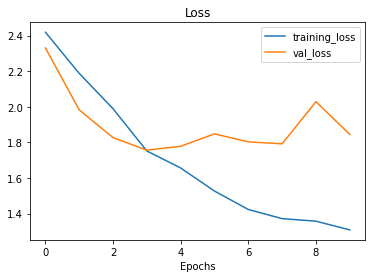

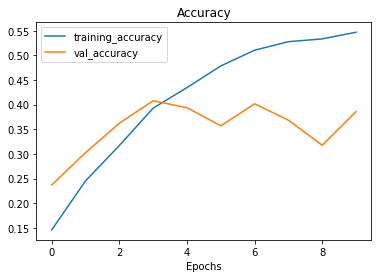

In [127]:
plot_loss_curves(history_8)

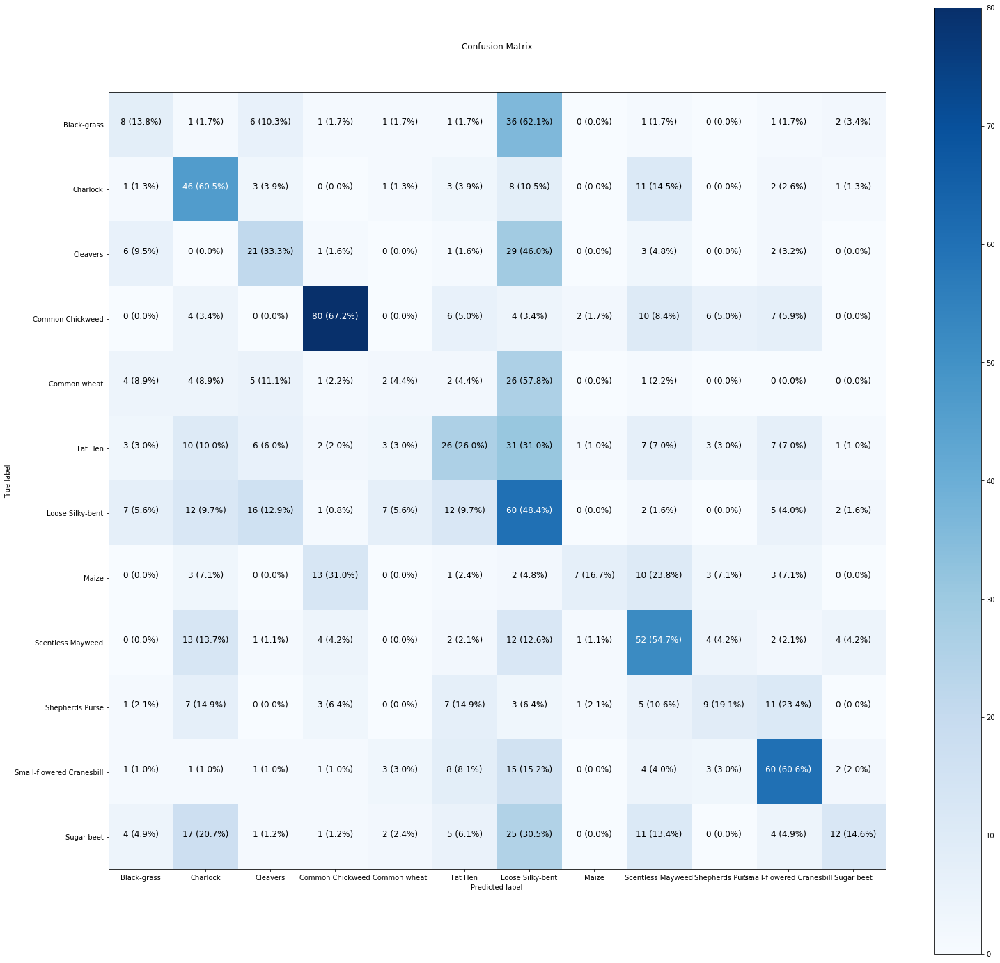

In [128]:
# Make predictions with the model
y_probs = model_8.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

This is better than we've seen in a while, but it just isn't able to handle most of the plants. It did pretty well on Charlock and common chickweed though.

In [129]:
# Let's add the results to a table so we can compare it to other models later.
results['Model_8'] = ['cbcr colorspace',
                      history_8.history['val_accuracy'][-1],
                      history_8.history['val_recall'][-1],
                      history_8.history['val_precision'][-1],
                      history_8.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894


So far, RGB has turned out to be the best colorspace for our problem. I am surprised by this, but it is what it is.

One last colorspace: Just reordering RGB.

### RGB to BGR

In [130]:
# Change RGB to BGR
df_bgr = tfio.experimental.color.rgb_to_bgr(df)
# Convert back to numpy array
df_bgr = df_bgr.numpy()

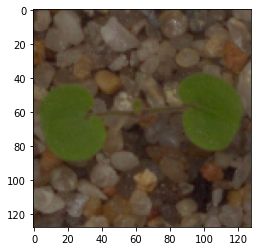

In [131]:
plt.imshow(df_bgr[0])

Oh hey! The brown is back! Well, that's fun. I guess matplotlib did change the order of the colors.

Easy peasy, let's run the model. I suspect its performance will be identical to the baseline.

#### BGR Model

In [132]:
X = df_bgr/255 #We want to rescale to put all values between 0 and 1

# y is the same as above but may as well repeat it.
y = OneHotEncoder().fit_transform(df_labels).toarray() #Converting string labels to one-hot vector array

#Splitting into train/test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)
X_train.shape, X_test.shape

((3800, 128, 128, 3), (950, 128, 128, 3))

In [133]:
# Set random seed
tf.random.set_seed(42)

# We can't clone the first model because the input shape is different. Besides this, it's the same.
model_9 = Sequential([
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_9.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the images
history_9= model_9.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 30ms/step - loss: 2.4174 - tp: 225.0000 - fp: 144.0000 - tn: 39566.0000 - fn: 3385.0000 - accuracy: 0.2072 - precision: 0.6098 - recall: 0.0623 - f1_score: 0.1526 - val_loss: 2.4307 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1658 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0494
Epoch 2/10
84/84 [==============================] - 2s 19ms/step - loss: 2.2678 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 29260.0000 - fn: 2660.0000 - accuracy: 0.2229 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.1411 - val_loss: 2.1553 - val_tp: 1.0000 - val_fp: 4.0000 - val_tn: 12536.0000 - val_fn: 1139.0000 - val_accuracy: 0.2947 - val_precision: 0.2000 - val_recall: 8.7719e-04 - val_f1_score: 0.1788
Epoch 3/10
84/84 [==============================] - 2s 19ms/step - loss: 1.8986 - tp: 175.0000 - fp: 93.0000 - tn: 29167.0000 - fn: 2485.0000 - accuracy: 0.3605 -

In [134]:
# Checking performance on the test set
model_9.evaluate(X_test, y_test)

30/30 [==============================] - 0s 10ms/step - loss: 1.4906 - tp: 531.0000 - fp: 299.0000 - tn: 10151.0000 - fn: 419.0000 - accuracy: 0.6084 - precision: 0.6398 - recall: 0.5589 - f1_score: 0.5721


[1.490636944770813,
 531.0,
 299.0,
 10151.0,
 419.0,
 0.6084210276603699,
 0.6397590637207031,
 0.5589473843574524,
 array([0.25225225, 0.82191783, 0.5833334 , 0.7111111 , 0.41121495,
        0.56983244, 0.62857145, 0.49411765, 0.5836576 , 0.41269842,
        0.77130044, 0.6257669 ], dtype=float32)]

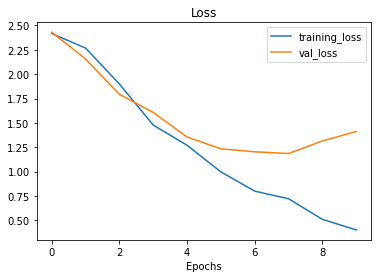

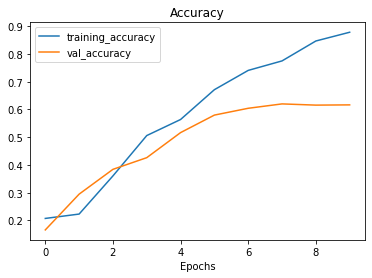

In [135]:
plot_loss_curves(history_9)

In [136]:
# Let's add the results to a table so we can compare it to other models later.
results['Model_9'] = ['BGR',
                      history_9.history['val_accuracy'][-1],
                      history_9.history['val_recall'][-1],
                      history_9.history['val_precision'][-1],
                      history_9.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221


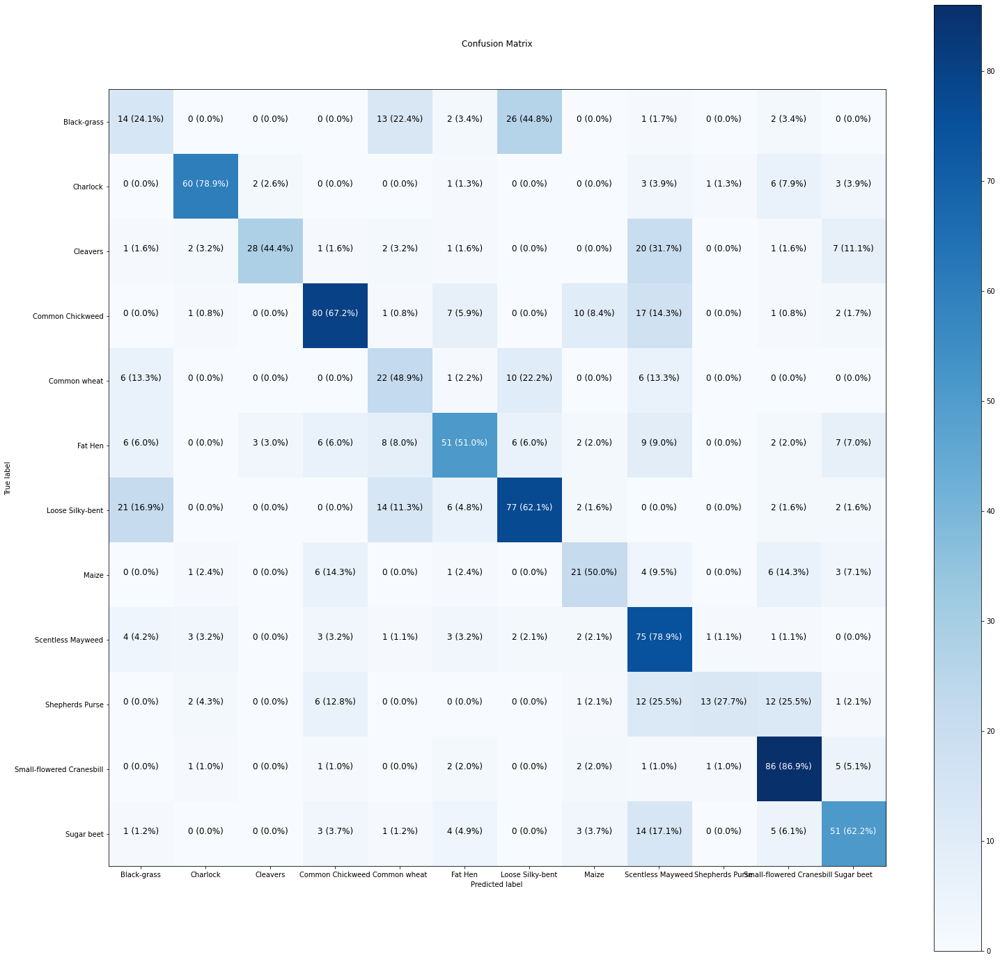

In [137]:
# Make predictions with the model
y_probs = model_9.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

It actually did slightly worse than the original model, though it's in the same ballpark. I see no reason to adopt it.

With that, I'm done playing around with colorspaces. Time to try other data augmentation. I've got a few more tricks up my sleeve to see if we can improve the model.

## Garbage Collection

My RAM is almost full to bursting, so I need to delete some of the variables I made. I'm going to wipe all of the histories that we're no longer going to use.


In [138]:
# Deleting the histories
del(history_1)
del(history_2)
del(history_3)
del(history_4)
del(history_5)
del(history_6)
del(history_7)
del(history_8)
del(history_9)

#Deleting the models
del(model_1)
del(model_2)
del(model_3)
del(model_4)
del(model_5)
del(model_6)
del(model_7)
del(model_8)
del(model_9)

#Also deleting the image dictionaries while we're here
# del(d2)
del(xyz)
del(df_cbcr)
del(df_cr)
del(df_gray)
del(df_red)
del(df_xyz)
del(df_ycbcr)
del(df_blurred)
del(df_bgr)

gc.collect()

57137

In [139]:
# I don't actually know if this will work, but I have to try something to help the RAM
tf.keras.backend.clear_session()

# Online Data Augmentation

Up until this point I've been altering the data and then running the models, but TensorFlow actually has preprocessing layers available to it. So, from now on I'll try using those. That way we don't end up with a bunch of huge augmented datasets again. Besides these layers, I'm going to stick with the TinyVGG architecture for now. I want to augment the data first, then tweak the model.

In actuality, it'd be preferrable to continue to do offline augmentation to increase the size of my dataset, since the dataset is pretty small per class. However, I can't do this because Colab's RAM is exploding. So, online we go.

There are so many data augmentation methods that I don't really have time to try them all. Instead, I'm going to heed the advice of my elders!

This dataset is from a Kaggle competition dataset. In the discussion forum of this competition, some people talked about what data augmentation worked for them.

In that discussion, someone said that they were able to get very high performance using zoom up to 1.5x and random image rotation 360 degrees. I'm going to try those first.

In [140]:
X = df #Because augmentation, including scaling, is now occuring within the model, I'm not dividing by 255.

# y is the same as above but may as well repeat it.
y = OneHotEncoder().fit_transform(df_labels).toarray() #Converting string labels to one-hot vector array

#Splitting into train/test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)
X_train.shape, X_test.shape

((3800, 128, 128, 3), (950, 128, 128, 3))

## Random Zoom

In [141]:
# Set random seed
tf.random.set_seed(42)

# Still using TinyVGG, but this time with augmentation layers!
model_10 = Sequential([
                      tf.keras.layers.Resizing(128,128), #Resize to 128, unnecessary because all of our images are this size
                      tf.keras.layers.Rescaling(1./255), #Scaling all values to be between 0 and 1
                      tf.keras.layers.RandomZoom(0,.5), # Randomly zooming between +0% and +50%
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_10.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the images
history_10= model_10.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 29ms/step - loss: 2.3852 - tp: 532.0000 - fp: 299.0000 - tn: 39411.0000 - fn: 3078.0000 - accuracy: 0.2864 - precision: 0.6402 - recall: 0.1474 - f1_score: 0.2473 - val_loss: 2.2448 - val_tp: 0.0000e+00 - val_fp: 1.0000 - val_tn: 12539.0000 - val_fn: 1140.0000 - val_accuracy: 0.2254 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0914
Epoch 2/10
84/84 [==============================] - 2s 20ms/step - loss: 1.8504 - tp: 226.0000 - fp: 138.0000 - tn: 29122.0000 - fn: 2434.0000 - accuracy: 0.3650 - precision: 0.6209 - recall: 0.0850 - f1_score: 0.2718 - val_loss: 1.6578 - val_tp: 131.0000 - val_fp: 60.0000 - val_tn: 12480.0000 - val_fn: 1009.0000 - val_accuracy: 0.4342 - val_precision: 0.6859 - val_recall: 0.1149 - val_f1_score: 0.3530
Epoch 3/10
84/84 [==============================] - 2s 20ms/step - loss: 1.5926 - tp: 452.0000 - fp: 212.0000 - tn: 29048.0000 - fn: 2208.0000 - accuracy: 0.4620 - precision: 0.68

In [142]:
# Checking performance on the test set
model_10.evaluate(X_test, y_test)

30/30 [==============================] - 0s 9ms/step - loss: 1.0810 - tp: 508.0000 - fp: 183.0000 - tn: 10267.0000 - fn: 442.0000 - accuracy: 0.6453 - precision: 0.7352 - recall: 0.5347 - f1_score: 0.5969


[1.0809766054153442,
 508.0,
 183.0,
 10267.0,
 442.0,
 0.645263135433197,
 0.7351664304733276,
 0.5347368717193604,
 array([0.2117647 , 0.7972973 , 0.75000006, 0.79856116, 0.31428573,
        0.6705202 , 0.618421  , 0.62650603, 0.6139535 , 0.43835616,
        0.751269  , 0.5714286 ], dtype=float32)]

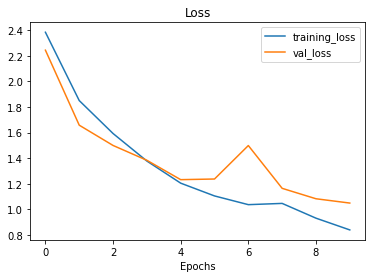

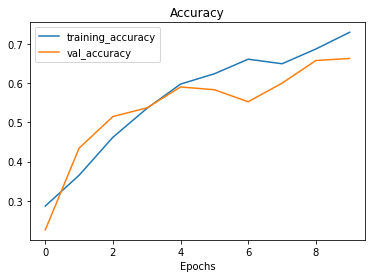

In [143]:
plot_loss_curves(history_10)

In [144]:
# Let's add the results to a table so we can compare it to other models later.
results['Model_10'] = ['Random Zoom',
                      history_10.history['val_accuracy'][-1],
                      history_10.history['val_recall'][-1],
                      history_10.history['val_precision'][-1],
                      history_10.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


Bam! Now that's what I'm talking about. That's a solid increase to accuracy and F1 score. 

It also seems like we could get even better performance by increasing our epochs. We may do that later for our final set of models.

Let's check out the confusion matrix.

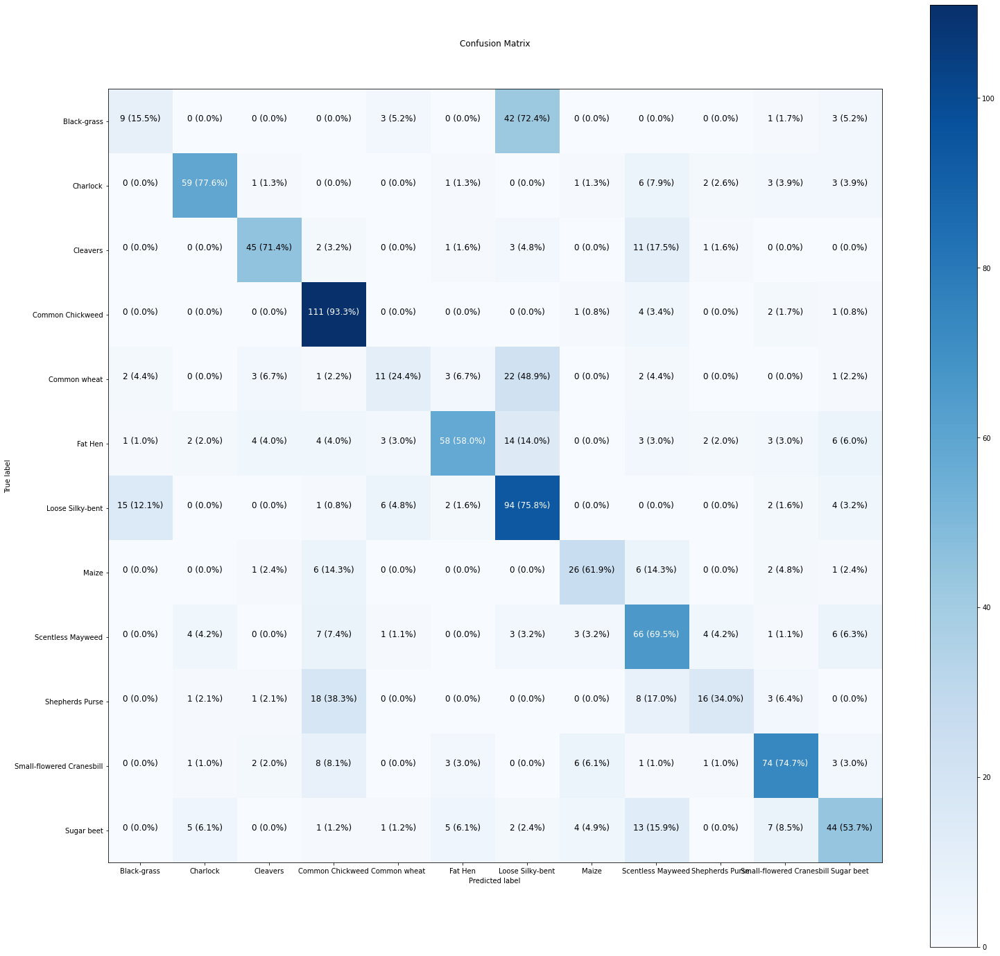

In [145]:
# Make predictions with the model
y_probs = model_10.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

The mode is still really struggling with black-grass, it keeps confusing it for loose-silky bent and vice-versa.

Common wheat is also struggling, as it is often mistaken for loose silky-bent.

Even so, good improvement! Let's see if the rotation helps too.

## Random Rotation

In [146]:
# Set random seed
tf.random.set_seed(42)

# Still using TinyVGG, but this time with augmentation layers!
model_11 = Sequential([
                      tf.keras.layers.Resizing(128,128), #Resize to 128, unnecessary because all of our images are this size
                      tf.keras.layers.Rescaling(1./255), #Scaling all values to be between 0 and 1
                      tf.keras.layers.RandomRotation(factor=(-1,1)), # Randomly rotating between 0 and 360 degrees either direction
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_11.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the images
history_11= model_11.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 29ms/step - loss: 2.3971 - tp: 508.0000 - fp: 183.0000 - tn: 39527.0000 - fn: 3102.0000 - accuracy: 0.2884 - precision: 0.7352 - recall: 0.1407 - f1_score: 0.2519 - val_loss: 2.2722 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1851 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0632
Epoch 2/10
84/84 [==============================] - 2s 20ms/step - loss: 1.8951 - tp: 186.0000 - fp: 103.0000 - tn: 29157.0000 - fn: 2474.0000 - accuracy: 0.3500 - precision: 0.6436 - recall: 0.0699 - f1_score: 0.2429 - val_loss: 1.5929 - val_tp: 182.0000 - val_fp: 90.0000 - val_tn: 12450.0000 - val_fn: 958.0000 - val_accuracy: 0.4535 - val_precision: 0.6691 - val_recall: 0.1596 - val_f1_score: 0.2967
Epoch 3/10
84/84 [==============================] - 2s 21ms/step - loss: 1.5448 - tp: 529.0000 - fp: 278.0000 - tn: 28982.0000 - fn: 2131.0000 - accuracy: 0.4692 - precision: 0

In [147]:
# Checking performance on the test set
model_11.evaluate(X_test, y_test)

30/30 [==============================] - 0s 11ms/step - loss: 0.8930 - tp: 565.0000 - fp: 126.0000 - tn: 10324.0000 - fn: 385.0000 - accuracy: 0.7168 - precision: 0.8177 - recall: 0.5947 - f1_score: 0.6881


[0.892972469329834,
 565.0,
 126.0,
 10324.0,
 385.0,
 0.7168421149253845,
 0.8176555633544922,
 0.5947368144989014,
 array([0.3928571 , 0.8228572 , 0.7333333 , 0.9106383 , 0.5591398 ,
        0.71818185, 0.7       , 0.73417723, 0.6421053 , 0.58666664,
        0.8144797 , 0.64285713], dtype=float32)]

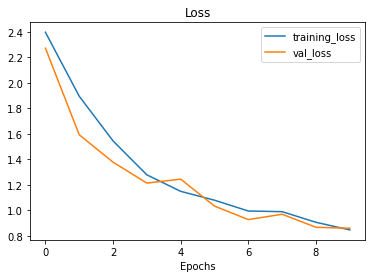

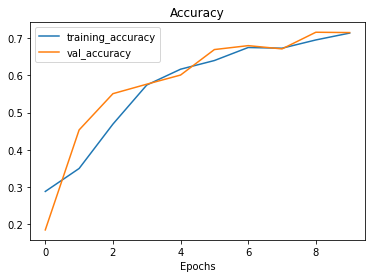

In [148]:
plot_loss_curves(history_11)

In [149]:
# Let's add the results to a table so we can compare it to other models later.
results['Model_11'] = ['Random Rotate',
                      history_11.history['val_accuracy'][-1],
                      history_11.history['val_recall'][-1],
                      history_11.history['val_precision'][-1],
                      history_11.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


A bit deceptive, the table I am making there is using validation data. On the test set (see the model.evaluate above) Random Rotate alone actually beat out Random Zoom alone! Both saw excellent improvement overall.

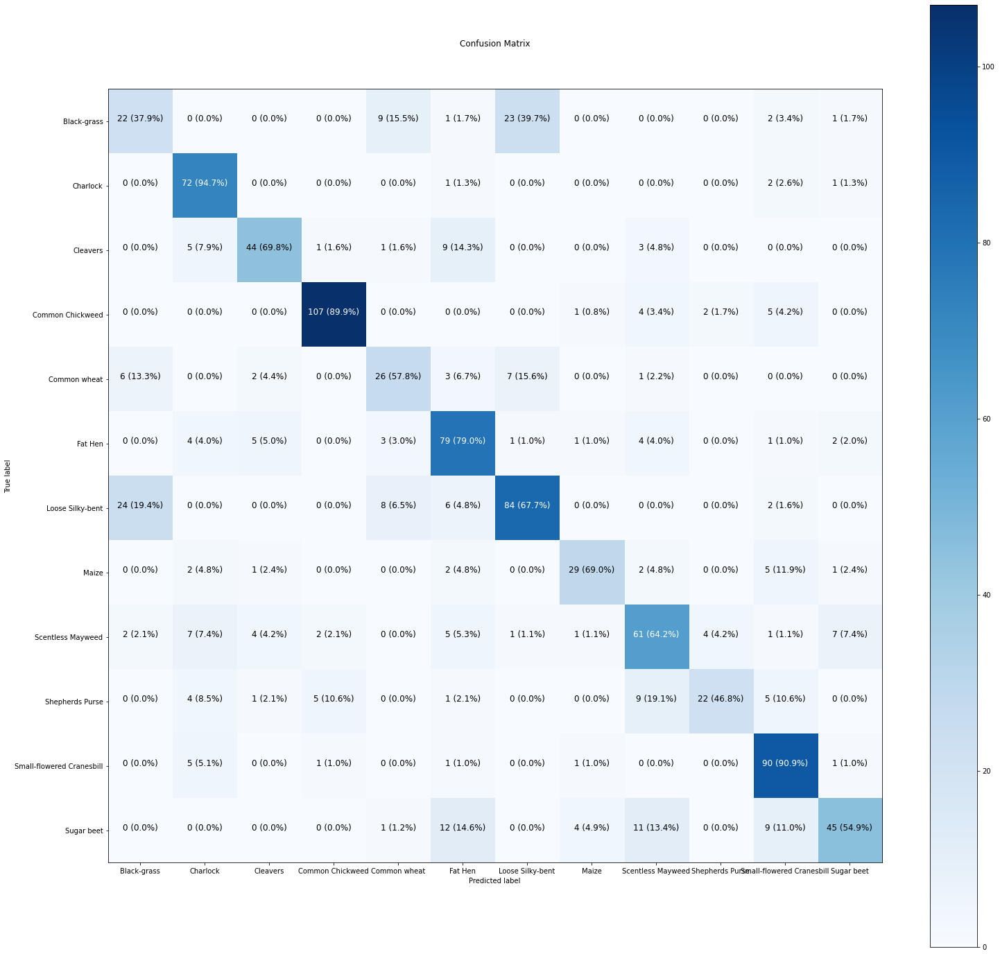

In [150]:
# Make predictions with the model
y_probs = model_11.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

Oh hey! Black Grass wasn't mistaken for Loose Silky Bent this time! Unfortunately, vice-versa was still a problem.

## SMOTE Balancing

SMOTE is a method of balancing datasets. Currently our dataset is imbalanced, so I want to try expanding the smaller categories to be of equal size to the smaller by making artificial data.

(If you're wondering why this is in online data augmentation when it is clearly offline, it is because when I had it in the other section it routinely annihilated my RAM for some reason.)

In [151]:
# Loading SMOTE to upsample
smt = SMOTE()
#Flattening the data to make it smote-able
# X_flat = tf.reshape(X_train,[-1,49152]) 
# X_flat.shape
X_smote, y_smote = smt.fit_resample(tf.reshape(X_train,[-1,49152]), y_train) # We only expand the training data
#Reshaping to the proper form for the models.
X_smote = tf.reshape(X_smote, [-1,128,128,3])

In [152]:
# Let's see how many samples we have now.
y_smote.shape

(6360, 12)

In [153]:
# and now X data.
X_smote.shape

TensorShape([6360, 128, 128, 3])

6360 pictures now. Nice. Well, let's feed them into a model.

In [154]:
# Set random seed
tf.random.set_seed(42)

# Still using TinyVGG, but this time with augmentation layers!
model_12 = Sequential([
                      tf.keras.layers.Resizing(128,128), #Resize to 128
                      tf.keras.layers.Rescaling(1./255), #Scaling all values to be between 0 and 1
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_12.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the new blurred images
history_12= model_12.fit(x=X_smote,
            y=y_smote,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
140/140 [==============================] - 5s 25ms/step - loss: 2.2497 - tp: 686.0000 - fp: 225.0000 - tn: 59197.0000 - fn: 4716.0000 - accuracy: 0.2904 - precision: 0.7530 - recall: 0.1270 - f1_score: 0.2539 - val_loss: 5.3172 - val_tp: 0.0000e+00 - val_fp: 244.0000 - val_tn: 20744.0000 - val_fn: 1908.0000 - val_accuracy: 0.0220 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0329
Epoch 2/10
140/140 [==============================] - 3s 19ms/step - loss: 1.5953 - tp: 870.0000 - fp: 364.0000 - tn: 48608.0000 - fn: 3582.0000 - accuracy: 0.4468 - precision: 0.7050 - recall: 0.1954 - f1_score: 0.3594 - val_loss: 8.3419 - val_tp: 110.0000 - val_fp: 1465.0000 - val_tn: 19523.0000 - val_fn: 1798.0000 - val_accuracy: 0.0901 - val_precision: 0.0698 - val_recall: 0.0577 - val_f1_score: 0.0924
Epoch 3/10
140/140 [==============================] - 3s 19ms/step - loss: 1.1097 - tp: 2047.0000 - fp: 673.0000 - tn: 48299.0000 - fn: 2405.0000 - accuracy: 0.6267 - prec

In [155]:
# Checking performance on the test set
model_12.evaluate(X_test, y_test)

30/30 [==============================] - 1s 11ms/step - loss: 1.3058 - tp: 630.0000 - fp: 266.0000 - tn: 10184.0000 - fn: 320.0000 - accuracy: 0.6779 - precision: 0.7031 - recall: 0.6632 - f1_score: 0.6402


[1.305791974067688,
 630.0,
 266.0,
 10184.0,
 320.0,
 0.6778947114944458,
 0.703125,
 0.6631578803062439,
 array([0.39473686, 0.86274505, 0.73770493, 0.7890625 , 0.23076925,
        0.7085714 , 0.59288543, 0.6410256 , 0.6513761 , 0.51219517,
        0.8743718 , 0.6875    ], dtype=float32)]

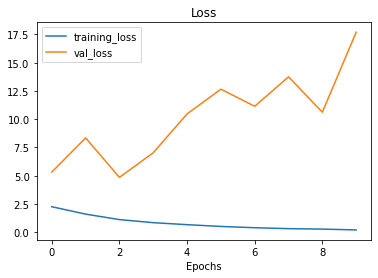

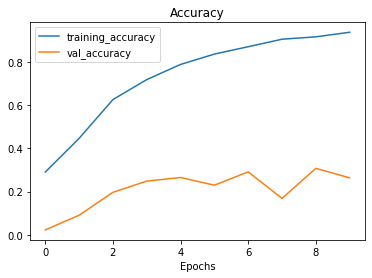

In [156]:
plot_loss_curves(history_12)

In [157]:
# Let's add the results to a table so we can compare it to other models later.
results['Model_12'] = ['SMOTE',
                      history_12.history['val_accuracy'][-1],
                      history_12.history['val_recall'][-1],
                      history_12.history['val_precision'][-1],
                      history_12.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


So, this is interesting. The validation set had a really bad score, but the test set improved on the base model by ending with a score of .68. Previously the validation score and the test scores were so similar I didn't bother even writing the test score down.

I think the change this time is because the validation set was also pulling from SMOTE generated data. I didn't perform SMOTE on the test set.

So, despite the bad performance on validation, I'd say this was a win.

However, we're not supposed to change our hypertuning based on the test set, because if we do then we end up with data leaks. I'll set this aside for now and try other ways to deal with the imbalanced dataset.

The confusion matrix uses the test set. Let's see how it went, there.

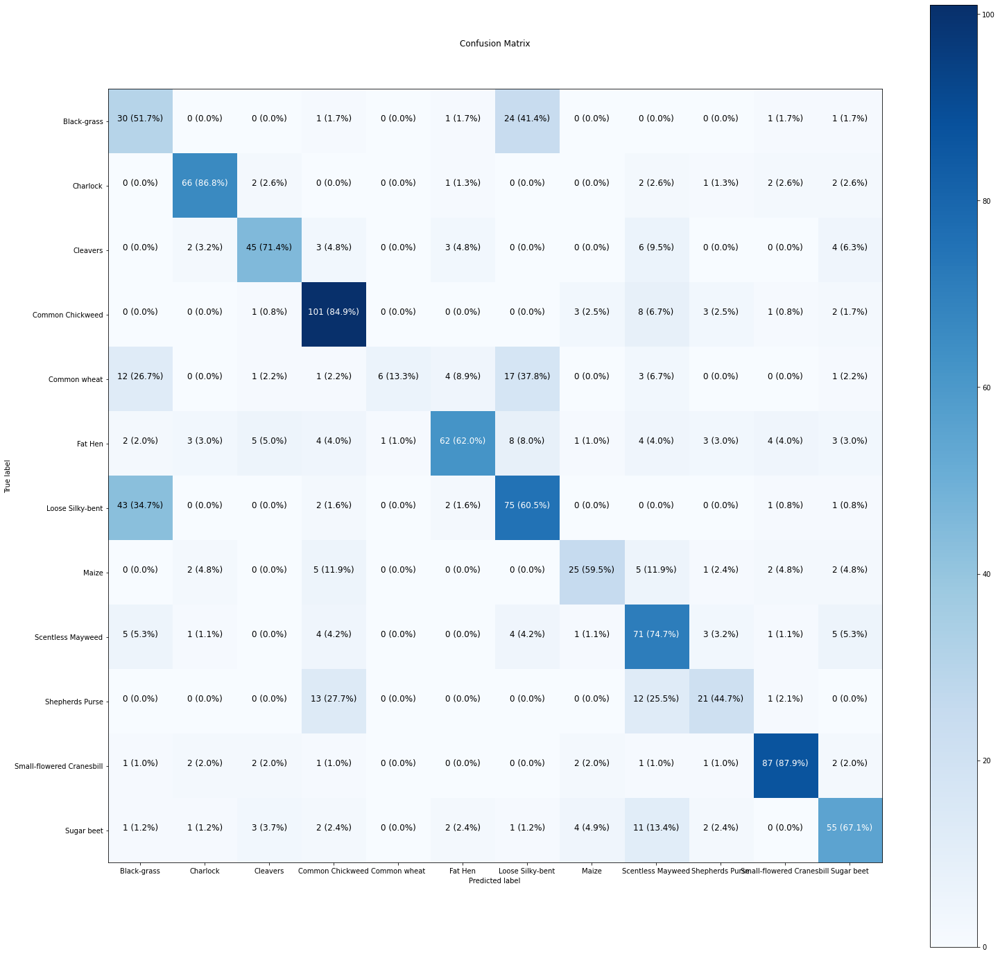

In [158]:
# Make predictions with the model
y_probs = model_12.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

It did pretty well, with the problem areas being about the same as before.

The validation thing was weird. I want to try using class weights instead.

There, now we're free to make a bunch more augmented datasets

In [159]:
# We're having memory problems again, so I have to drop the SMOTE data too.
del(X_smote)
del(y_smote)

gc.collect()

11781

## Class Weights

scikit learn has a class weights method, but it doesn't output what TensorFlow needs.

I found the below user function online that does this for me. Thanks Angel Igareta!

In [160]:


def generate_class_weights(class_series, multi_class=True, one_hot_encoded=False):
  """
  Method to generate class weights given a set of multi-class or multi-label labels, both one-hot-encoded or not.
  Some examples of different formats of class_series and their outputs are:
    - generate_class_weights(['mango', 'lemon', 'banana', 'mango'], multi_class=True, one_hot_encoded=False)
    {'banana': 1.3333333333333333, 'lemon': 1.3333333333333333, 'mango': 0.6666666666666666}
    - generate_class_weights([[1, 0, 0], [0, 1, 0], [0, 0, 1], [1, 0, 0]], multi_class=True, one_hot_encoded=True)
    {0: 0.6666666666666666, 1: 1.3333333333333333, 2: 1.3333333333333333}
    - generate_class_weights([['mango', 'lemon'], ['mango'], ['lemon', 'banana'], ['lemon']], multi_class=False, one_hot_encoded=False)
    {'banana': 1.3333333333333333, 'lemon': 0.4444444444444444, 'mango': 0.6666666666666666}
    - generate_class_weights([[0, 1, 1], [0, 0, 1], [1, 1, 0], [0, 1, 0]], multi_class=False, one_hot_encoded=True)
    {0: 1.3333333333333333, 1: 0.4444444444444444, 2: 0.6666666666666666}
  The output is a dictionary in the format { class_label: class_weight }. In case the input is one hot encoded, the class_label would be index
  of appareance of the label when the dataset was processed. 
  In multi_class this is np.unique(class_series) and in multi-label np.unique(np.concatenate(class_series)).
  Author: Angel Igareta (angel@igareta.com)
  """
  if multi_class:
    # If class is one hot encoded, transform to categorical labels to use compute_class_weight   
    if one_hot_encoded:
      class_series = np.argmax(class_series, axis=1)
  
    # Compute class weights with sklearn method
    class_labels = np.unique(class_series)
    class_weights = compute_class_weight(class_weight='balanced', classes=class_labels, y=class_series)
    return dict(zip(class_labels, class_weights))
  else:
    # It is neccessary that the multi-label values are one-hot encoded
    mlb = None
    if not one_hot_encoded:
      mlb = MultiLabelBinarizer()
      class_series = mlb.fit_transform(class_series)

    n_samples = len(class_series)
    n_classes = len(class_series[0])

    # Count each class frequency
    class_count = [0] * n_classes
    for classes in class_series:
        for index in range(n_classes):
            if classes[index] != 0:
                class_count[index] += 1
    
    # Compute class weights using balanced method
    class_weights = [n_samples / (n_classes * freq) if freq > 0 else 1 for freq in class_count]
    class_labels = range(len(class_weights)) if mlb is None else mlb.classes_
    return dict(zip(class_labels, class_weights))

In [161]:
#If this works, it should give me a dictionary with the weights I want.
class_weights = generate_class_weights(y_train, one_hot_encoded=True) 
class_weights

{0: 1.5447154471544715,
 1: 1.0084925690021231,
 2: 1.4136904761904763,
 3: 0.6436314363143631,
 4: 1.7992424242424243,
 5: 0.8444444444444444,
 6: 0.5974842767295597,
 7: 1.7690875232774674,
 8: 0.7521773555027712,
 9: 1.7210144927536233,
 10: 0.797649034424853,
 11: 1.045104510451045}

Nice, looks like we're good to go. All I have to do is plug this in to the fit function.

In [162]:
# Set random seed
tf.random.set_seed(42)

# Still using TinyVGG, but this time with augmentation layers!
model_13 = Sequential([
                      tf.keras.layers.Resizing(128,128), #Resize to 128
                      tf.keras.layers.Rescaling(1./255), #Scaling all values to be between 0 and 1
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_13.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the images
history_13= model_13.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            class_weight=class_weights, #Using our newly calculated class weights
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 29ms/step - loss: 2.4104 - tp: 630.0000 - fp: 270.0000 - tn: 39440.0000 - fn: 2980.0000 - accuracy: 0.2681 - precision: 0.7000 - recall: 0.1745 - f1_score: 0.2715 - val_loss: 2.0855 - val_tp: 45.0000 - val_fp: 15.0000 - val_tn: 12525.0000 - val_fn: 1095.0000 - val_accuracy: 0.2009 - val_precision: 0.7500 - val_recall: 0.0395 - val_f1_score: 0.1401
Epoch 2/10
84/84 [==============================] - 2s 20ms/step - loss: 1.7025 - tp: 318.0000 - fp: 144.0000 - tn: 29116.0000 - fn: 2342.0000 - accuracy: 0.3801 - precision: 0.6883 - recall: 0.1195 - f1_score: 0.3649 - val_loss: 1.5812 - val_tp: 208.0000 - val_fp: 112.0000 - val_tn: 12428.0000 - val_fn: 932.0000 - val_accuracy: 0.4228 - val_precision: 0.6500 - val_recall: 0.1825 - val_f1_score: 0.4090
Epoch 3/10
84/84 [==============================] - 2s 20ms/step - loss: 1.4348 - tp: 676.0000 - fp: 218.0000 - tn: 29042.0000 - fn: 1984.0000 - accuracy: 0.5023 - precision: 0.7562 - recal

In [163]:
# Checking performance on the test set
model_13.evaluate(X_test, y_test)

30/30 [==============================] - 0s 10ms/step - loss: 1.3890 - tp: 554.0000 - fp: 270.0000 - tn: 10180.0000 - fn: 396.0000 - accuracy: 0.6421 - precision: 0.6723 - recall: 0.5832 - f1_score: 0.6042


[1.3890316486358643,
 554.0,
 270.0,
 10180.0,
 396.0,
 0.6421052813529968,
 0.6723300814628601,
 0.5831578969955444,
 array([0.3157895 , 0.77551025, 0.7457627 , 0.8122271 , 0.37254906,
        0.6666667 , 0.61478597, 0.53125   , 0.5938865 , 0.48101267,
        0.789916  , 0.55128205], dtype=float32)]

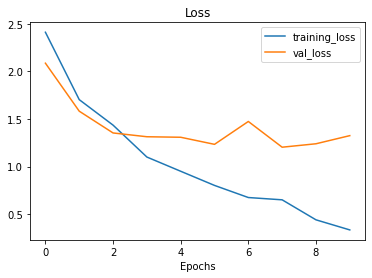

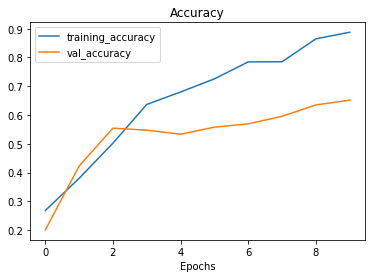

In [164]:
plot_loss_curves(history_13)

In [165]:
# Let's add the results to a table so we can compare it to other models later.
results['Model_13'] = ['Class weights',
                      history_13.history['val_accuracy'][-1],
                      history_13.history['val_recall'][-1],
                      history_13.history['val_precision'][-1],
                      history_13.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


That's a good improvement on the baseline model. The accuracy on the test set is slightly lower than the SMOTE version, though, but not by much. 

We're not supposed to hypertune based on our test set results to prevent dataleaks. So, I'm going to go with class weights here because it performed much better on the validation set.

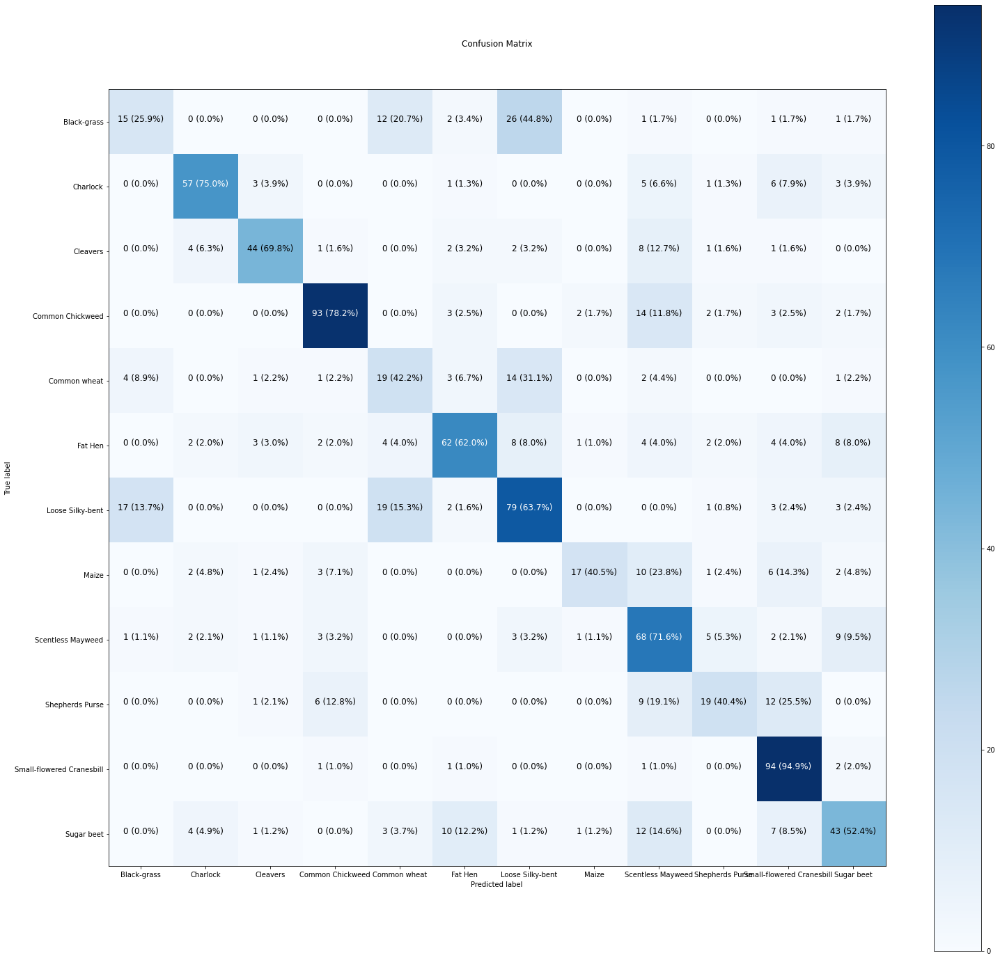

In [166]:
# Make predictions with the model
y_probs = model_13.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

I was hoping the class weights would have helped solve the black grass and loose silky bent problems. Unfortunately, it didn't.

The discussion on the competition also suggested we do the following augmentation in addition to zoom/rotation, though they didn't specify exact values or provide code:

* Cropping
* Flipping
* Translation
* Adding Noise

I think I can figure those out, let's do it!

## Cropping

This reduces the size of the image by cutting off random edges.

In [167]:
# Set random seed
tf.random.set_seed(42)

# Still using TinyVGG, but this time with augmentation layers!
model_14 = Sequential([
                      tf.keras.layers.Resizing(128,128), #Resize to 128
                      tf.keras.layers.Rescaling(1./255),  #Scaling all values to be between 0 and 1
                      tf.keras.layers.RandomCrop(100,100), # Cropping to 100x100 sized images, randomly.
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_14.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the new blurred images
history_14= model_14.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 29ms/step - loss: 2.4241 - tp: 554.0000 - fp: 270.0000 - tn: 39440.0000 - fn: 3056.0000 - accuracy: 0.2687 - precision: 0.6723 - recall: 0.1535 - f1_score: 0.2474 - val_loss: 2.3603 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1605 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0520
Epoch 2/10
84/84 [==============================] - 1s 17ms/step - loss: 2.2234 - tp: 11.0000 - fp: 14.0000 - tn: 29246.0000 - fn: 2649.0000 - accuracy: 0.2147 - precision: 0.4400 - recall: 0.0041 - f1_score: 0.1202 - val_loss: 1.9365 - val_tp: 10.0000 - val_fp: 1.0000 - val_tn: 12539.0000 - val_fn: 1130.0000 - val_accuracy: 0.3193 - val_precision: 0.9091 - val_recall: 0.0088 - val_f1_score: 0.2048
Epoch 3/10
84/84 [==============================] - 1s 17ms/step - loss: 1.8754 - tp: 204.0000 - fp: 146.0000 - tn: 29114.0000 - fn: 2456.0000 - accuracy: 0.3515 - precision: 0.58

In [168]:
# Checking performance on the test set
model_14.evaluate(X_test, y_test)

30/30 [==============================] - 0s 11ms/step - loss: 1.2711 - tp: 347.0000 - fp: 117.0000 - tn: 10333.0000 - fn: 603.0000 - accuracy: 0.5653 - precision: 0.7478 - recall: 0.3653 - f1_score: 0.5025


[1.2711353302001953,
 347.0,
 117.0,
 10333.0,
 603.0,
 0.5652631521224976,
 0.7478448152542114,
 0.3652631640434265,
 array([0.37288135, 0.71232873, 0.47727275, 0.7595819 , 0.22580646,
        0.35582823, 0.6578948 , 0.5217392 , 0.49056605, 0.16949153,
        0.6588235 , 0.62721896], dtype=float32)]

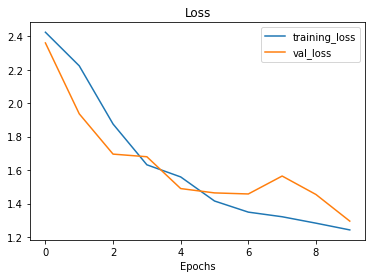

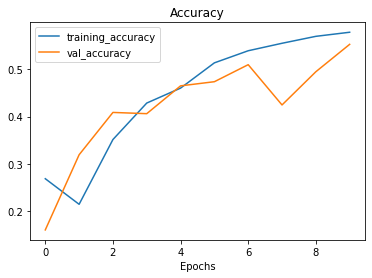

In [169]:
plot_loss_curves(history_14)

In [170]:
# Now to add model_1 to our comparisons
results['Model_14'] = ['Random Crop',
                      history_14.history['val_accuracy'][-1],
                      history_14.history['val_recall'][-1],
                      history_14.history['val_precision'][-1],
                      history_14.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


That really looks like it could benefit from more epochs. It definitely hasn't flatlined yet.

Even so, the experiments thus far have all been 10 epochs, and I don't want to mess with that.

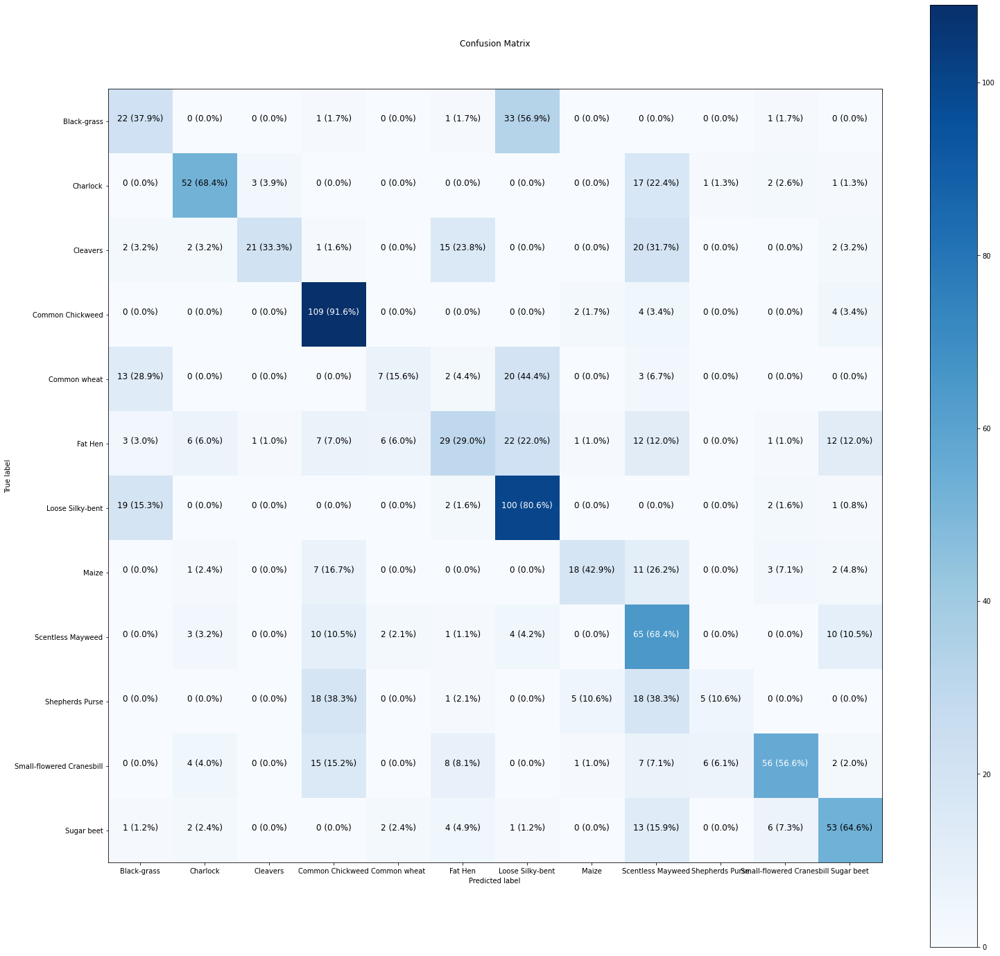

In [171]:
# Make predictions with the model
y_probs = model_14.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

Adding cropping didn't get rid of our poor performing areas either. Ah, well.

## Flipping

This flips the image either horizontally or vertically.

In [172]:
# Set random seed
tf.random.set_seed(42)

# Still using TinyVGG, but this time with augmentation layers!
model_15 = Sequential([
                      tf.keras.layers.Resizing(128,128), #Resize to 128
                      tf.keras.layers.Rescaling(1./255),  #Scaling all values to be between 0 and 1
                      tf.keras.layers.RandomFlip(), # flipping horizontal and vertical randomly
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_15.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the images
history_15= model_15.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 29ms/step - loss: 2.3914 - tp: 347.0000 - fp: 117.0000 - tn: 39593.0000 - fn: 3263.0000 - accuracy: 0.2657 - precision: 0.7478 - recall: 0.0961 - f1_score: 0.2139 - val_loss: 2.1712 - val_tp: 1.0000 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1139.0000 - val_accuracy: 0.2368 - val_precision: 1.0000 - val_recall: 8.7719e-04 - val_f1_score: 0.0978
Epoch 2/10
84/84 [==============================] - 2s 20ms/step - loss: 1.7099 - tp: 355.0000 - fp: 184.0000 - tn: 29076.0000 - fn: 2305.0000 - accuracy: 0.4207 - precision: 0.6586 - recall: 0.1335 - f1_score: 0.3275 - val_loss: 1.4881 - val_tp: 267.0000 - val_fp: 131.0000 - val_tn: 12409.0000 - val_fn: 873.0000 - val_accuracy: 0.5193 - val_precision: 0.6709 - val_recall: 0.2342 - val_f1_score: 0.3950
Epoch 3/10
84/84 [==============================] - 2s 20ms/step - loss: 1.4025 - tp: 762.0000 - fp: 359.0000 - tn: 28901.0000 - fn: 1898.0000 - accuracy: 0.5195 - precision: 0.6798 -

In [173]:
# Checking performance on the test set
model_15.evaluate(X_test, y_test)

30/30 [==============================] - 0s 8ms/step - loss: 0.8927 - tp: 560.0000 - fp: 154.0000 - tn: 10296.0000 - fn: 390.0000 - accuracy: 0.7000 - precision: 0.7843 - recall: 0.5895 - f1_score: 0.6501


[0.8926924467086792,
 560.0,
 154.0,
 10296.0,
 390.0,
 0.699999988079071,
 0.7843137383460999,
 0.5894736647605896,
 array([0.39655176, 0.84662575, 0.74545455, 0.8861789 , 0.30555555,
        0.72477067, 0.6690909 , 0.6571429 , 0.63492066, 0.41176468,
        0.8356808 , 0.6875    ], dtype=float32)]

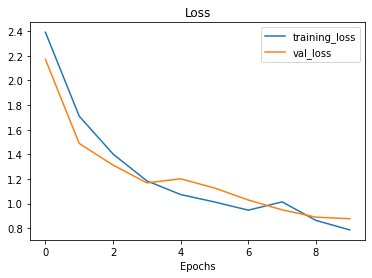

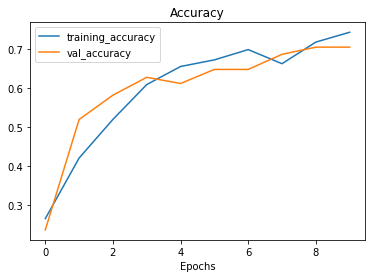

In [174]:
plot_loss_curves(history_15)

In [175]:
# Now to add the model to our comparisons
results['Model_15'] = ['Random Flip',
                      history_15.history['val_accuracy'][-1],
                      history_15.history['val_recall'][-1],
                      history_15.history['val_precision'][-1],
                      history_15.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


Random flip improved on the baseline model a good chunk, and based on those curves it looks like we could get even more out of it by running more epochs. I'm definitely including this augmentation later.

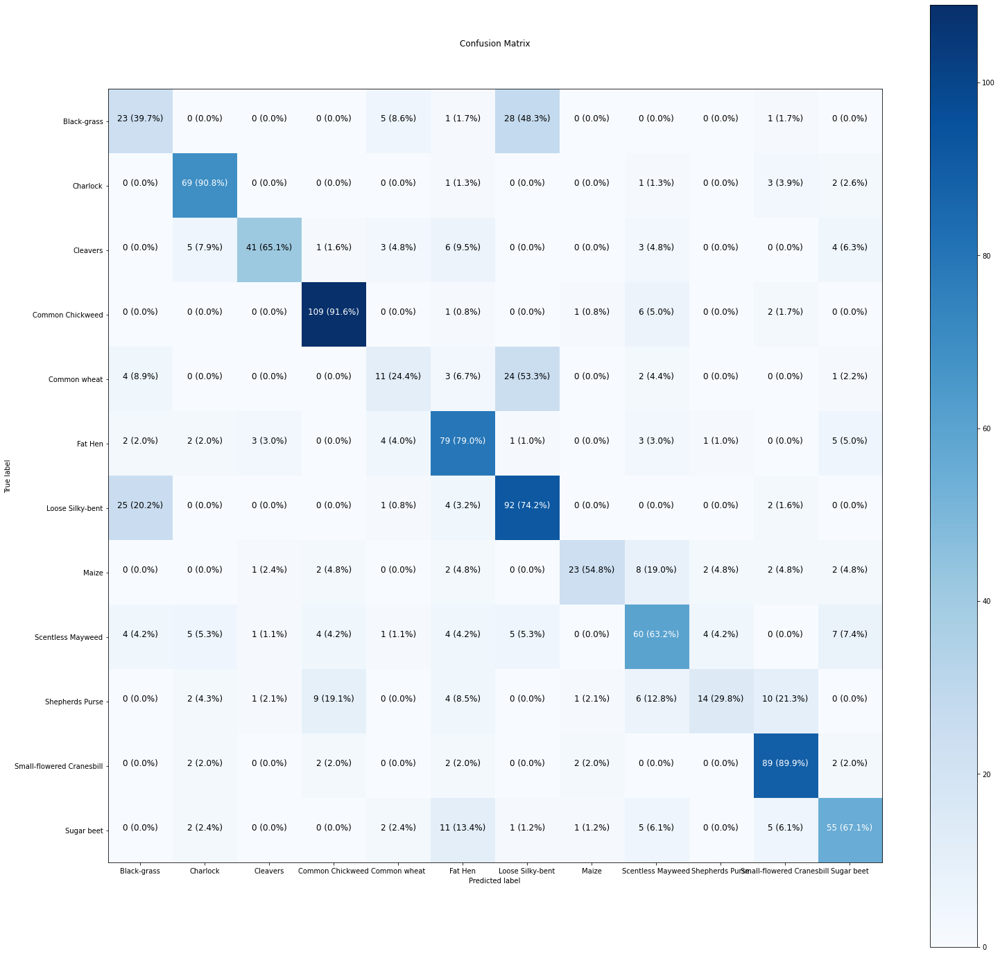

In [176]:
# Make predictions with the model
y_probs = model_15.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

Overall the three main problem areas remain: common wheat is all over the place, and black grass and loose silky-bent are being mistaken for one another.

Let's test out some other augmentations.

## Translation

Translation is moving the image up or over in a random direction. I couldn't find any guidance on exactly how much translation is good, so I'm just going to use a modest 20% shift.

In [177]:
# Set random seed
tf.random.set_seed(42)

# Still using TinyVGG, but this time with augmentation layers!
model_16 = Sequential([
                      tf.keras.layers.Resizing(128,128), #Resize to 128
                      tf.keras.layers.Rescaling(1./255),  #Scaling all values to be between 0 and 1
                      tf.keras.layers.RandomTranslation(0.2,0.2), # shifting randomly up to 20% in any direction
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_16.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the images
history_16= model_16.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 29ms/step - loss: 2.4196 - tp: 560.0000 - fp: 154.0000 - tn: 39556.0000 - fn: 3050.0000 - accuracy: 0.2950 - precision: 0.7843 - recall: 0.1551 - f1_score: 0.2696 - val_loss: 2.3175 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.2096 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0817
Epoch 2/10
84/84 [==============================] - 2s 20ms/step - loss: 2.2604 - tp: 2.0000 - fp: 14.0000 - tn: 29246.0000 - fn: 2658.0000 - accuracy: 0.2098 - precision: 0.1250 - recall: 7.5188e-04 - f1_score: 0.0961 - val_loss: 1.9143 - val_tp: 12.0000 - val_fp: 1.0000 - val_tn: 12539.0000 - val_fn: 1128.0000 - val_accuracy: 0.3412 - val_precision: 0.9231 - val_recall: 0.0105 - val_f1_score: 0.1967
Epoch 3/10
84/84 [==============================] - 2s 20ms/step - loss: 1.9184 - tp: 93.0000 - fp: 86.0000 - tn: 29174.0000 - fn: 2567.0000 - accuracy: 0.3083 - precision: 0.5

In [178]:
# Evaluating on the test set.
model_16.evaluate(X_test, y_test)

30/30 [==============================] - 0s 8ms/step - loss: 1.2573 - tp: 400.0000 - fp: 148.0000 - tn: 10302.0000 - fn: 550.0000 - accuracy: 0.5863 - precision: 0.7299 - recall: 0.4211 - f1_score: 0.5370


[1.2572622299194336,
 400.0,
 148.0,
 10302.0,
 550.0,
 0.5863158106803894,
 0.7299270033836365,
 0.42105263471603394,
 array([0.3916084 , 0.5816733 , 0.63793105, 0.9009009 , 0.12903225,
        0.4935065 , 0.6814159 , 0.57500005, 0.49361706, 0.32786888,
        0.69109946, 0.5408805 ], dtype=float32)]

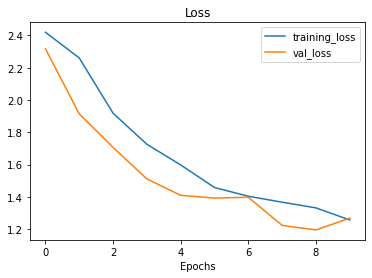

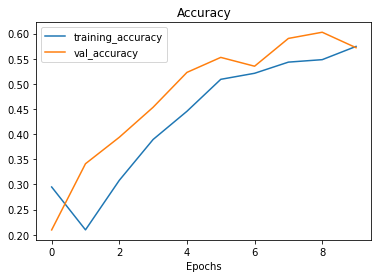

In [179]:
plot_loss_curves(history_16)

In [180]:
# Now to add the model to our comparisons
results['Model_16'] = ['Random Translation',
                      history_16.history['val_accuracy'][-1],
                      history_16.history['val_recall'][-1],
                      history_16.history['val_precision'][-1],
                      history_16.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


Flip did about as well as the baseline with only 10 epochs, but the accuracy curves imply it will do a lot better if we keep training. To me this means we should include it in the final model, and just add more epochs.

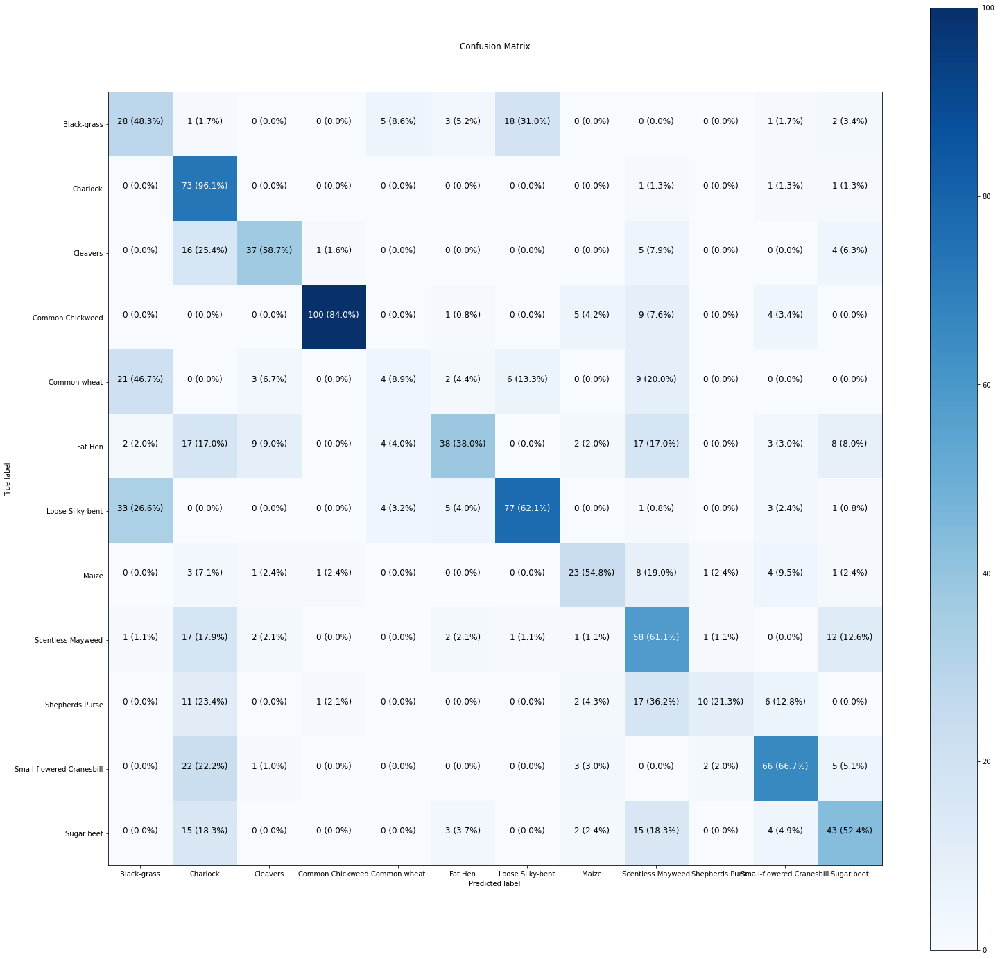

In [181]:
# Make predictions with the model
y_probs = model_16.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

Unfortunately, again, the main problem areas persist. I am unsure how to deal with these using only a single model.

## GaussianNoise

Unlike Gaussian blur, Gaussian Noise just adds noise. This helps with overfitting, supposedly, which we have had a problem with on baseline.

In [182]:
# Set random seed
tf.random.set_seed(42)

# Still using TinyVGG, but this time with augmentation layers!
model_17 = Sequential([
                      tf.keras.layers.Resizing(128,128), #Resize to 128
                      tf.keras.layers.Rescaling(1./255),  #Scaling all values to be between 0 and 1
                      tf.keras.layers.GaussianNoise(0.2),# adding noise with a STD of 0.2
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_17.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the images
history_17= model_17.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 4s 28ms/step - loss: 2.4096 - tp: 400.0000 - fp: 148.0000 - tn: 39562.0000 - fn: 3210.0000 - accuracy: 0.2643 - precision: 0.7299 - recall: 0.1108 - f1_score: 0.2220 - val_loss: 2.2718 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.2658 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.1073
Epoch 2/10
84/84 [==============================] - 2s 20ms/step - loss: 1.8402 - tp: 249.0000 - fp: 135.0000 - tn: 29125.0000 - fn: 2411.0000 - accuracy: 0.3744 - precision: 0.6484 - recall: 0.0936 - f1_score: 0.2804 - val_loss: 1.7395 - val_tp: 119.0000 - val_fp: 53.0000 - val_tn: 12487.0000 - val_fn: 1021.0000 - val_accuracy: 0.3772 - val_precision: 0.6919 - val_recall: 0.1044 - val_f1_score: 0.3032
Epoch 3/10
84/84 [==============================] - 2s 19ms/step - loss: 1.5703 - tp: 514.0000 - fp: 234.0000 - tn: 29026.0000 - fn: 2146.0000 - accuracy: 0.4654 - precision: 

In [183]:
# Checking performance on the test set
model_17.evaluate(X_test, y_test)

30/30 [==============================] - 0s 10ms/step - loss: 1.5716 - tp: 305.0000 - fp: 203.0000 - tn: 10247.0000 - fn: 645.0000 - accuracy: 0.4716 - precision: 0.6004 - recall: 0.3211 - f1_score: 0.3776


[1.571648359298706,
 305.0,
 203.0,
 10247.0,
 645.0,
 0.4715789556503296,
 0.6003937125205994,
 0.3210526406764984,
 array([0.3571429 , 0.49411762, 0.08695652, 0.6424581 , 0.03773585,
        0.472973  , 0.45070422, 0.37209302, 0.3649635 , 0.07407407,
        0.74396133, 0.4342105 ], dtype=float32)]

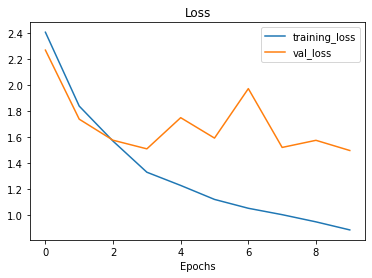

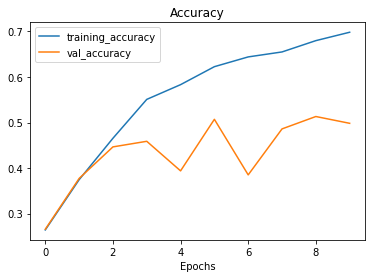

In [184]:
plot_loss_curves(history_17)

In [185]:
# Now to add the model to our comparisons
results['Model_17'] = ['Gaussian Noise',
                      history_17.history['val_accuracy'][-1],
                      history_17.history['val_recall'][-1],
                      history_17.history['val_precision'][-1],
                      history_17.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


Well that didn't work. Not only did the performance suffer, but the curves imply it's overfitting at just 10 epochs. Not good.

I could play around with the amount of noise I add. If I add more, it probably wouldn't overfit. However, this seems like something I'd only do if the final model is really overfitting still, even after all the other augmentations.

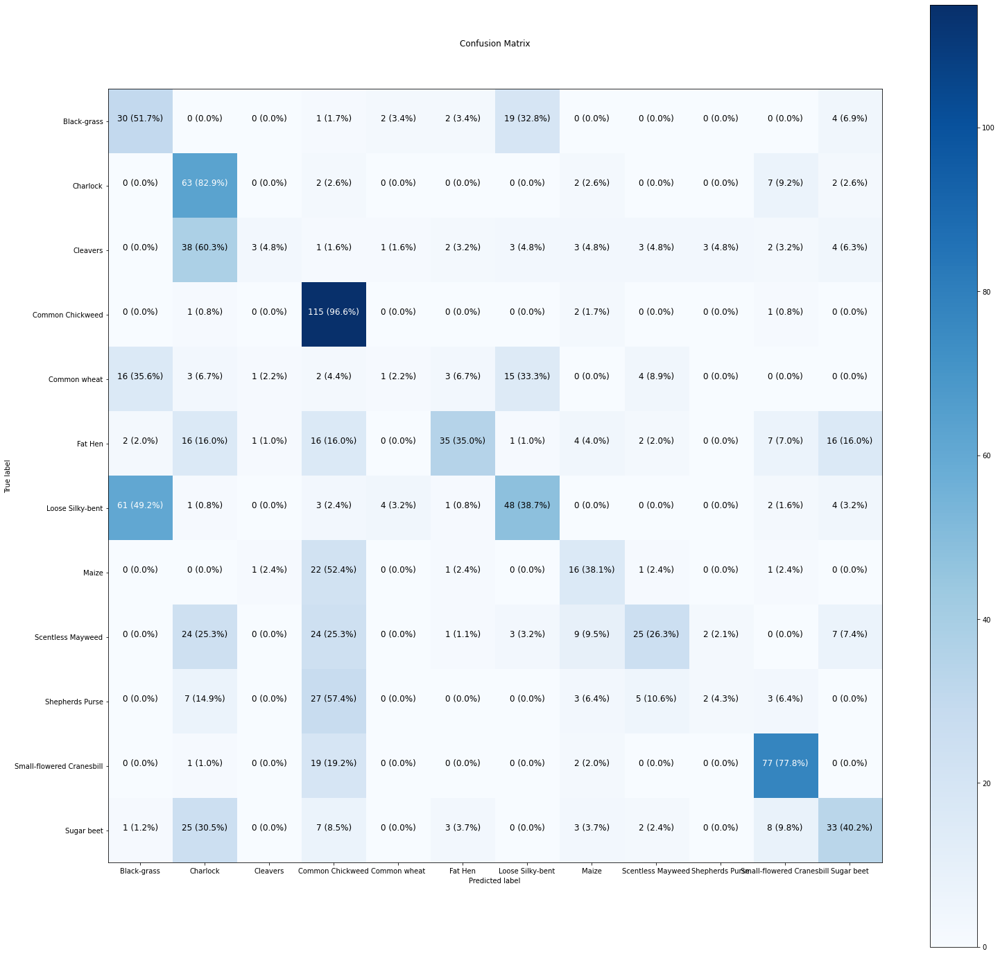

In [186]:
# Make predictions with the model
y_probs = model_17.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

Well, black grass is only rarely being mistaken for loose silky-bent... but that's because all loose silky bent is being labeled as black grass. Common wheat is still all over the place.

# Combining the Augmentations
Up until now I've been operating under the theory that if an augmentation helps the model alone that it will help the model together. Time to test that.


I'm going to add all of the augmentations that improved the model together and see what happens.

In [187]:
# Set random seed
tf.random.set_seed(42)

# Still using TinyVGG, but this time with augmentation layers!
model_18 = Sequential([
                      tf.keras.layers.Resizing(128,128), #Resize to 128
                      tf.keras.layers.Rescaling(1./255),  #Scaling all values to be between 0 and 1
                      tf.keras.layers.RandomZoom(0,.5), # Randomly zooming between +0% and +50%
                      tf.keras.layers.RandomRotation(factor=(-1,1)), # Randomly rotating between 0 and 360 degrees either direction
                      tf.keras.layers.RandomFlip(), # flipping horizontal and vertical randomly
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_18.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the images
history_18= model_18.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=10,
            class_weight=class_weights, #Not forgetting our class weights!
            validation_split = 0.3)

Epoch 1/10
84/84 [==============================] - 5s 31ms/step - loss: 2.4869 - tp: 305.0000 - fp: 203.0000 - tn: 39507.0000 - fn: 3305.0000 - accuracy: 0.1884 - precision: 0.6004 - recall: 0.0845 - f1_score: 0.1674 - val_loss: 2.4699 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.0737 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0223
Epoch 2/10
84/84 [==============================] - 2s 22ms/step - loss: 2.3919 - tp: 0.0000e+00 - fp: 4.0000 - tn: 29256.0000 - fn: 2660.0000 - accuracy: 0.1188 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0921 - val_loss: 2.2491 - val_tp: 0.0000e+00 - val_fp: 4.0000 - val_tn: 12536.0000 - val_fn: 1140.0000 - val_accuracy: 0.1316 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.1071
Epoch 3/10
84/84 [==============================] - 2s 22ms/step - loss: 1.9661 - tp: 93.0000 - fp: 47.0000 - tn: 29213.0000 - fn: 2567.0000 - accuracy: 0.269

In [188]:
# Checking performance on the test set
model_18.evaluate(X_test, y_test)

30/30 [==============================] - 0s 8ms/step - loss: 1.0649 - tp: 441.0000 - fp: 150.0000 - tn: 10300.0000 - fn: 509.0000 - accuracy: 0.6463 - precision: 0.7462 - recall: 0.4642 - f1_score: 0.6348


[1.0648934841156006,
 441.0,
 150.0,
 10300.0,
 509.0,
 0.6463158130645752,
 0.7461928725242615,
 0.46421054005622864,
 array([0.39361703, 0.8513514 , 0.74418604, 0.89626557, 0.27737227,
        0.56497175, 0.5670103 , 0.65789473, 0.63095236, 0.51428574,
        0.8172043 , 0.7019868 ], dtype=float32)]

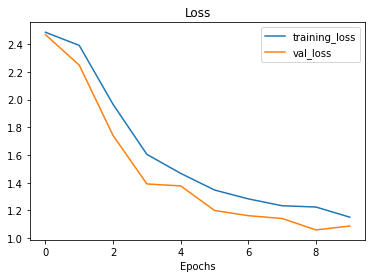

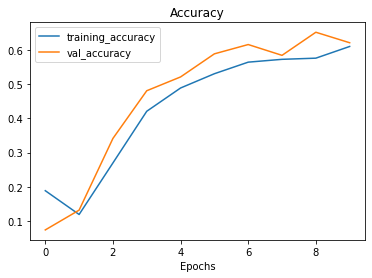

In [189]:
plot_loss_curves(history_18)

In [190]:
# Now to add the model to our comparisons
results['Model_18'] = ['Fully Augmented',
                      history_18.history['val_accuracy'][-1],
                      history_18.history['val_recall'][-1],
                      history_18.history['val_precision'][-1],
                      history_18.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


Within 10 epochs, the model got to about the same level as the baseline. However, if you compare its trajectory to the baseline's, the baseline was just getting more and more overfit, whereas our fully augmented model is still on an upward trend. I want to give this model more epochs.

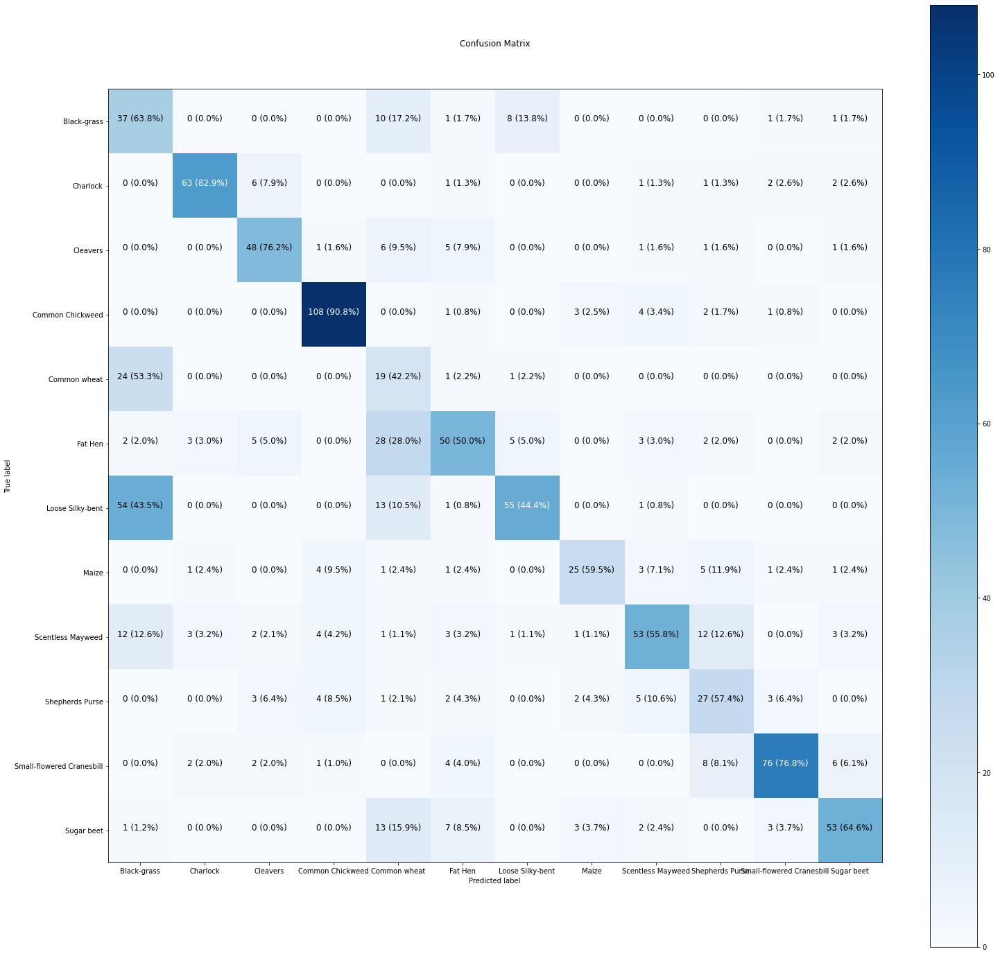

In [191]:
# Make predictions with the model
y_probs = model_18.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

Our augmented model seems to be leaning towards classifying all loose silky bent as black grass, which is distinctly different from the baseline kind of making that error 50/50. I'm curious to see how more epochs change this outcome.

In [192]:
# Set random seed
tf.random.set_seed(42)

# Still using TinyVGG, but this time with augmentation layers!
model_19 = Sequential([
                      tf.keras.layers.Resizing(128,128), #Resize to 128
                      tf.keras.layers.Rescaling(1./255),  #Scaling all values to be between 0 and 1
                      tf.keras.layers.RandomZoom(0,.5), # Randomly zooming between +0% and +50%
                      tf.keras.layers.RandomRotation(factor=(-1,1)), # Randomly rotating between 0 and 360 degrees either direction
                      tf.keras.layers.RandomFlip(), # flipping horizontal and vertical randomly
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_19.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

#Fitting with the images
history_19= model_19.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=40, #Now with 4x the epochs!
            class_weight=class_weights,
            validation_split = 0.3)

Epoch 1/40
84/84 [==============================] - 5s 31ms/step - loss: 2.4132 - tp: 442.0000 - fp: 153.0000 - tn: 39557.0000 - fn: 3168.0000 - accuracy: 0.2560 - precision: 0.7429 - recall: 0.1224 - f1_score: 0.2657 - val_loss: 2.1361 - val_tp: 2.0000 - val_fp: 5.0000 - val_tn: 12535.0000 - val_fn: 1138.0000 - val_accuracy: 0.1807 - val_precision: 0.2857 - val_recall: 0.0018 - val_f1_score: 0.1340
Epoch 2/40
84/84 [==============================] - 2s 22ms/step - loss: 1.9093 - tp: 144.0000 - fp: 68.0000 - tn: 29192.0000 - fn: 2516.0000 - accuracy: 0.2846 - precision: 0.6792 - recall: 0.0541 - f1_score: 0.2649 - val_loss: 1.7436 - val_tp: 69.0000 - val_fp: 41.0000 - val_tn: 12499.0000 - val_fn: 1071.0000 - val_accuracy: 0.3360 - val_precision: 0.6273 - val_recall: 0.0605 - val_f1_score: 0.3034
Epoch 3/40
84/84 [==============================] - 2s 22ms/step - loss: 1.7875 - tp: 211.0000 - fp: 122.0000 - tn: 29138.0000 - fn: 2449.0000 - accuracy: 0.3492 - precision: 0.6336 - recall: 0

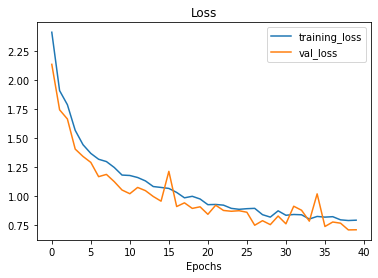

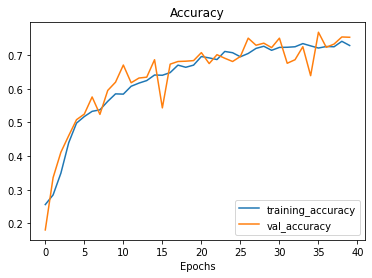

In [193]:
plot_loss_curves(history_19)

In [194]:
# Checking performance on the test set
model_19.evaluate(X_test, y_test)

30/30 [==============================] - 0s 9ms/step - loss: 0.7323 - tp: 655.0000 - fp: 137.0000 - tn: 10313.0000 - fn: 295.0000 - accuracy: 0.7589 - precision: 0.8270 - recall: 0.6895 - f1_score: 0.7472


[0.7322810888290405,
 655.0,
 137.0,
 10313.0,
 295.0,
 0.7589473724365234,
 0.8270202279090881,
 0.6894736886024475,
 array([0.4962406 , 0.9251701 , 0.7151515 , 0.89626557, 0.64935064,
        0.69135803, 0.69911504, 0.82926834, 0.7333333 , 0.7184466 ,
        0.88349515, 0.7297298 ], dtype=float32)]

In [195]:
# Now to add the model to our comparisons
results['Model_19'] = ['Fully Augmented 50 epochs',
                      history_19.history['val_accuracy'][-1],
                      history_19.history['val_recall'][-1],
                      history_19.history['val_precision'][-1],
                      history_19.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


Yeah! Look at that! .74! That's a huge boost over baseline. It got even higher on the test set! Those augmentations helped a lot, they just needed a little more time to learn.

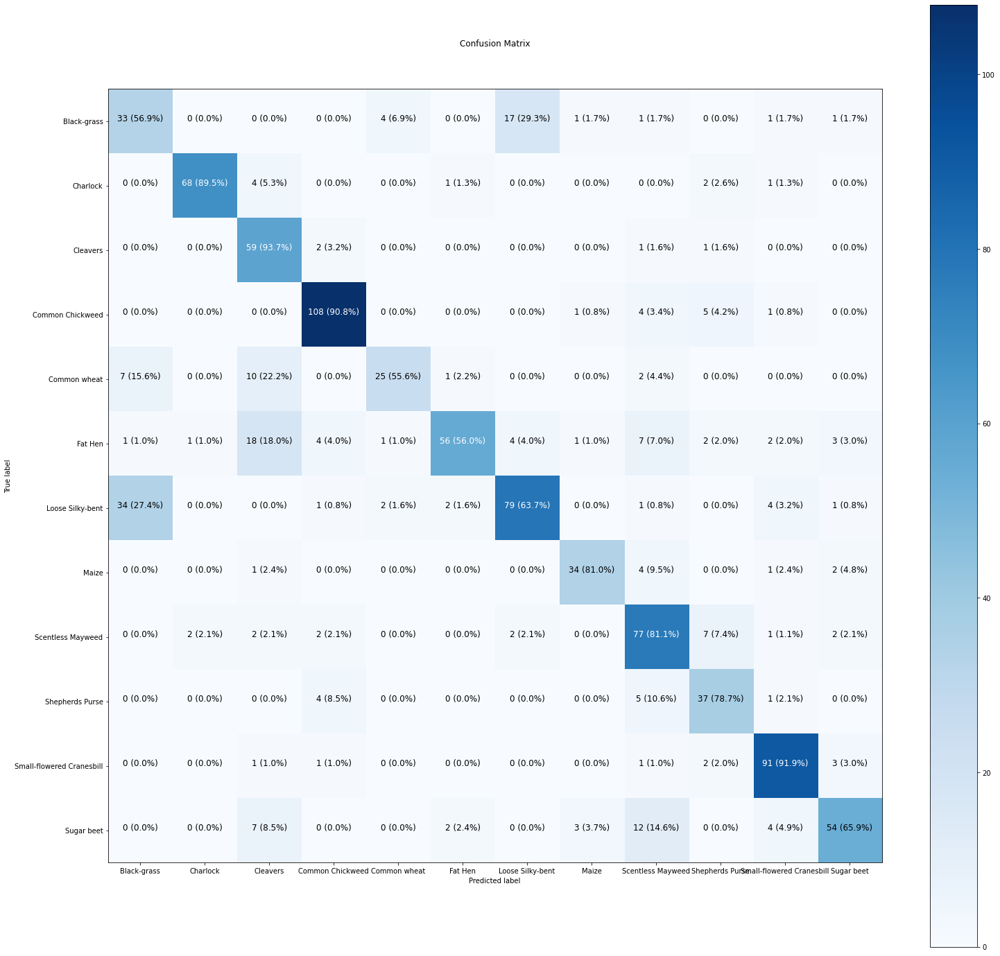

In [196]:
# Make predictions with the model
y_probs = model_19.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

Our big problem classes are still being a pain, though it's more one-sided than before with Loose silky-bent being mistaken for black grass but not vice-versa as often.

# ResNet Architecture

Along with finding which augmentations are preferred for this kind of model, I researched what the best-in-class models for image classification are.

One name that came up repeatedly was a model architecture called ResNet. This is a very deep network that has only a pooling layer at the very beginning and another one at the very end.

Time to cast off our TinyVGG and use our data augmentation in a much deeper neural network.

ResNet50 is a pre-made architecture, so I'm borrowing the architecture code from Sachin Mohan. Thanks! I'm going to try and adapt it to our use here.

ResNet50 requires two different "blocks", identity blocks and convulutional blocks. We will make these blocks and then build a model using these blocks.

Finally, we'll make an output section separate from this, tailored to our needs here.

In [197]:
#Let's import the libraries needed specifically for ResNet
import cv2
import numpy as np
import os
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K
import keras
from keras.models import Sequential, Model,load_model
from keras.callbacks import EarlyStopping,ModelCheckpoint
from google.colab.patches import cv2_imshow
from keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D,MaxPool2D
from keras.preprocessing import image
from keras.initializers import glorot_uniform

The ReNet50 implementation I'm drawing from uses image generators, probably because a lot of datasets have millions of images and need the image generators to help reduce the load.

Despite my image dataset being quite small, I'm going to use the image generator so I can put my dataset into the architecture without having to make too many changes.

In [198]:
# Using image data generators allows me a third way of doing preprocessing before I even move the data to the model.
train_datagen = ImageDataGenerator(rescale=1./255,
                                   zoom_range=[0,0.5],
                                   rotation_range=360,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   validation_split= 0.3) #All the augmentations I did before

In [199]:
def identity_block(X, f, filters, stage, block):
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    F1, F2, F3 = filters

    X_shortcut = X
   
    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2a', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X = Add()([X, X_shortcut])# SKIP Connection
    X = Activation('relu')(X)

    return X

In [200]:
def convolutional_block(X, f, filters, stage, block, s=2):
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    F1, F2, F3 = filters

    X_shortcut = X

    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '2a', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X_shortcut = Conv2D(filters=F3, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '1', kernel_initializer=glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis=3, name=bn_name_base + '1')(X_shortcut)

    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)

    return X

In [201]:
def ResNet50(input_shape=(224, 224, 3)):

    X_input = Input(input_shape)

    X = ZeroPadding2D((3, 3))(X_input)

    X = Conv2D(64, (7, 7), strides=(2, 2), name='conv1', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name='bn_conv1')(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    X = convolutional_block(X, f=3, filters=[64, 64, 256], stage=2, block='a', s=1)
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='b')
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='c')


    X = convolutional_block(X, f=3, filters=[128, 128, 512], stage=3, block='a', s=2)
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='d')

    X = convolutional_block(X, f=3, filters=[256, 256, 1024], stage=4, block='a', s=2)
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='b')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='c')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='d')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='e')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='f')

    X = X = convolutional_block(X, f=3, filters=[512, 512, 2048], stage=5, block='a', s=2)
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='b')
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='c')

    X = AveragePooling2D(pool_size=(2, 2), padding='same')(X)
    
    model = Model(inputs=X_input, outputs=X, name='ResNet50')

    return model

In [202]:
# This saves the "base" of the model, the part we're not really going to change much.
base_model = ResNet50(input_shape=(128,128,3))

In [203]:
# This makes a "head", the finetuning part of the model that we do want to change.
headModel = base_model.output
headModel = Flatten()(headModel)
headModel=Dense(256, activation='relu', name='fc1',kernel_initializer=glorot_uniform(seed=0))(headModel)
headModel=Dense(128, activation='relu', name='fc2',kernel_initializer=glorot_uniform(seed=0))(headModel)
headModel = Dense(12,activation='softmax', name='fc3',kernel_initializer=glorot_uniform(seed=0))(headModel) #12 nodes for our classes

In [204]:
# Now to start building our model
model_20 = Model(inputs=base_model.input, outputs=headModel)

In [205]:
# Unlike my TinyVGG, the structure of ResNet is not at all obvious, so I'm going to print the model summary
model_20.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 134, 134, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1 (Conv2D)                 (None, 64, 64, 64)   9472        ['zero_padding2d[0][0]']         
                                                                                                  
 bn_conv1 (BatchNormalization)  (None, 64, 64, 64)   256         ['conv1[0][0]']              

In [206]:
# We don't want to waste time re-training the coarse features, we can learn from others.
# These weights are from a similar problem space.
base_model.load_weights('/content/drive/MyDrive/UT_Course_project_notebooks/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5')

In [207]:
# We don't want to waste time training the base model, so we're making them untrainable.
for layer in base_model.layers:
    layer.trainable = False

In [208]:
# Did it work? Are they untrainable?
for layer in model_20.layers:
    print(layer, layer.trainable)

<keras.engine.input_layer.InputLayer object at 0x7ff9353fa190> False
<keras.layers.convolutional.ZeroPadding2D object at 0x7ff88108e290> False
<keras.layers.convolutional.Conv2D object at 0x7ff8827955d0> False
<keras.layers.normalization.batch_normalization.BatchNormalization object at 0x7ff883e26210> False
<keras.layers.core.activation.Activation object at 0x7ff883dd1410> False
<keras.layers.pooling.MaxPooling2D object at 0x7ff8b60b9d10> False
<keras.layers.convolutional.Conv2D object at 0x7ff883b69190> False
<keras.layers.normalization.batch_normalization.BatchNormalization object at 0x7ff9353fad50> False
<keras.layers.core.activation.Activation object at 0x7ff883b7fa50> False
<keras.layers.convolutional.Conv2D object at 0x7ff883b63ad0> False
<keras.layers.normalization.batch_normalization.BatchNormalization object at 0x7ff883b7ff90> False
<keras.layers.core.activation.Activation object at 0x7ff9353fa910> False
<keras.layers.convolutional.Conv2D object at 0x7ff883b69ad0> False
<keras

In [209]:
# ResNet is huge so it can train a loooong time. I want to add early stopping so we don't waste time.
es=EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=20)

In [210]:
# I want to identify the best model!
mc = ModelCheckpoint('/content/drive/MyDrive/UT_Course_project_notebooks/best_model.h5',
                     monitor='val_accuracy', save_best_only=True)

In [211]:
# Compile the model
model_20.compile(loss='categorical_crossentropy', #For multi-class classification
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

In [212]:
# Now fitting the model using the generators we made.
history_20 = model_20.fit_generator(train_datagen.flow(X_train,y_train, batch_size=32,subset='training'),
                                  validation_data=train_datagen.flow(X_train,y_train, batch_size=32,subset='validation'),
                                  epochs=100,
                                  verbose=1,
                                  callbacks=[mc,es])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


Epoch 1/100
84/84 [==============================] - ETA: 0s - loss: 2.4512 - tp: 655.0000 - fp: 137.0000 - tn: 39573.0000 - fn: 2955.0000 - accuracy: 0.2884 - precision: 0.8270 - recall: 0.1814 - f1_score: 0.2970

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


84/84 [==============================] - 24s 237ms/step - loss: 2.4512 - tp: 655.0000 - fp: 137.0000 - tn: 39573.0000 - fn: 2955.0000 - accuracy: 0.2884 - precision: 0.8270 - recall: 0.1814 - f1_score: 0.2970 - val_loss: 2.4099 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1421 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0207
Epoch 2/100
84/84 [==============================] - 15s 173ms/step - loss: 2.4348 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 29260.0000 - fn: 2660.0000 - accuracy: 0.1320 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0335 - val_loss: 2.4146 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1421 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0207
Epoch 3/100
84/84 [==============================] - 14s 168ms/step - loss: 2.4288 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 29260.0000 - fn: 2660.0000 - accu

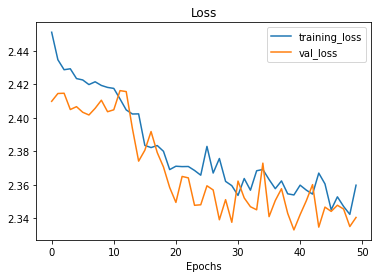

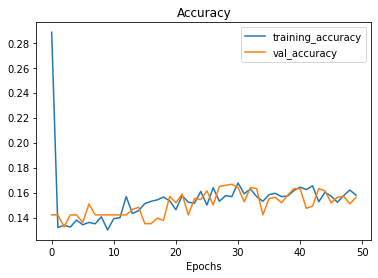

In [213]:
plot_loss_curves(history_20)

In [214]:
# Checking performance on the test set
model_20.evaluate(X_test, y_test)

30/30 [==============================] - 3s 56ms/step - loss: 5.2845 - tp: 33.0000 - fp: 395.0000 - tn: 10055.0000 - fn: 917.0000 - accuracy: 0.0737 - precision: 0.0771 - recall: 0.0347 - f1_score: 0.0242


[5.284510135650635,
 33.0,
 395.0,
 10055.0,
 917.0,
 0.0736842080950737,
 0.07710280269384384,
 0.034736841917037964,
 array([0.12222222, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.1271028 , 0.        , 0.04137931, 0.        ,
        0.        , 0.        ], dtype=float32)]

In [215]:
# Now to add the model to our comparisons
results['Model_20'] = ['ResNet50',
                      history_20.history['val_accuracy'][-1],
                      history_20.history['val_recall'][-1],
                      history_20.history['val_precision'][-1],
                      history_20.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


Well that's just terribly disappointing. All indications were pointing towards ResNet50 being good for this dataset.

I'm going to try tinkering with the model a bit to see if I can get better results with some hypertuning. The author that taught me how to implement ReNet50 recommended SGD for the optimizer, so I'll go ahead and give that a go.

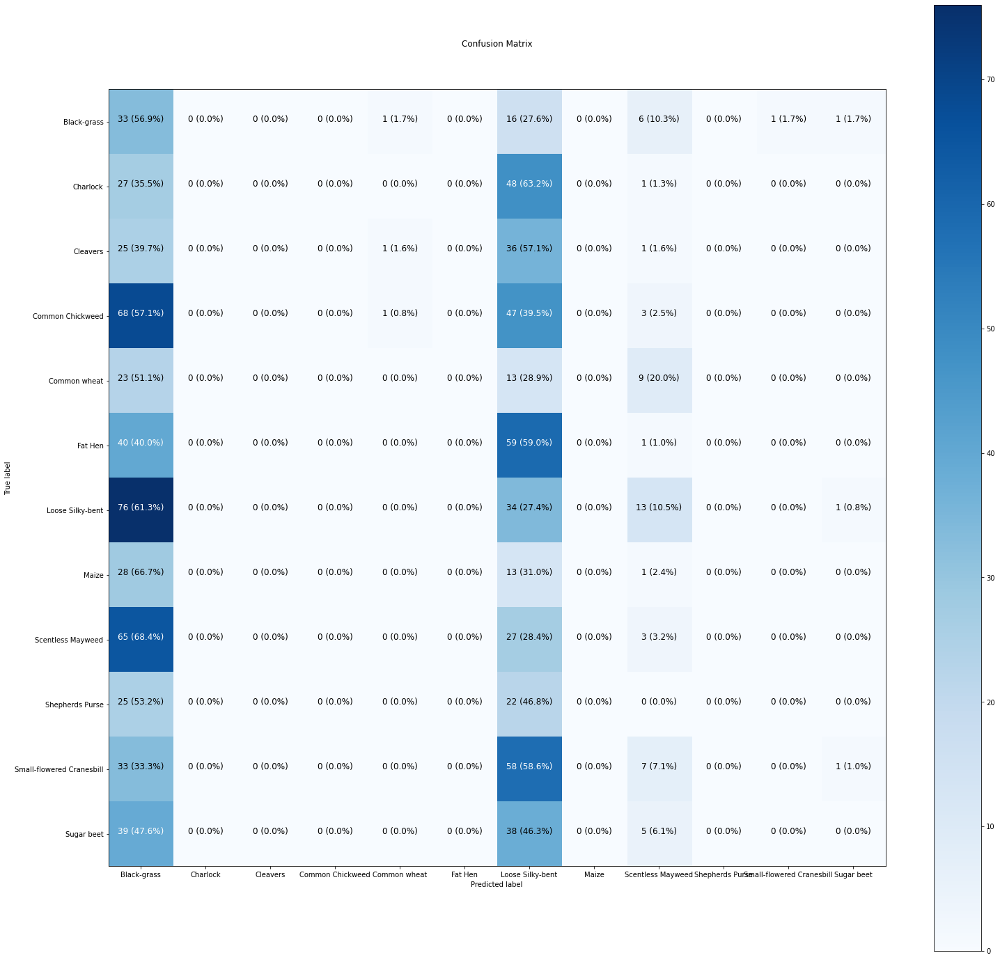

In [216]:
# Make predictions with the model
y_probs = model_20.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

As expected, errors abound.

## Renet50 Tuning

In [217]:
# I'm going to take out the augmentations too.
train_datagen = ImageDataGenerator(rescale=1./255,
                                  #  zoom_range=[0,0.5],
                                  #  rotation_range=360,
                                  #  horizontal_flip=True,
                                  #  vertical_flip=True,
                                   validation_split= 0.3)

In [218]:
# Making a new ResNet model for retraining.
model_21 = Model(inputs=base_model.input, outputs=headModel)

In [219]:
# Compile the model
model_21.compile(loss='categorical_crossentropy', #For multi-class classification
                optimizer=tf.keras.optimizers.SGD(), #Using SGD this time.
                metrics=METRICS)

In [220]:
# Fitting with the new generator with no augmentations
history_21 = model_21.fit_generator(train_datagen.flow(X_train,y_train, batch_size=32,subset='training'),
                                  validation_data=train_datagen.flow(X_train,y_train, batch_size=32,subset='validation'),
                                  epochs=100,
                                  verbose=1,
                                  callbacks=[mc,es])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


Epoch 1/100
84/84 [==============================] - 11s 88ms/step - loss: 2.3676 - tp: 33.0000 - fp: 395.0000 - tn: 39315.0000 - fn: 3577.0000 - accuracy: 0.1377 - precision: 0.0771 - recall: 0.0091 - f1_score: 0.0601 - val_loss: 2.3499 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1632 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0428
Epoch 2/100
84/84 [==============================] - 6s 66ms/step - loss: 2.3616 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 29260.0000 - fn: 2660.0000 - accuracy: 0.1673 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0457 - val_loss: 2.3412 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1658 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0430
Epoch 3/100
84/84 [==============================] - 6s 66ms/step - loss: 2.3611 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 29260.0000 - fn: 2660.0000 

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


84/84 [==============================] - 7s 84ms/step - loss: 2.3505 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 29260.0000 - fn: 2660.0000 - accuracy: 0.1602 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0494 - val_loss: 2.3272 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1719 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0457
Epoch 5/100
84/84 [==============================] - 6s 75ms/step - loss: 2.3530 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 29260.0000 - fn: 2660.0000 - accuracy: 0.1673 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0455 - val_loss: 2.3287 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.1816 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0608
Epoch 6/100
84/84 [==============================] - 5s 65ms/step - loss: 2.3526 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 29260.0000 - fn: 2660.0000 

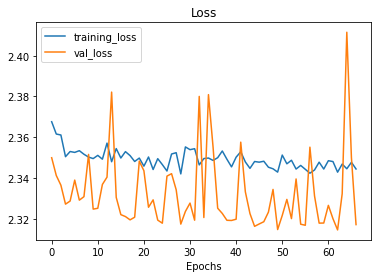

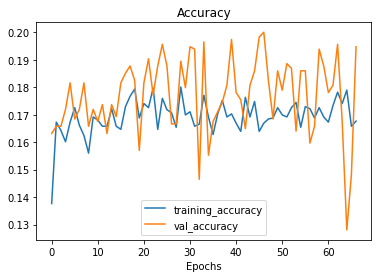

In [221]:
plot_loss_curves(history_21)

In [222]:
# Checking performance on the test set
model_21.evaluate(X_test, y_test)

30/30 [==============================] - 3s 42ms/step - loss: 4.4929 - tp: 27.0000 - fp: 436.0000 - tn: 10014.0000 - fn: 923.0000 - accuracy: 0.0642 - precision: 0.0583 - recall: 0.0284 - f1_score: 0.0222


[4.492930889129639,
 27.0,
 436.0,
 10014.0,
 923.0,
 0.06421052664518356,
 0.05831533297896385,
 0.028421051800251007,
 array([0.10699589, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.10942249, 0.        , 0.05031447, 0.        ,
        0.        , 0.        ], dtype=float32)]

In [223]:
# Now to add the model to our comparisons
results['Model_21'] = ['ResNet50 SGD No Aug',
                      history_21.history['val_accuracy'][-1],
                      history_21.history['val_recall'][-1],
                      history_21.history['val_precision'][-1],
                      history_21.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


Oof. It's not even improving. It just sucks.

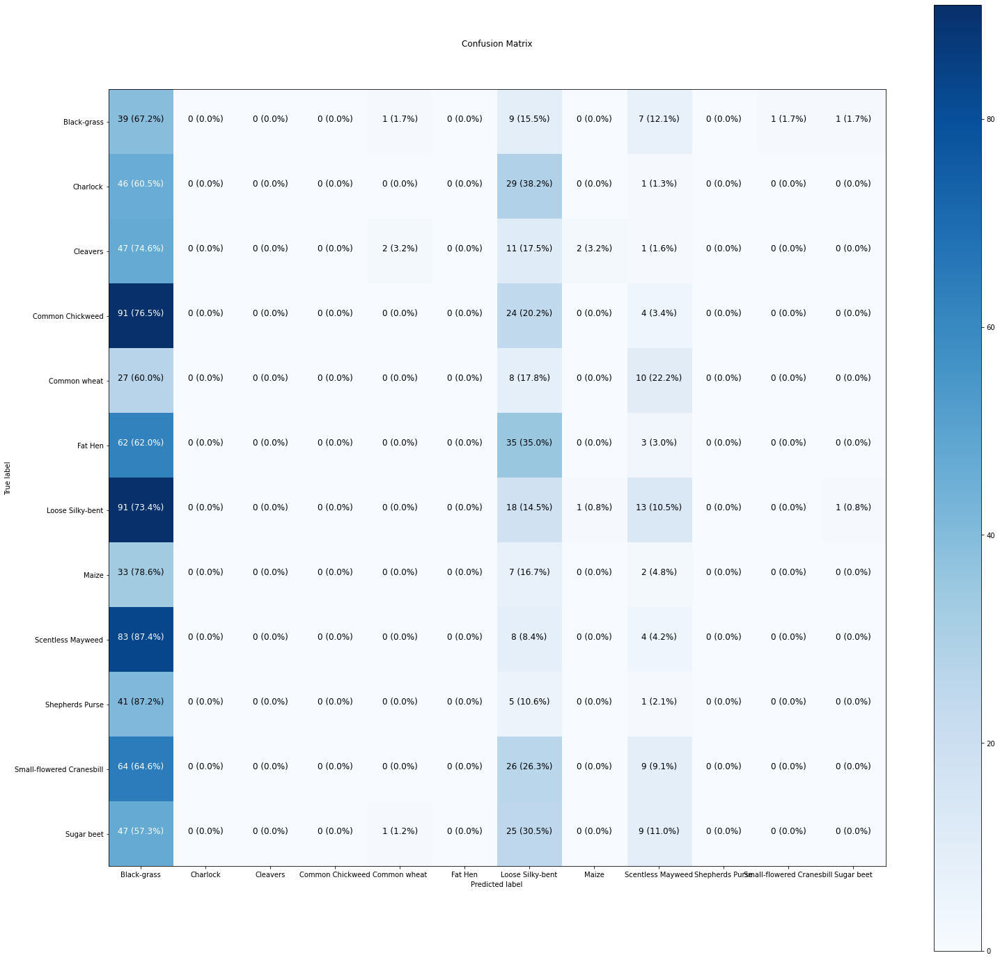

In [224]:
# Make predictions with the model
y_probs = model_21.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

Everything is black-grass!

Haha.

Well. I guess SGD and removing the augmentations didn't help any. I did better with my TinyVGG models.

I had high hopes for ResNet50 but perhaps it's overkill for my tiny dataset.

# Hypertuning TinyVGG (the Baseline)



Ok, let's make some changes to our fully augmented model to see if we can boost performance.

First, the reason I tried ResNet50 was because all indications were that a deeper network is supposed to work better for image classification. Clearly, ResNet50 was overkill. However, I think adding another set of Conv2D and another pooling layer is warranted.

Then I want to run some tests to find the optimal learning rate. To do this, I'm going to make a learning-rate callback and then plot it out.

Model_22 is not a model for predictions. We're just using it to find an optimal learning rate.

## Optimal Learning Rate

In [225]:
# Set random seed
tf.random.set_seed(42)

# Still using TinyVGG
model_22 = Sequential([
                      tf.keras.layers.Resizing(128,128), #Resize to 128
                      tf.keras.layers.Rescaling(1./255),  #Scaling all values to be between 0 and 1
                      tf.keras.layers.RandomZoom(0,.5), # Randomly zooming between +0% and +50%
                      tf.keras.layers.RandomRotation(factor=(-1,1)), # Randomly rotating between 0 and 360 degrees either direction
                      tf.keras.layers.RandomFlip(), # flipping horizontal and vertical randomly
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_22.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=METRICS)

# Create a learning rate scheduler callback
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-4 * 10**(epoch/20)) # traverse a set of learning rate values starting from 1e-4, increasing by 10**(epoch/20) every epoch



#Fitting with the images
history_22= model_22.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=60, # We need lots of epochs to graph this baby out.
            class_weight=class_weights,
            validation_split = 0.3,
            callbacks=[lr_scheduler])

Epoch 1/60
84/84 [==============================] - 5s 31ms/step - loss: 2.4988 - tp: 27.0000 - fp: 436.0000 - tn: 39274.0000 - fn: 3583.0000 - accuracy: 0.0798 - precision: 0.0583 - recall: 0.0075 - f1_score: 0.0474 - val_loss: 2.4833 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.0632 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0300 - lr: 1.0000e-04
Epoch 2/60
84/84 [==============================] - 2s 22ms/step - loss: 2.4677 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 29260.0000 - fn: 2660.0000 - accuracy: 0.0767 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0343 - val_loss: 2.4313 - val_tp: 0.0000e+00 - val_fp: 0.0000e+00 - val_tn: 12540.0000 - val_fn: 1140.0000 - val_accuracy: 0.0772 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0348 - lr: 1.1220e-04
Epoch 3/60
84/84 [==============================] - 2s 22ms/step - loss: 2.3615 - tp: 0.0000e+00 - fp: 1.0000 - tn: 2

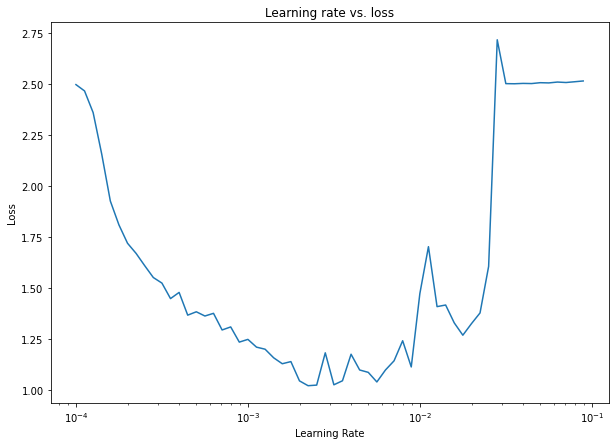

In [226]:
# Plot the learning rate versus the loss
lrs = 1e-4 * (10 ** (np.arange(60)/20))
plt.figure(figsize=(10, 7))
plt.semilogx(lrs, history_22.history["loss"]) # we want the x-axis (learning rate) to be log scale
plt.xlabel("Learning Rate")
plt.ylabel("Loss")
plt.title("Learning rate vs. loss");

The rule of thumb here is that the learning rate value where the loss is still decreasing but not flattened out, usually about 10x smaller than the bottom of the curve.

That puts us somewhere between .001 and .003.

I'm going to say .001 looks pretty good, because it jumps up right there and really flattens out.

However, that means we're already using the best learning rate, because the default learning rate for Adam is .001. Well. We checked at least.

## Optimal Depth

The reason I tried ResNet50 was the depth. Clearly it was too much, but that doesn't mean I can't try adding some additional Conv2D layers.

I'm going to go way overkill on the number of epochs and rely on the callbacks to give me the optimal model.

In [227]:
# Set random seed
tf.random.set_seed(42)

# Still using TinyVGG, but this time with augmentation layers!
model_23 = Sequential([
                      tf.keras.layers.Resizing(128,128), #Resize to 128
                      tf.keras.layers.Rescaling(1./255),  #Scaling all values to be between 0 and 1
                      tf.keras.layers.RandomZoom(0,.5), # Randomly zooming between +0% and +50%
                      tf.keras.layers.RandomRotation(factor=(-1,1)), # Randomly rotating between 0 and 360 degrees either direction
                      tf.keras.layers.RandomFlip(), # flipping horizontal and vertical randomly
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),# Adding three more layers here.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_23.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(0.001),
                metrics=METRICS)

#Fitting with the images
history_23= model_23.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=200,
            class_weight=class_weights,
            validation_split = 0.3,
            callbacks=[mc])

Epoch 1/200
84/84 [==============================] - 5s 34ms/step - loss: 2.4727 - tp: 5.0000 - fp: 10.0000 - tn: 41790.0000 - fn: 3795.0000 - accuracy: 0.1116 - precision: 0.3333 - recall: 0.0013 - f1_score: 0.0685 - val_loss: 2.6601 - val_tp: 38.0000 - val_fp: 165.0000 - val_tn: 12375.0000 - val_fn: 1102.0000 - val_accuracy: 0.0807 - val_precision: 0.1872 - val_recall: 0.0333 - val_f1_score: 0.0357
Epoch 2/200
84/84 [==============================] - 2s 24ms/step - loss: 2.4411 - tp: 0.0000e+00 - fp: 7.0000 - tn: 29253.0000 - fn: 2660.0000 - accuracy: 0.1120 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0765 - val_loss: 2.3909 - val_tp: 0.0000e+00 - val_fp: 1.0000 - val_tn: 12539.0000 - val_fn: 1140.0000 - val_accuracy: 0.0702 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0385
Epoch 3/200
84/84 [==============================] - 3s 33ms/step - loss: 2.1493 - tp: 54.0000 - fp: 40.0000 - tn: 29220.0000 - fn: 2606.0000 - accuracy: 0.1955 - precision

In [228]:
# Checking performance on the test set
model_23.evaluate(X_test, y_test)

30/30 [==============================] - 0s 13ms/step - loss: 0.4571 - tp: 803.0000 - fp: 122.0000 - tn: 10328.0000 - fn: 147.0000 - accuracy: 0.8537 - precision: 0.8681 - recall: 0.8453 - f1_score: 0.8412


[0.4570905268192291,
 803.0,
 122.0,
 10328.0,
 147.0,
 0.8536841869354248,
 0.8681080937385559,
 0.8452631831169128,
 array([0.57407403, 0.9487179 , 0.9       , 0.9338843 , 0.8913044 ,
        0.8969072 , 0.80165297, 0.85106385, 0.8181818 , 0.7169811 ,
        0.93658537, 0.8251748 ], dtype=float32)]

In [229]:
# Now to add the model to our comparisons
results['Model_23'] = ['Deep TinyVGG',
                      history_23.history['val_accuracy'][-1],
                      history_23.history['val_recall'][-1],
                      history_23.history['val_precision'][-1],
                      history_23.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


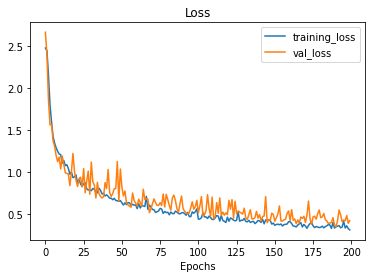

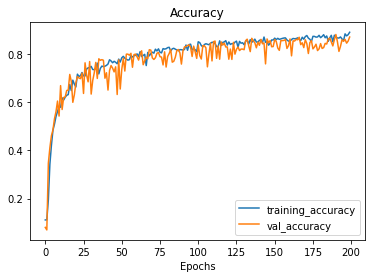

In [230]:
plot_loss_curves(history_23)

The extra depth plus some extra epochs really made a killer model.



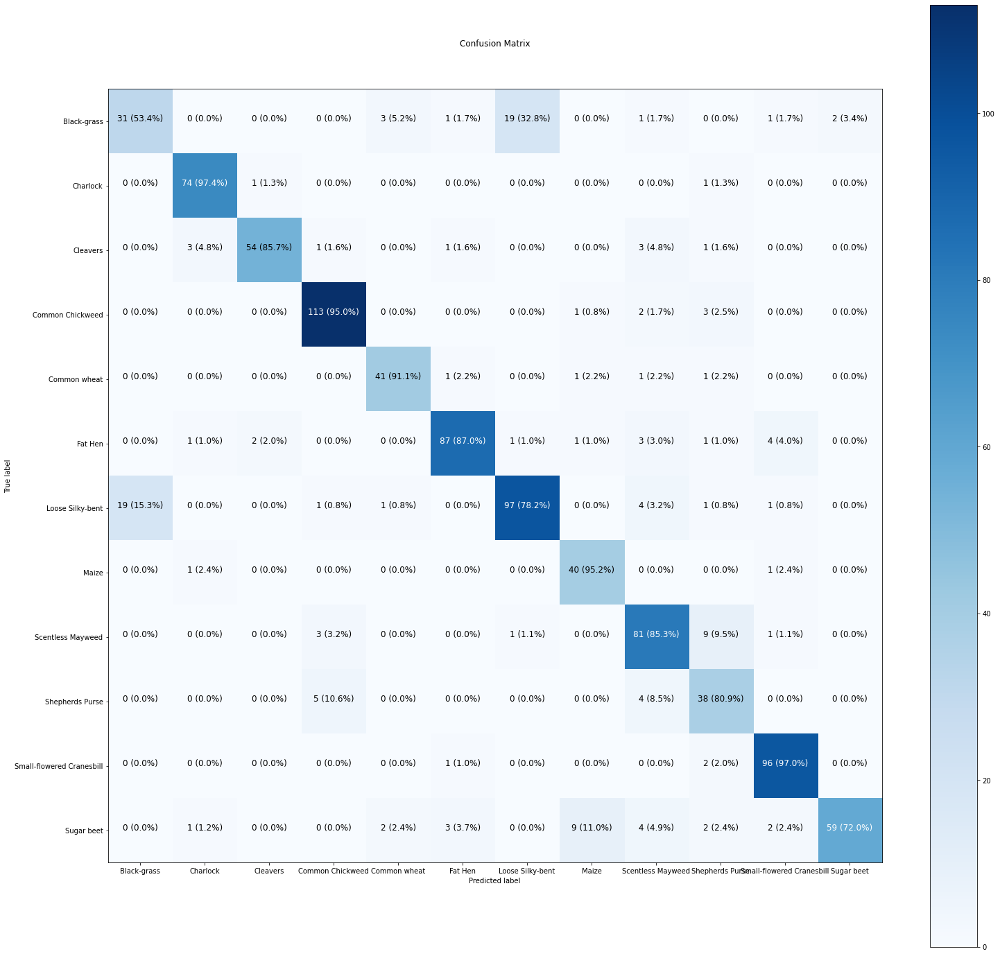

In [231]:
# Make predictions with the model
y_probs = model_23.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

It got common wheat! Yes!

I don't think we can beat this without creating a separate model for black grass and loose silky bent.

My only idea is to adjust the number of filters.

## Adjusting the filters

My theory is that the number of filter prior to the first max pool will have the largest impact because that is the section that is extracting coarse features, which are then finetuned by later layers. So, I want to try boosting the initial number of filters to see if we can eek out a little better performance.

In [232]:
# Set random seed
tf.random.set_seed(42)

# Still using TinyVGG, but this time with augmentation layers!
model_24 = Sequential([
                      tf.keras.layers.Resizing(128,128), #Resize to 128
                      tf.keras.layers.Rescaling(1./255),  #Scaling all values to be between 0 and 1
                      tf.keras.layers.RandomZoom(0,.5), # Randomly zooming between +0% and +50%
                      tf.keras.layers.RandomRotation(factor=(-1,1)), # Randomly rotating between 0 and 360 degrees either direction
                      tf.keras.layers.RandomFlip(), # flipping horizontal and vertical randomly
                      Conv2D(20,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(20,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),# Adding three more layers here.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_24.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(0.001),
                metrics=METRICS)

#Fitting with the images
history_24= model_24.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=100,
            class_weight=class_weights,
            validation_split = 0.3)

Epoch 1/100
84/84 [==============================] - 6s 38ms/step - loss: 2.4829 - tp: 805.0000 - fp: 125.0000 - tn: 39585.0000 - fn: 2805.0000 - accuracy: 0.2953 - precision: 0.8656 - recall: 0.2230 - f1_score: 0.3011 - val_loss: 2.5091 - val_tp: 9.0000 - val_fp: 43.0000 - val_tn: 12497.0000 - val_fn: 1131.0000 - val_accuracy: 0.0895 - val_precision: 0.1731 - val_recall: 0.0079 - val_f1_score: 0.0499
Epoch 2/100
84/84 [==============================] - 2s 28ms/step - loss: 2.2664 - tp: 21.0000 - fp: 23.0000 - tn: 29237.0000 - fn: 2639.0000 - accuracy: 0.1744 - precision: 0.4773 - recall: 0.0079 - f1_score: 0.1622 - val_loss: 2.0130 - val_tp: 33.0000 - val_fp: 11.0000 - val_tn: 12529.0000 - val_fn: 1107.0000 - val_accuracy: 0.2132 - val_precision: 0.7500 - val_recall: 0.0289 - val_f1_score: 0.1768
Epoch 3/100
84/84 [==============================] - 2s 27ms/step - loss: 1.9215 - tp: 149.0000 - fp: 90.0000 - tn: 29170.0000 - fn: 2511.0000 - accuracy: 0.2865 - precision: 0.6234 - recall:

In [233]:
# Checking performance on the test set
model_24.evaluate(X_test, y_test)

30/30 [==============================] - 1s 16ms/step - loss: 0.5498 - tp: 742.0000 - fp: 138.0000 - tn: 10312.0000 - fn: 208.0000 - accuracy: 0.8126 - precision: 0.8432 - recall: 0.7811 - f1_score: 0.8118


[0.5498230457305908,
 742.0,
 138.0,
 10312.0,
 208.0,
 0.8126316070556641,
 0.8431817889213562,
 0.7810526490211487,
 array([0.52380955, 0.87058824, 0.8666666 , 0.91150445, 0.82758623,
        0.85572135, 0.5968586 , 0.82828283, 0.8648648 , 0.8333334 ,
        0.9552239 , 0.8076923 ], dtype=float32)]

In [234]:
# Now to add the model to our comparisons
results['Model_24'] = ['Deep TinyVGG + Filters',
                      history_24.history['val_accuracy'][-1],
                      history_24.history['val_recall'][-1],
                      history_24.history['val_precision'][-1],
                      history_24.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


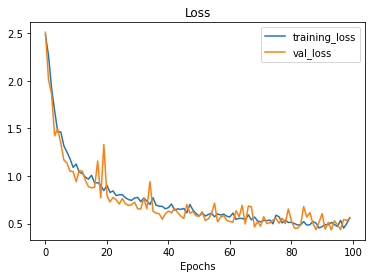

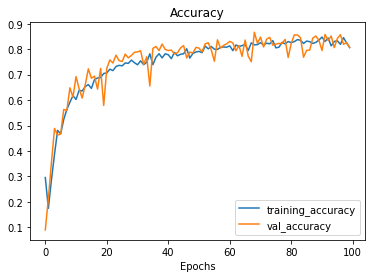

In [235]:
plot_loss_curves(history_24)

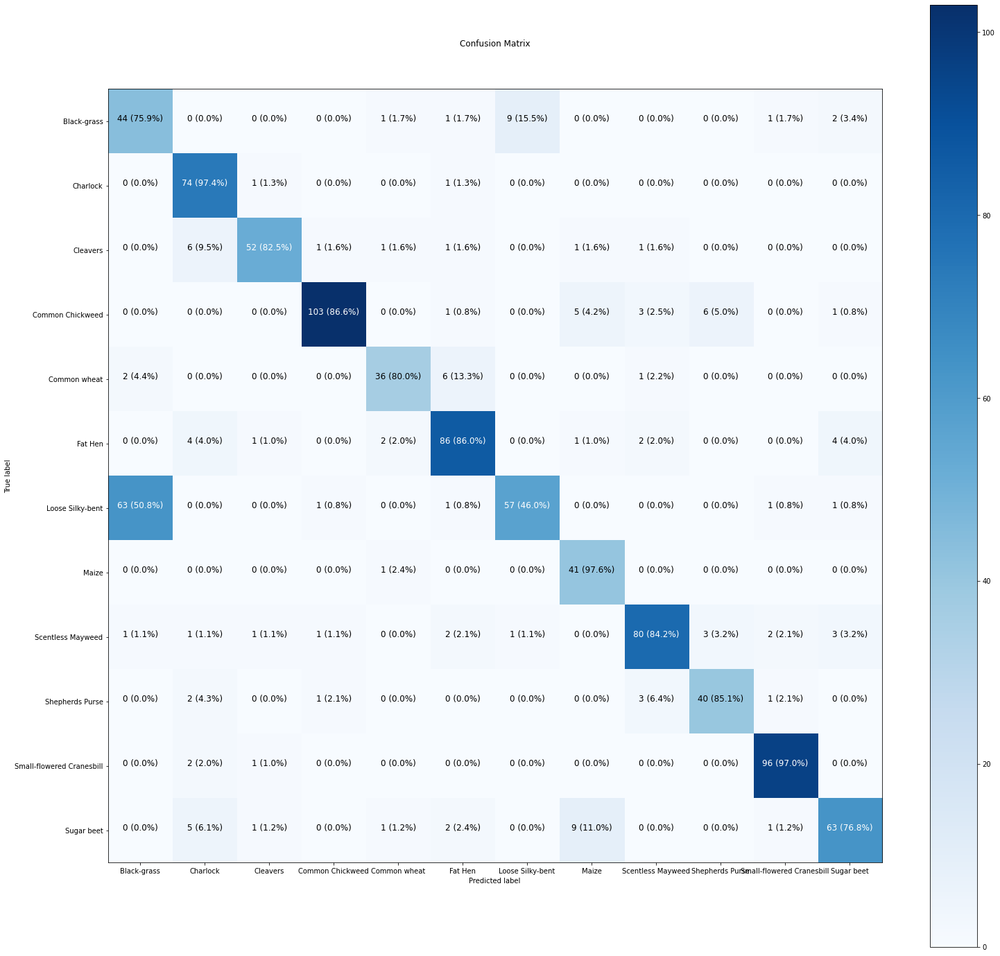

In [236]:
# Make predictions with the model
y_probs = model_24.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

Changing the filters ultimately made it identify loose silky bent as black grass at higher rates. It made it less, not more, able to handle this problem case.

The only thing I have left to do then is to just really increase the number of epochs to see if I can eek out enough to get past .90. I don't think I'll be able to do any better.

## All the epochs!

I'm going to let model 23 run a bit longer and use the callback to save the best model, then load that model and see if we can get an optimal performance.

In [237]:
# # I'll just continue training here. 20 more epochs!
# history_25= model_23.fit(x=X_train,
#             y=y_train,
#             batch_size=32,
#             epochs=20,
#             class_weight=class_weights,
#             validation_split = 0.3)

It's hard to say which number of epochs is optimal. We're going to go way overboard and rely on our callback to give us the best result.

In [238]:
# # Set random seed
# tf.random.set_seed(42)

# # Still using TinyVGG
# model_26 = Sequential([
#                       tf.keras.layers.Resizing(128,128), #Resize to 128
#                       tf.keras.layers.Rescaling(1./255),  #Scaling all values to be between 0 and 1
#                       tf.keras.layers.RandomZoom(0,.5), # Randomly zooming between +0% and +50%
#                       tf.keras.layers.RandomRotation(factor=(-1,1)), # Randomly rotating between 0 and 360 degrees either direction
#                       tf.keras.layers.RandomFlip(), # flipping horizontal and vertical randomly
#                       Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
#                       Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
#                       MaxPool2D(), #default pool size is 2.
#                       Conv2D(10,3, activation='relu'),
#                       Conv2D(10,3, activation='relu'),# Adding three more layers here.
#                       Conv2D(10,3, activation='relu'),
#                       Conv2D(10,3, activation='relu'),
#                       Conv2D(10,3, activation='relu'),
#                       MaxPool2D(),
#                       Flatten(),
#                       Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
#                       ])

# #compiling in the same manner as well
# model_26.compile(loss='categorical_crossentropy',
#                 optimizer=tf.keras.optimizers.Adam(0.001),
#                 metrics=METRICS)

# #Fitting with the images
# history_26= model_26.fit(x=X_train,
#             y=y_train,
#             batch_size=32,
#             epochs=210,
#             class_weight=class_weights,
#             validation_split = 0.3,
#             callbacks=[mc])

In [239]:
# # Checking performance on the test set
# model_26.evaluate(X_test, y_test)

In [240]:
# plot_loss_curves(history_26)

In [241]:
# # Now to add the model to our comparisons
# results['Model_26'] = ['Deep TinyVGG extra epochs',
#                       history_26.history['val_accuracy'][-1],
#                       history_26.history['val_recall'][-1],
#                       history_26.history['val_precision'][-1],
#                       history_26.history['val_f1_score'][-1].mean()]
# results.T

It seems like I overdid it. Although the validation set is better on this model, the original DeepVGG did better on the test set. We'll just call it a day with that as our final model.

In [242]:
# # Make predictions with the model
# y_probs = model_26.predict(X_test) #Get the probability each image is what category
# y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

# y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

# make_confusion_matrix(y_true=y_true, 
#                       y_pred=y_preds,
#                       classes=plant_names2,
#                       figsize=(25, 25),
#                       text_size=12)

I am a bit disappointed I never managed to get black grass and loose silky bent to be fixed. I feel good I got Common Wheat to fall in line, though.

I have one last thing I want to try. I'd like to try adding a dropout layer.

Normally these are only used when there is overfit, and we're not seeing any overfit, but it's something I haven't tried yet.

## Dropout layers

I'm not seeing any overfitting based on the trend lines and test vs. training scores. So, I'm only going to dropout a small number of nodes.

In [243]:
# Set random seed
tf.random.set_seed(42)

# Still using TinyVGG, but this time with augmentation layers!
model_27 = Sequential([
                      tf.keras.layers.Resizing(128,128), #Resize to 128
                      tf.keras.layers.Rescaling(1./255),  #Scaling all values to be between 0 and 1
                      tf.keras.layers.RandomZoom(0,.5), # Randomly zooming between +0% and +50%
                      tf.keras.layers.RandomRotation(factor=(-1,1)), # Randomly rotating between 0 and 360 degrees either direction
                      tf.keras.layers.RandomFlip(), # flipping horizontal and vertical randomly
                      Conv2D(10,3, activation='relu', input_shape=(128, 128,3)), #Input shape is same as image size
                      Conv2D(10,3, activation='relu'), # 10 filters, kernel size 3
                      MaxPool2D(), #default pool size is 2.
                      tf.keras.layers.Dropout(0.1),
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),# Adding three more layers here.
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      Conv2D(10,3, activation='relu'),
                      MaxPool2D(),
                      tf.keras.layers.Dropout(0.1),
                      Flatten(),
                      Dense(12,activation='softmax') # Same number of neurons as our number of categories (12)
                      ])

#compiling in the same manner as well
model_27.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(0.001),
                metrics=METRICS)

#Fitting with the images
history_27= model_27.fit(x=X_train,
            y=y_train,
            batch_size=32,
            epochs=200,
            class_weight=class_weights,
            validation_split = 0.3,
            callbacks=[es])

Epoch 1/200
84/84 [==============================] - 5s 34ms/step - loss: 2.4691 - tp: 745.0000 - fp: 146.0000 - tn: 39564.0000 - fn: 2865.0000 - accuracy: 0.2859 - precision: 0.8361 - recall: 0.2064 - f1_score: 0.3105 - val_loss: 2.4555 - val_tp: 2.0000 - val_fp: 5.0000 - val_tn: 12535.0000 - val_fn: 1138.0000 - val_accuracy: 0.0702 - val_precision: 0.2857 - val_recall: 0.0018 - val_f1_score: 0.0451
Epoch 2/200
84/84 [==============================] - 2s 25ms/step - loss: 2.2001 - tp: 54.0000 - fp: 49.0000 - tn: 29211.0000 - fn: 2606.0000 - accuracy: 0.1733 - precision: 0.5243 - recall: 0.0203 - f1_score: 0.1637 - val_loss: 1.9609 - val_tp: 60.0000 - val_fp: 64.0000 - val_tn: 12476.0000 - val_fn: 1080.0000 - val_accuracy: 0.2333 - val_precision: 0.4839 - val_recall: 0.0526 - val_f1_score: 0.2005
Epoch 3/200
84/84 [==============================] - 2s 25ms/step - loss: 1.8911 - tp: 143.0000 - fp: 89.0000 - tn: 29171.0000 - fn: 2517.0000 - accuracy: 0.3011 - precision: 0.6164 - recall: 

In [244]:
# Checking performance on the test set
model_27.evaluate(X_test, y_test)

30/30 [==============================] - 0s 11ms/step - loss: 0.5378 - tp: 757.0000 - fp: 135.0000 - tn: 10315.0000 - fn: 193.0000 - accuracy: 0.8200 - precision: 0.8487 - recall: 0.7968 - f1_score: 0.8222


[0.5378365516662598,
 757.0,
 135.0,
 10315.0,
 193.0,
 0.8199999928474426,
 0.8486546874046326,
 0.796842098236084,
 array([0.55319154, 0.8915663 , 0.78431374, 0.907489  , 0.8282829 ,
        0.849162  , 0.69230765, 0.9638555 , 0.79545456, 0.85393256,
        0.9538461 , 0.7934783 ], dtype=float32)]

In [246]:
# Now to add the model to our comparisons
results['Model_27'] = ['Deep TinyVGG dropout',
                      history_27.history['val_accuracy'][-1],
                      history_27.history['val_recall'][-1],
                      history_27.history['val_precision'][-1],
                      history_27.history['val_f1_score'][-1].mean()]
results.T

,Model Description,Accuracy,Recall,Precision,F1 Score
Model_1,baseline,0.614035,0.598246,0.644004,0.558238
Model_2,baseline + blur,0.622807,0.574561,0.6643,0.570552
Model_3,baseline + grayscale,0.230702,0.205263,0.250267,0.214912
Model_4,Just Red baseline,0.402632,0.378947,0.423529,0.372141
Model_5,CIE XYZ colorspace,0.164035,0.0807018,0.155668,0.14748
Model_6,Full ycbcr colorspace,0.25614,0.230702,0.273958,0.227347
Model_7,Just cr colorspace,0.139474,0,0,0.0204003
Model_8,cbcr colorspace,0.385965,0.214912,0.571096,0.311894
Model_9,BGR,0.616667,0.574561,0.666328,0.579221
Model_10,Random Zoom,0.663158,0.557018,0.74269,0.579235


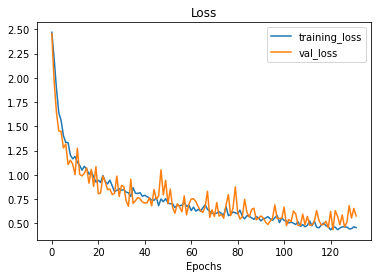

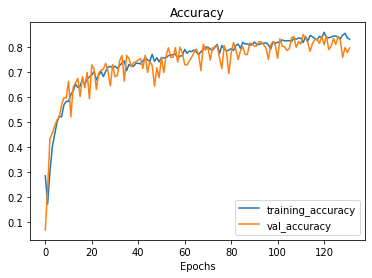

In [247]:
plot_loss_curves(history_27)

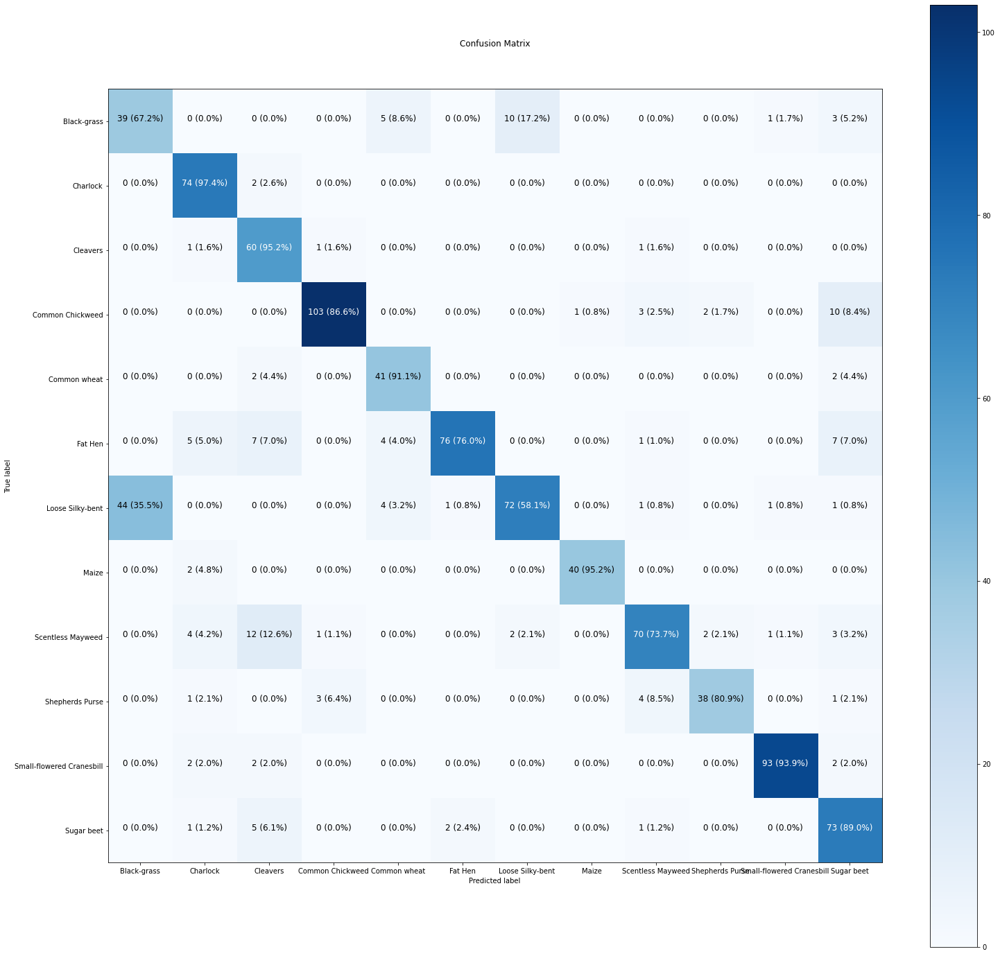

In [248]:
# Make predictions with the model
y_probs = model_27.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

Ok, dropout didn't help any. Let's just load the best model from model_23 and check it out.

In [249]:
final_model = tf.keras.models.load_model('/content/drive/MyDrive/UT_Course_project_notebooks/best_model.h5')
final_model.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_11 (Resizing)      (None, 128, 128, 3)       0         
                                                                 
 rescaling_11 (Rescaling)    (None, 128, 128, 3)       0         
                                                                 
 random_zoom_4 (RandomZoom)  (None, 128, 128, 3)       0         
                                                                 
 random_rotation_4 (RandomRo  (None, 128, 128, 3)      0         
 tation)                                                         
                                                                 
 random_flip_4 (RandomFlip)  (None, 128, 128, 3)       0         
                                                                 
 conv2d_44 (Conv2D)          (None, 126, 126, 10)      280       
                                                     

In [250]:
final_model.evaluate(X_test, y_test)

30/30 [==============================] - 1s 12ms/step - loss: 0.3625 - tp: 826.0000 - fp: 97.0000 - tn: 10353.0000 - fn: 124.0000 - accuracy: 0.8789 - precision: 0.8949 - recall: 0.8695 - f1_score: 0.8745


[0.36247751116752625,
 826.0,
 97.0,
 10353.0,
 124.0,
 0.878947377204895,
 0.8949078917503357,
 0.8694736957550049,
 array([0.5954199 , 0.9480519 , 0.92800003, 0.9430894 , 0.86868685,
        0.9479166 , 0.78111583, 0.9534884 , 0.85405403, 0.8172043 ,
        0.96000004, 0.89743596], dtype=float32)]

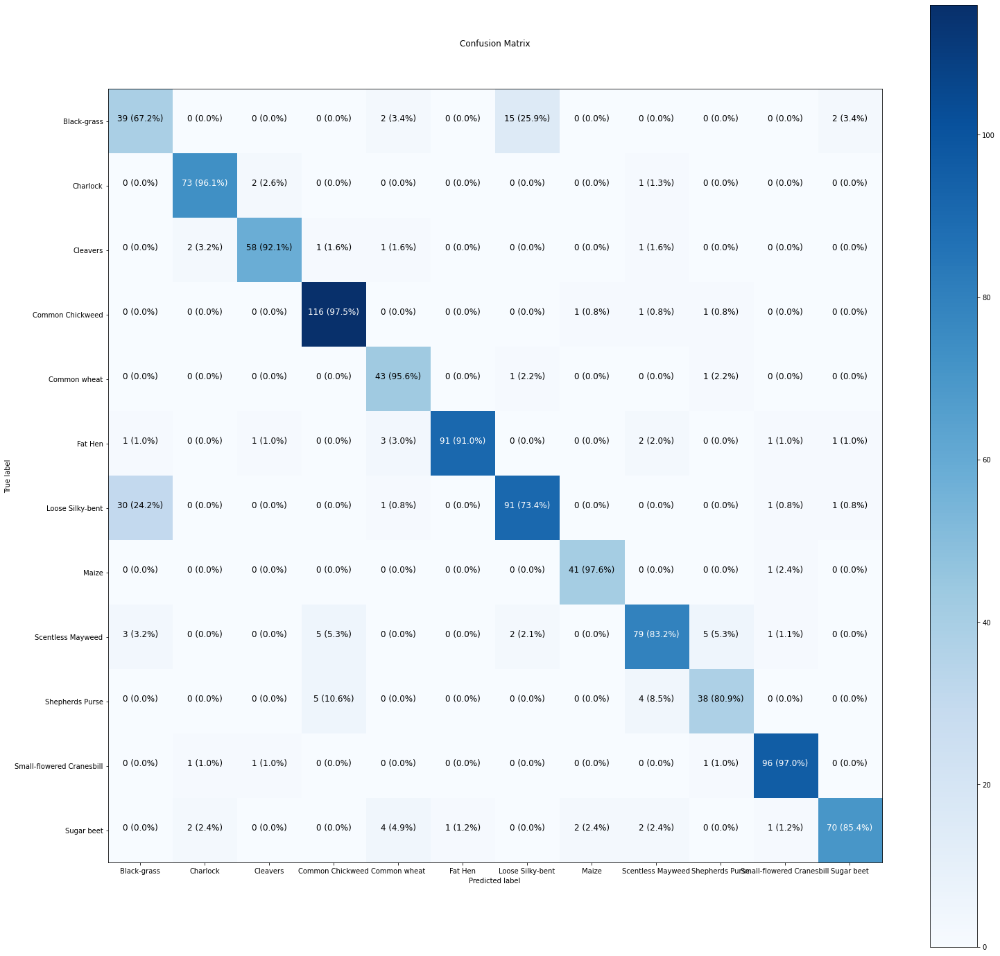

In [251]:
# Make predictions with the model
y_probs = final_model.predict(X_test) #Get the probability each image is what category
y_preds = y_probs.argmax(axis=1) #pick the highest probability to get the best guess

y_true = y_test.argmax(axis=1) #True labels also have to be single integers for confusion matrices

make_confusion_matrix(y_true=y_true, 
                      y_pred=y_preds,
                      classes=plant_names2,
                      figsize=(25, 25),
                      text_size=12)

That's it, the final model, the best iteration of Model_23:

Accuracy: 0.8789 - precision: 0.8949 - recall: 0.8695 - f1_score: 0.8745

An almost 88% accuracy on the test set, with an f1 score of 0.87 despite the imbalanced dataset.

We were able to conquer Common Wheat, but not deal with the black grass loose silky-bent problem.

(If you want to see its history plotted, just look for the highest point on the history_23 plot, above.)

Given the difficulty of the problem and the small dataset, I'd say this is pretty good.

# Conclusions and Insights

I think the largest insight I gained from running these experiments is that bigger really isn't always better when it comes to neural networks. If I expanded the number of layers too much then the performance plummeted. Likewise, going too small limited my performance.

Similarly, the number of filters being increased actually decreased model performance, and quite a lot considering how few filters were actually added.

I knew that in theory more layers and more filters made for a worse model, but I suppose I had always thought "worse" was just longer loading times and increased computational requirements. Instead, I saw actual performance go way, way down.

In previous projects, I found that typically the recall and precision would swing wildly, with one being very high and the other being very low. However, this was not the case with these models: Recall and Precision tended to be about the same. I think this is because most of the errors were within the "grass-like" plant classes, and if the model couldn't figure it out it basically just guessed. We see this with black-grass and loose silky-bent, where they were mistaken for one another at the same rate (about 25% for both directions).

Looking at the final f1 scores, we see that these two classes alone accounted for the large majority of error:

```
[0.5954199 , 0.9480519 , 0.92800003, 0.9430894 , 0.86868685,
        0.9479166 , 0.78111583, 0.9534884 , 0.85405403, 0.8172043 ,
        0.96000004, 0.89743596]
```
As a reminder, these f1 scores are the f1 score per class. Black-grass is class 0 (the 0.59) and loose-silky bent was class 6 (the 0.78). They clearly lagged behind every other class.

If I were to proceed with this project, I would expand these datasets with more offline data augmentation, flipping, blurring, and rotating the pictures of these plants to increase their datasets. This would help the model learn them better.

I could also separate them out, and create a separate model for the "grasses."

However, I have limited time, and as such I have decided to call it here for now.

I also saw just how differently AI sees the world from humans. I'm still shocked that the cr color space didn't help the computer identify where the leaves of the plant were: It helped me identify them it made the leaves so clear. Even the grasses were obvious. Yet, the neural net needed the color channels to make fine distinctions.

Overall, I am very excited to be working with computer vision and I thoroughly enjoyed this project.